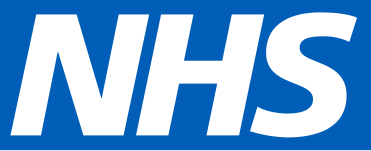
# NHS Adequacy of Staff and Network Capacity Analysis

## Aim of the analysis
NHS's goal is to ensure fair access to healthcare to all population groups while sustainably offering good quality service. 

Currently, stakeholders have conflicting views with some believing the capacity is adequate and a re-allocation of resources is all that's needed, while others believe an expansion is required. 

This makes the thorough assessment of the data critically important for the NHS to meet current and future healthcare coverage and quality.


### Data provided

The project relies on data from the following files:

 - actual_duration.csv
 - appointment_regional.csv
 - national_categories.xlsx
 - tweets.csv
 - metadata_nhs.txt

***actual_duration*** Includes a granular daily view of the actual duration of appointments. The data is captured by region-ons-codes, icb-ons-code, and sub-icb-location names and codes. 

***appointment_regional*** Includes a monthly record of the time between the appointment booking and the actual consultation. The data also gives details on the appointment status, the hcp-type and the appointment modes.

***national_categories*** Includes a daily record of the service setting, the context type and the national category of appointments together with their counts.

***tweets*** Includes a list of tweet IDs with the tweet body including their hashtags, the number of retweets and favorites.

***metadata_nhs*** Includes the metadata for the actual-duration, appointment_regional and national_categories files. 

### Approach Planning
The approach includes the following preliminary steps:
- Importing the data and an initial check of all imported DataFrames
- Importing a regions' DataFrame to make the visualizations easier to read and follow
- Checking the data types of all columns and adjusting the ones that need adjustment
- Add a seasons column and an appointment month string for the visualizations
- Descriptive statistics of all DataFrames
- Check for null values in the DataFrames
- Defining useful user-defined functions to reduce the analysis steps 
- Boxplots for all DataFrames
- Check for commonalities between the DataFrames
- Follow the following 6 categories to make sure all relevant areas are covered by the analysis

To answer the business problem, the answer was subdivided into 6 main categories or areas of analysis:
- Utilization/Appointment: This mainly covers all appointment counts, types, categories and there trends
- Regional/Seasonal: This section covers all seasonal and regional trends
- Cris Management: This includes taking a closer look at the pandemic months and how it affected the network
- Population needs: This incorporates additional forecast data related to the population's growth and age between 2022 and 2030
- Staff: This also incorporates additional data related to the number of FTE (Full Time Equivalent) Staff together with their age and position.
-  External Sources (Twitter): Examines the provided data to see it's usefulness in achieving the NHS's goal in offering good quality healthcare service

Limitations of the analysis:
The provided data doesn't include information on:
- population data
- names of the regions served (Not there codes)
- number of current patients' served by the network
- number of FTE staff in the network with their positions
- breakdown of the patients to staff ratio by region

External sources: 
The analysis relied on external sources to cover the limitations in the provided data and this includes:
- Region names
- Staff on FTE basis data
- Population forecast between 2022 and 2030

### NHS Identity Guidelines and Colours

- NHS Dark Blue: #003087
- NHS Blue: #005EB8
- NHS Ligh Blue: #41B6E6
- NHS Aqua Blue: #00A9CE
- NHS Aqua Green: #00A499
- NHS Purple: #330072
- NHS Dark Pink: #7C2855
- NHS Pink: #AE2573
- NHS Dark Red: #8A1538
- NHS Red: #DA291C
- NHS Orange: #ED8B00

Source: https://www.england.nhs.uk/nhsidentity/identity-guidelines/colours/

In [7]:
nhs_colors = [
    '#003087',  # NHS Dark Blue
    '#00A499',  # NHS Aqua Green
    '#005EB8',  # NHS Blue
    '#330072',  # NHS Purple
    '#41B6E6',  # NHS Light Blue
    '#AE2573',  # NHS Pink
    '#00A9CE',  # NHS Aqua Blue
    '#7C2855',  # NHS Dark Pink
    '#8A1538',  # NHS Dark Red
    '#DA291C',  # NHS Red
    '#ED8B00'   # NHS Orange
]

# 1. Prepping the data for exploration

## Notebook preparation
This section mainly is the initial setup of the notebook.

The following steps are included:
- Importing the required libraries
- Setting up the working directory
- Ignoring the warnings

In [10]:
# Import the necessary libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import os

# Scraping Libraries
import requests
import bs4
from bs4 import BeautifulSoup

# Calendar Library
import calendar
from datetime import datetime

# Data Files are in a 'data' folder

# Ignore warnings
import warnings
warnings.filterwarnings('ignore')

## Importing the data files into the Notebook

This includes all original data files:
- actual_duration.csv
- appointments_regional.csv
- national_categories.xlsx
- tweets.csv

It would also include the import of extra data files that would be provided in the project's folder:
- location_region.csv
- project_population.xlsx
- directors_fte.xlsx
- direct_patientcare_fte.xlsx
- admin_nonclinical.xlsx
  
This phase would also include initial assessments / checks of the data sets.

### Initial **actual_duration** assessment:
- Check the data types of all columns to make sure they match the information in the cells
- Information in the actual_duration column will have to be extracted and manipulated to allow for calculations and easy visualizations

In [13]:
# Import and sense-check the actual_duration.csv data set as ad
ad = pd.read_csv('data/actual_duration.csv')

# View the ad DataFrame
ad.head()

,sub_icb_location_code,sub_icb_location_ons_code,sub_icb_location_name,icb_ons_code,region_ons_code,appointment_date,actual_duration,count_of_appointments
0,00L,E38000130,NHS North East and North Cumbria ICB - 00L,E54000050,E40000012,01-Dec-21,31-60 Minutes,364
1,00L,E38000130,NHS North East and North Cumbria ICB - 00L,E54000050,E40000012,01-Dec-21,21-30 Minutes,619
2,00L,E38000130,NHS North East and North Cumbria ICB - 00L,E54000050,E40000012,01-Dec-21,6-10 Minutes,1698
3,00L,E38000130,NHS North East and North Cumbria ICB - 00L,E54000050,E40000012,01-Dec-21,Unknown / Data Quality,1277
4,00L,E38000130,NHS North East and North Cumbria ICB - 00L,E54000050,E40000012,01-Dec-21,16-20 Minutes,730


### Initial **appointmens_regional** assessment:
- Check the data types of all columns to make sure they match the information in the cells
- Information in the time_between_book_and_appointment column will have to be extracted
  and manipulated to allow for calculations and easy visualizations

In [15]:
# Import and sense-check the appointments_regional.csv data set as ar
ar = pd.read_csv('data/appointments_regional.csv')

# View the ar DataFrame
ar.head()

,icb_ons_code,appointment_month,appointment_status,hcp_type,appointment_mode,time_between_book_and_appointment,count_of_appointments
0,E54000034,2020-01,Attended,GP,Face-to-Face,1 Day,8107
1,E54000034,2020-01,Attended,GP,Face-to-Face,15 to 21 Days,6791
2,E54000034,2020-01,Attended,GP,Face-to-Face,2 to 7 Days,20686
3,E54000034,2020-01,Attended,GP,Face-to-Face,22 to 28 Days,4268
4,E54000034,2020-01,Attended,GP,Face-to-Face,8 to 14 Days,11971


### Initial **national_categories** assessment:
- Check the data types of all columns to make sure they match the information in the cells

In [17]:
# Import and sense-check the national_categories.xlsx data set as nc
nc = pd.read_excel('data/national_categories.xlsx')

# View the DataFrame
nc.head()

,appointment_date,icb_ons_code,sub_icb_location_name,service_setting,context_type,national_category,count_of_appointments,appointment_month
0,2021-08-02,E54000050,NHS North East and North Cumbria ICB - 00L,Primary Care Network,Care Related Encounter,Patient contact during Care Home Round,3,2021-08
1,2021-08-02,E54000050,NHS North East and North Cumbria ICB - 00L,Other,Care Related Encounter,Planned Clinics,7,2021-08
2,2021-08-02,E54000050,NHS North East and North Cumbria ICB - 00L,General Practice,Care Related Encounter,Home Visit,79,2021-08
3,2021-08-02,E54000050,NHS North East and North Cumbria ICB - 00L,General Practice,Care Related Encounter,General Consultation Acute,725,2021-08
4,2021-08-02,E54000050,NHS North East and North Cumbria ICB - 00L,General Practice,Care Related Encounter,Structured Medication Review,2,2021-08


### Initial **tweets** assessment:
- Check the data types of all columns to make sure they match the information in the cells

In [19]:
# Import and sense-check the tweets.csv data set as tw.
tw = pd.read_csv('data/tweets.csv')

# Saving the original imported csv file as tw_raw for future references and checking
tw_raw = tw

# View the tw DataFrame
tw.head()

,tweet_id,tweet_full_text,tweet_entities,tweet_entities_hashtags,tweet_metadata,tweet_retweet_count,tweet_favorite_count,tweet_favorited,tweet_retweeted,tweet_lang
0,1567629223795527681,As Arkansas’ first Comprehensive Stroke Certif...,"{'hashtags': [{'text': 'Healthcare', 'indices'...",#Healthcare,"{'iso_language_code': 'en', 'result_type': 're...",0,0,False,False,en
1,1567582846612553728,RT @AndreaGrammer: Work-life balance is at the...,"{'hashtags': [{'text': 'PremiseHealth', 'indic...","#PremiseHealth, #hiring","{'iso_language_code': 'en', 'result_type': 're...",2,0,False,False,en
2,1567582787070304256,RT @OntarioGreens: $10 billion can go a long w...,"{'hashtags': [{'text': 'Healthcare', 'indices'...",#Healthcare,"{'iso_language_code': 'en', 'result_type': 're...",39,0,False,False,en
3,1567582767625428992,RT @modrnhealthcr: 🚨#NEW:🚨 Insurance companies...,"{'hashtags': [{'text': 'NEW', 'indices': [20, ...",#NEW,"{'iso_language_code': 'en', 'result_type': 're...",5,0,False,False,en
4,1567582720460570625,ICYMI: Our recent blogs on Cybersecurity in Ac...,"{'hashtags': [{'text': 'blogs', 'indices': [18...","#blogs, #digitaltransformation, #cybersecurity...","{'iso_language_code': 'en', 'result_type': 're...",0,0,False,False,en


## Importing Regions to all DataFrames

This file was deemed necessary to be able to assess the utilization on a regional level. While the data includes sub-icb-location names it was missing the regions' names and they were essential for better visualization and understanding of the data.

They are essentially **7 regions** and they are as listed below:
 - East of England
 - London
 - Midlands
 - North East and Yorkshire
 - North West
 - South East
 - South West
   
The new data file was downloaded from the following source.

>  Source: https://www.data.gov.uk/dataset/b66d098a-71ab-499c-9f62-1ef74f60f8bf/sub-icb-locations-to-integrated-care-boards-to-nhser-april-2023-lookup-in-en

**Two corrections were made to the imported data file:**

icb_ons_codes E54000063 and E54000064 on the location_region file were replaced with E54000052 and E54000053 after confirming with other sources.
  
> Source: https://www.england.nhs.uk/integratedcare/integrated-care-in-your-area/


In [21]:
# Import 2 columns from the location_region data file
regions = pd.read_csv('data/location_region.csv',usecols=['ICB23CD','NHSER23NM'])
#regions

In [22]:
# Drop the duplicates from the 'ICB23CD'
regions_unique=regions.drop_duplicates(subset='ICB23CD')
#regions_unique

In [23]:
# Print the 'ICB23CD' column for checking
unique = regions_unique['ICB23CD']
#unique


In [24]:
# Define a function to add the region names as a column to the DataFrames
def region(df):
    '''
    This function mainly merges the region column to the DataFrame that is passed to it based on the "icb_ons_code"
    Parameters: 
        df: DataFrame
    Return:
        df: DataFrame with added region column 
    '''
    df=pd.merge(df,
                regions_unique,how='left',
                left_on='icb_ons_code',
                right_on='ICB23CD')
    df=df.drop(columns='ICB23CD')
    df=df.rename(columns={'NHSER23NM':'region'})
    return df

In [25]:
# Apply the region function to merge the region columns to the nc DataFrame
nc=region(nc)
#nc

In [26]:
# Apply the region function to merge the region columns to the ar DataFrame
ar=region(ar)
#ar

In [27]:
# Apply the region function to merge the region columns to the ad DataFrame
ad = region(ad)
#ad

### Test all DataFRrames after adding region columns

This section was mainly used to check all DataFrames after the merge with region names.

## Null Values 
Check all data files to check the number of null values

In [30]:
# Determine whether there are missing values in ad DataFrame.
print('Null Values count in ad DataFrame: ')
print(ad.isnull().sum())

Null Values count in ad DataFrame: 
sub_icb_location_code        0
sub_icb_location_ons_code    0
sub_icb_location_name        0
icb_ons_code                 0
region_ons_code              0
appointment_date             0
actual_duration              0
count_of_appointments        0
region                       0
dtype: int64


In [31]:
# Determine whether there are missing values in ar DataFrame.
print('Null Values count in ar DataFrame: ')
print(ar.isnull().sum())

Null Values count in ar DataFrame: 
icb_ons_code                         0
appointment_month                    0
appointment_status                   0
hcp_type                             0
appointment_mode                     0
time_between_book_and_appointment    0
count_of_appointments                0
region                               0
dtype: int64


In [32]:
# Determine whether there are missing values in nc DataFrame.
print('Null Values count in nc DataFrame: ')
print(nc.isnull().sum())

Null Values count in nc DataFrame: 
appointment_date         0
icb_ons_code             0
sub_icb_location_name    0
service_setting          0
context_type             0
national_category        0
count_of_appointments    0
appointment_month        0
region                   0
dtype: int64


### Missing values identified in the tw DataFrame
The missing values are for tweet_ids with no hashtags. 

This was confirmed by checking the rows with null values.

In [34]:
# Determine whether there are missing values in tw DataFrame.
print('Null Values count in tw DataFrame: ',tw.isnull().sum())

Null Values count in tw DataFrame:  tweet_id                     0
tweet_full_text              0
tweet_entities               0
tweet_entities_hashtags    167
tweet_metadata               0
tweet_retweet_count          0
tweet_favorite_count         0
tweet_favorited              0
tweet_retweeted              0
tweet_lang                   0
dtype: int64


In [35]:
# Filter by the rows with null values in column tweet_entities_hashtags
tw[tw['tweet_entities_hashtags'].isnull()]

,tweet_id,tweet_full_text,tweet_entities,tweet_entities_hashtags,tweet_metadata,tweet_retweet_count,tweet_favorite_count,tweet_favorited,tweet_retweeted,tweet_lang
19,1567581972532174848,"RT @NNOCuba: Quite a claim to infamy, @marcoru...","{'hashtags': [], 'symbols': [], 'user_mentions...",NaN,"{'iso_language_code': 'en', 'result_type': 're...",7,0,False,False,en
27,1567581274088566785,"RT @khaleejtimes: .@BurjeelHoldings, a private...","{'hashtags': [], 'symbols': [], 'user_mentions...",NaN,"{'iso_language_code': 'en', 'result_type': 're...",207,0,False,False,en
28,1567581257823027201,RT @SoniaFurstenau: People in BC are dying of ...,"{'hashtags': [], 'symbols': [], 'user_mentions...",NaN,"{'iso_language_code': 'en', 'result_type': 're...",40,0,False,False,en
38,1567580783598075905,RT @ricochet_en: Health care in Canada is coll...,"{'hashtags': [], 'symbols': [], 'user_mentions...",NaN,"{'iso_language_code': 'en', 'result_type': 're...",72,0,False,False,en
40,1567580673682055168,RT @BambergHealth: Do you want to know about H...,"{'hashtags': [], 'symbols': [], 'user_mentions...",NaN,"{'iso_language_code': 'en', 'result_type': 're...",1,0,False,False,en
...,...,...,...,...,...,...,...,...,...,...
1157,1567583777857101825,RT @kelly_archives: When kidney function decli...,"{'hashtags': [], 'symbols': [], 'user_mentions...",NaN,"{'iso_language_code': 'en', 'result_type': 're...",1,0,False,False,en
1159,1567583678129393665,RT @ricochet_en: Health care in Canada is coll...,"{'hashtags': [], 'symbols': [], 'user_mentions...",NaN,"{'iso_language_code': 'en', 'result_type': 're...",73,0,False,False,en
1160,1567583655689854978,"RT @khaleejtimes: .@BurjeelHoldings, a private...","{'hashtags': [], 'symbols': [], 'user_mentions...",NaN,"{'iso_language_code': 'en', 'result_type': 're...",208,0,False,False,en
1164,1567583442426028037,RT @VBCExhibitHall: 🗞 VBC Newsstand Weekly: “C...,"{'hashtags': [], 'symbols': [], 'user_mentions...",NaN,"{'iso_language_code': 'en', 'result_type': 're...",2,0,False,False,en


## DataFrames checks
This includes printing the DataFrames' shape and info.

The descriptive statistics (describe function will only be applied once all columns have been set to their correct data types. 

In [37]:
# Sense checking the ad DataFrame.
# Print the ad.shape.
print('ad Shape: \n',ad.shape)

# Print empty space between print commands for better readability
print()

# Print the ad.info
print(ad.info())

ad Shape: 
 (137793, 9)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 137793 entries, 0 to 137792
Data columns (total 9 columns):
 #   Column                     Non-Null Count   Dtype 
---  ------                     --------------   ----- 
 0   sub_icb_location_code      137793 non-null  object
 1   sub_icb_location_ons_code  137793 non-null  object
 2   sub_icb_location_name      137793 non-null  object
 3   icb_ons_code               137793 non-null  object
 4   region_ons_code            137793 non-null  object
 5   appointment_date           137793 non-null  object
 6   actual_duration            137793 non-null  object
 7   count_of_appointments      137793 non-null  int64 
 8   region                     137793 non-null  object
dtypes: int64(1), object(8)
memory usage: 9.5+ MB
None


In [38]:
# Sense checking the ar DataFrame.
# Print the ar.shape.
print('ar Shape: \n',ar.shape)

# Print empty space between print commands for better readability
print()

# Print the ad.info
print(ar.info())



ar Shape: 
 (596821, 8)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 596821 entries, 0 to 596820
Data columns (total 8 columns):
 #   Column                             Non-Null Count   Dtype 
---  ------                             --------------   ----- 
 0   icb_ons_code                       596821 non-null  object
 1   appointment_month                  596821 non-null  object
 2   appointment_status                 596821 non-null  object
 3   hcp_type                           596821 non-null  object
 4   appointment_mode                   596821 non-null  object
 5   time_between_book_and_appointment  596821 non-null  object
 6   count_of_appointments              596821 non-null  int64 
 7   region                             596821 non-null  object
dtypes: int64(1), object(7)
memory usage: 36.4+ MB
None


In [39]:
# Sense checking the nc DataFrame.
# Print the nc.shape.
print('nc Shape: \n',nc.shape)

# Print empty space between print commands for better readability
print()

# Print the ad.info
print(nc.info())

nc Shape: 
 (817394, 9)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 817394 entries, 0 to 817393
Data columns (total 9 columns):
 #   Column                 Non-Null Count   Dtype         
---  ------                 --------------   -----         
 0   appointment_date       817394 non-null  datetime64[ns]
 1   icb_ons_code           817394 non-null  object        
 2   sub_icb_location_name  817394 non-null  object        
 3   service_setting        817394 non-null  object        
 4   context_type           817394 non-null  object        
 5   national_category      817394 non-null  object        
 6   count_of_appointments  817394 non-null  int64         
 7   appointment_month      817394 non-null  object        
 8   region                 817394 non-null  object        
dtypes: datetime64[ns](1), int64(1), object(7)
memory usage: 56.1+ MB
None


In [40]:
# Sense checking the tw DataFrame.
# Print the tw.shape.
print('tw Shape: \n',tw.shape)

# Print empty space between print commands for better readability
print()

# Print the ad.info
print(tw.info())

tw Shape: 
 (1174, 10)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1174 entries, 0 to 1173
Data columns (total 10 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   tweet_id                 1174 non-null   int64 
 1   tweet_full_text          1174 non-null   object
 2   tweet_entities           1174 non-null   object
 3   tweet_entities_hashtags  1007 non-null   object
 4   tweet_metadata           1174 non-null   object
 5   tweet_retweet_count      1174 non-null   int64 
 6   tweet_favorite_count     1174 non-null   int64 
 7   tweet_favorited          1174 non-null   bool  
 8   tweet_retweeted          1174 non-null   bool  
 9   tweet_lang               1174 non-null   object
dtypes: bool(2), int64(3), object(5)
memory usage: 75.8+ KB
None


## Columns and DataFrames adjustments

### Columns data types
In this section, data types are assessed to see if they would serve the analysis purposes. 

The following columns were identified:

### ad DataFrame
Two columns have been identified in this case: 
- **appointment_date:** will be changed to datetime format to better serve the analysis
- **actual_duration:** Integers in actual duration are extracted to calculate the average duration with a float data type

>The average duration guarantees keeping the information in the original duration ranges. These brackets would have been lost if we had calculated the difference (the actual duration in minutes) between the extracted numbers.

### ar DataFrame
Two columns have been identified in this case:
- **appointment_month:** will be changed to datetime format
- **time_between_book_and_appointment:**

  Integers in ***time between book and appointment*** are extracted to calculate the average time
  between booking an appointment and the actual appointment date with a float data type. 
      
>This guarantees keeping the original information that would have been lost if we had resorted to calculating the actual time difference.

### nc DataFrame
One column has been identified in this case:
- **appointment_month:** will be changed to datetime format 

### tw DataFrame

- **tweet_favorited** & **tweet_retweeted** are both boolean columns and they seem to have indiscrepencies as they dont' match what's in the tweet_favorit_count and tweet_retweet_count. Both columns will not be taken into consideration in the analysis. 

### Definining a function to extract integers from a string
This function will be used on both:
- the actual duration in the ad DataFrame
- the time between book and appointment in the ar DataFrame
 
The function also takes into account unknown values and assigns NaN to them. It also takes same day appointments into account and replaces them with 0. 

For strings with: 
- Two integers, the average of the two integers is returned.
- One integer, the integer is returned. 


In [44]:
# Define a function that would be used to extract the duration in Minutes from the actual_duration string 
# and the number of days between appointment booking and actual appointment date

def extract_integers(value):
    ''' The role of this function is to extract integers from a string. 
        It also takes into account unknown values and replaces them with NaN. 
        It also takes same-day appointments into account and replaces them with 0
        Parameters: 
            value: cell values
        Returns:
            numbers: returns the average of the numbers series or the single value saved in it as integer
    '''
    # Change the string to lower case
    value = str(value).lower() 

    # Check if the string is Unkown and returns NaN
    if 'unkown' in value: 
        return np.nan
        
    # Check if the string is Same and returns 0   
    if 'same' in value: # Check if the string is Same and returns 0
        return 0

    # Save the extracted integers in a series numbers
    numbers = pd.Series(value).str.findall(r'\d+').iloc[0]
    
    # Check the length of the numbers series and take the average of both integers if the length is 2
    if len(numbers) == 2: 
        return (int(numbers[1])+int(numbers[0]))/2
    
    # Check the length of the number series and return the number as an integer
    elif len(numbers) == 1:
        return int(numbers[0])


### Ad DataFrame data type changes

First change the **appointment_date** to date time format

In [47]:
# Changing the appointment_date data type to datetime and remove the time component
ad['appointment_date'] = pd.to_datetime(ad['appointment_date']).dt.normalize()

# Print the Ad data types to check the change
print(ad.dtypes)

# Saving the original imported csv file as ad_raw for future references and checking
ad_raw = ad

# Print the column to check the change
#ad['appointment_date']


sub_icb_location_code                object
sub_icb_location_ons_code            object
sub_icb_location_name                object
icb_ons_code                         object
region_ons_code                      object
appointment_date             datetime64[ns]
actual_duration                      object
count_of_appointments                 int64
region                               object
dtype: object


Then extract the integers from the **actual duration** column to calculate the average and 
create an average duration column

In [49]:
# Extract the integers from the actual_duration string and calculate an average using the function extract_integers
ad['average_duration'] = ad['actual_duration'].apply(extract_integers)

# Reorganize the columns in the ad DataFrame
ad = ad[['sub_icb_location_code',
         'sub_icb_location_ons_code',
         'sub_icb_location_name',
         'icb_ons_code',
         'region',
         'region_ons_code',
         'appointment_date',
         'actual_duration',
         'average_duration',
         'count_of_appointments'
        ]]
#ad

### Ar DataFrame data type changes

First change the **appointment_date** to date time format

In [52]:
# Changing the appointment_month data type to datetime 
ar['appointment_month'] = pd.to_datetime(ar['appointment_month']).dt.normalize()

# Print the Ad data types to check the change.
print(ar.dtypes)

# Saving the original imported csv file as ar_raw for future references and checking
ar_raw = ar

# Print the column to check the change
#ar['appointment_month']

icb_ons_code                                 object
appointment_month                    datetime64[ns]
appointment_status                           object
hcp_type                                     object
appointment_mode                             object
time_between_book_and_appointment            object
count_of_appointments                         int64
region                                       object
dtype: object


Then extract the integers from the **time between book and appointment** column to calculate the 
average time between booking the appointment and consultation

In [54]:
# Extract the integers from the actual_duration string and calculate an average using the function extract_integers
ar['avg_time_between_book_appointment'] = ar['time_between_book_and_appointment'].apply(extract_integers)

# Reorganize the columns in the ar DataFrame
ar =ar [['icb_ons_code',
         'region',
         'appointment_month',
         'appointment_status',
         'hcp_type',
         'appointment_mode',
         'time_between_book_and_appointment',
         'avg_time_between_book_appointment',
         'count_of_appointments'
        ]]
#ar.head(30)

### Nc DataFrame data type change

Change the **appointment month** column from string to datetime

In [57]:
# Changing the appointment_month data type to datetime
nc['appointment_month'] = pd.to_datetime(nc['appointment_month']).dt.normalize()
# Print the Ad data types to check the change.
print(nc.dtypes)

# Saving the original imported csv file as nc_raw for future references and checking
nc_raw = nc

# Print the column to check the change
#nc['appointment_month']

appointment_date         datetime64[ns]
icb_ons_code                     object
sub_icb_location_name            object
service_setting                  object
context_type                     object
national_category                object
count_of_appointments             int64
appointment_month        datetime64[ns]
region                           object
dtype: object


### Add columns for month and year to all DataFrames

In [59]:
# Create a function to add a month and year column to all three DataFrames after the data types adjustments
def month_year(df,column):
    '''
    The role of this function is to extract the month and year and add them to separate columns to the DataFrames
        Parameters:
            df: DataFrame passed
            column: The column the function will be applied to 
        Return: 
            df: The Dataframe with the added Month and Year columns
    '''
    
    df['month']=df[column].dt.month
    df['year']=df[column].dt.year
    return df

In [60]:
# Apply the month_year function to all DataFrames with their respective date columns
ad = month_year(ad,'appointment_date')

# Print the DataFrame to make sure the function was applied correctly
#ad

In [61]:
# Apply the month_year function to all DataFrames with their respective date columns
ar=month_year(ar,'appointment_month')

# Print the DataFrame to make sure the function was applied correctly
#ar

In [62]:
# Apply the month_year function to all DataFrames with their respective date columns
nc=month_year(nc,'appointment_date')

# Print the DataFrame to make sure the function was applied correctly
#nc

### Add a column for Seasons to all DataFrames

The columns will be defined as follows:
- Summer: June to August
- Autum: September to November
- Winter: December to February
- Spring: March to May

Create a function to assign the correct seasons to all DataFrames.

In [64]:
# Function to assign a season after checking the month
def season_func(month):
    '''
        The goal of this function is to test the month and assign the correct season. 
        Creating a function would help apply that to multiple DataFrames and avoid repetitive tasks.
        Parameters:
            month: The month to assign the correct season
        Returns:
            Summer: for months 6, 7, 8
            Autumn: for months 9, 10,11
            Winter: for months 12, 1, 2
            Spring: for months 3, 4, 5
    '''
    if month in [6,7,8]:
        return 'Summer'
    elif month in [9,10,11]:
        return 'Autumn'
    elif month in [12,1,2]:
        return 'Winter'
    else: 
        return 'Spring'

The following section passes the **month** value to the season function to assign the correct **season** to the row 
It also adds the year to the string to make sure that the seasons are annotated with the correct year. 

In [66]:
# Add a seasons column to the ad DataFrame
ad['season_year']=ad['appointment_date'].dt.month.apply(season_func)+' '+ad['appointment_date'].dt.year.astype(str)
#ad

In [67]:
# Add a seasons column to the ar DataFrame
ar['season_year']=ar['appointment_month'].dt.month.apply(season_func)+' '+ar['appointment_month'].dt.year.astype(str)
#ar

In [68]:
# Add a seasons column to the nc DataFrame
nc['season_year']=nc['appointment_date'].dt.month.apply(season_func)+' '+nc['appointment_month'].dt.year.astype(str)
#nc

### Add an appointment month string to all DataFrames

This is to remove the granularity of the daily records of the ad and nc DataFrames.

It would also help make the visualizations and charts easier to read. 

In [70]:
# Add appointment_month string to ad DataFrame
ad['appointment_month_str'] = ad['appointment_date'].dt.strftime('%B %Y')

# Reorder the columns of the DataFrame to add the appointment_month_str next to the appointment_date
ad = ad[['sub_icb_location_code',
         'sub_icb_location_ons_code',
         'sub_icb_location_name',
         'icb_ons_code',
         'region',
         'region_ons_code',
         'appointment_date',
         'appointment_month_str',
         'month',
         'year',
         'season_year',
         'actual_duration',
         'average_duration',
         'count_of_appointments',
        ]]
#ad

In [71]:
# Add appointment_month string to ad DataFrame
ar['appointment_month_str'] = ar['appointment_month'].dt.strftime('%B %Y')

# Reorder the columns of the DataFrame to add the appointment_month_str next to the appointment_month
ar = ar [['icb_ons_code',
          'region',
          'appointment_month',
          'appointment_month_str',
          'month',
          'year',
          'season_year',
          'appointment_status',
          'hcp_type',
          'appointment_mode',
          'time_between_book_and_appointment',
          'avg_time_between_book_appointment',
          'count_of_appointments'
         ]]
#ar

In [72]:
# Add appointment_month string to ad DataFrame
nc['appointment_month_str'] = nc['appointment_date'].dt.strftime('%B %Y')

# Reorder the columns of the DataFrame to add the appointment_month_str next to the appointment_month
nc = nc [['appointment_date',
          'appointment_month_str',
          'month',
          'year',
          'season_year',
          'icb_ons_code',
          'region',
          'sub_icb_location_name',
          'service_setting',
          'context_type',
          'national_category',
          'count_of_appointments',
          'appointment_month'
         ]]
#nc

# 2. Descriptive Statistics and Null values of all DataFrames
The descriptive statistics only applies to columns with numerical values. 

It was only applied after the adjustment of the column types to make sure that columns have the correct data types.

## Descriptive Statistics

### ad descriptive statistics insights

- The average duration data is **right-skewed**. Since the mean=18.63 > the median = 13, this proves that the distribution is skewed to the right.
- The same pattern is also noticed in the count_of_appointments, mean = 1219.08 > the median = 696 which also confirms a positive skew.


In [76]:
# Descriptive statistics of the ad DataFrame
# The describe function will exclude the appointment_date, month and year column as it wouldn't benefit the analysis.
ad.drop(columns = ['appointment_date','month','year']).describe()

,average_duration,count_of_appointments
count,117632.000000,137793.000000
mean,18.635138,1219.080011
std,13.815502,1546.902956
min,3.000000,1.000000
25%,8.000000,194.000000
50%,13.000000,696.000000
75%,25.500000,1621.000000
max,45.500000,15400.000000


### ar descriptive statistics insights
- The avg_time_between_book_appointment is **symmetric** with the mean being almost equal to the median. A slight right skew is present but not pronounced.
- The count_of_appointments data demonstrates an extreme right skew. 

In [78]:
# Descriptive statistics of the ar DataFrame
# The describe function will exclude the appointment_month, month and year columns as it wouldn't benefit the analysis.
ar.drop(columns = ['appointment_month','month','year']).describe()

,avg_time_between_book_appointment,count_of_appointments
count,567134.000000,596821.000000
mean,11.079312,1244.601857
std,10.308394,5856.887042
min,0.000000,1.000000
25%,1.000000,7.000000
50%,11.000000,47.000000
75%,18.000000,308.000000
max,28.000000,211265.000000


### nc descriptive statistics insights
- The count_of_appointments is in this case very **positively skewed**.
- By checking the max value, we can deduct that the mean is heavily affected by larger values.

In [80]:
# Descriptive statistics of the nc DataFrame
# The describe function will exclude the appointment_date and appointment_month columns as it wouldn't benefit the analysis.
nc.drop(columns = ['appointment_date','appointment_month','month','year']).describe()

,count_of_appointments
count,817394.000000
mean,362.183684
std,1084.576600
min,1.000000
25%,7.000000
50%,25.000000
75%,128.000000
max,16590.000000


***tw descriptive statistics insights***
- Both the stats for the retweet count and the favorite count suggest a low overall user engagement.
- This is more the case for the favorite count, where the like function seemed to have been deactivated except for a few posts.

In [82]:
# Descriptive statistics of the tw DataFrame
tw.drop(columns = 'tweet_id').describe()

,tweet_retweet_count,tweet_favorite_count
count,1174.000000,1174.00000
mean,8.629472,0.37138
std,29.784675,2.04470
min,0.000000,0.00000
25%,0.000000,0.00000
50%,1.000000,0.00000
75%,3.000000,0.00000
max,303.000000,42.00000


## Null Values in the average duration and time between book and appointment
This is done after extracting the numbers from both columns and taking their averages.
The percentage of Null values is then calculated for both DataFrames

### Ad DataFrame Null Values in average_duration column

Determine the rows with Null average_duration in the ad DataFrame

- Calculate the percentage of cells with NaN in their average duration cells.
  This is to inform the NHS on how big of a percentage this is.

- The cells with null values are also displayed to give location names and dates of those values' entries.

***Percentage of null values in the average_duration column***: 14.63  %

In [87]:
# Print the number of null values in column avg_duration
print('Rows with Unkown appointment duration info: ',ad['average_duration'].isnull().sum())

# Print the number of rows regardless of whether they're null or not
print('Total rows in the avg duration column: ',ad['average_duration'].shape[0])

# Print the percentage of null values in the average_duration column
percentage_ad = round(((ad['average_duration'].isnull().sum())/(ad['average_duration'].shape[0]))*100,2)
print(f"Percentage of null values in the average_duration column: {percentage_ad}  %")



Rows with Unkown appointment duration info:  20161
Total rows in the avg duration column:  137793
Percentage of null values in the average_duration column: 14.63  %


In [88]:
# Filter by the rows with null values in column avg_duration
ad_null = ad[ad['average_duration'].isnull()].reset_index(drop=True)
#ad_null

The region with the highest null values in the average duration column is **North West** followed by **North East and Yorkshire**

In [90]:
# Print the name of the regions with null values
ad_null['region'].value_counts()

region
North West                  4849
North East and Yorkshire    4252
Midlands                    3675
East of England             2748
South East                  2216
South West                  1384
London                      1037
Name: count, dtype: int64

The icb ons code with the highest null values in the average duration column is **E54000057, E54000008, E54000050**

In [92]:
# Print the icb_ons_code with null values
ad_null['icb_ons_code'].value_counts().head()

icb_ons_code
E54000057    1837
E54000008    1584
E54000050    1458
E54000048    1428
E54000051    1159
Name: count, dtype: int64

The season with the highest null values in the average duration column is **Spring 2022**

In [94]:
# Print the season with the highest null values
ad_null['season_year'].value_counts()

season_year
Spring 2022    8821
Winter 2022    5647
Winter 2021    2885
Summer 2022    2808
Name: count, dtype: int64

The month with the highest null values in the average duration column is **March 2022**

In [96]:
# Print the month and year with the highest null values
ad_null['appointment_month_str'].value_counts()

appointment_month_str
March 2022       3080
May 2022         2934
January 2022     2898
December 2021    2885
June 2022        2808
April 2022       2807
February 2022    2749
Name: count, dtype: int64

### Ar Null values in the avg_time_between_book_appointment column

***Percentage of null values in the aavg time between book appointment column:*** 4.97  % 

In [99]:
# Print the number of rows with null values in column avg_time_between_book_appointment in the ar DataFrame
print('Rows with Unkown time between book and appointment: ',ar['avg_time_between_book_appointment'].isnull().sum())

# Print the number of rows regardless of whether they're null or not in the avg_time_between_book_appointment
print('Total rows in the avg time between book appointment column: ',ar['avg_time_between_book_appointment'].shape[0])

# Print the percentage of null values in the average_duration column
percentage_ar = round(((ar['avg_time_between_book_appointment'].isnull().sum())/(ar['avg_time_between_book_appointment'].shape[0]))*100,2)
print(f"Percentage of null values in the avg time between book appointment column: {percentage_ar}  %")


Rows with Unkown time between book and appointment:  29687
Total rows in the avg time between book appointment column:  596821
Percentage of null values in the avg time between book appointment column: 4.97  %


In [100]:
# Filter by the rows with null values in column avg_time_between_book_appointment
ar_null = ar[ar['avg_time_between_book_appointment'].isnull()]

The region with the highest null values in the avg time between book and appointment column is **North West** followed by **North East and Yorkshire**

In [102]:
# Print the name of the regions with null values
ar_null['region'].value_counts()

region
North West                  6404
North East and Yorkshire    5288
Midlands                    5273
South East                  3897
East of England             3241
London                      2807
South West                  2777
Name: count, dtype: int64

The icb ons code with the highest null values in the avg time between book and appointment column is **E54000057, E54000008, E54000050**

In [104]:
# Print the icb_ons_code with null values
ar_null['icb_ons_code'].value_counts().head()

icb_ons_code
E54000057    2465
E54000008    2409
E54000050    1953
E54000048    1530
E54000051    1243
Name: count, dtype: int64

The season with the highest null values in the avg time between book and appointment column is **Spring 2022**

In [106]:
# Print the season with the highest null values
ar_null['season_year'].value_counts().head()

season_year
Autumn 2021    3237
Spring 2022    3202
Summer 2021    3058
Autumn 2020    2982
Winter 2021    2933
Name: count, dtype: int64

The month with the highest null values in the avg time between book and appointment column is **March 2022**

In [108]:
# Print the month and year with the highest null values
ar_null['appointment_month_str'].value_counts().head()

appointment_month_str
March 2022       1110
October 2021     1105
May 2022         1103
November 2021    1091
June 2022        1066
Name: count, dtype: int64

**The following can be deducted in regards to the average duration and average time between book and appointment**
- Highest regions by number of null values in both DataFrames are North West and North East and Yorkshire
- Highest icb ons code by number of null values in both DataFrames are E54000057, E54000008, E54000050
- Highest month by number of null values in both DataFrames is March 2022

# 3. Date range of the provided data sets
This will be explored for all DataFrames except for tw as it doesn't containt a date element

- ***Common date range*** for the three DataFrames is between 01.12.2021 & 30.06.2022

- ***Common date range for ar & nc*** is between 01.08.2021 & 30.06.2022

## Ad Date Range

In [112]:
# Date range of the Ad DataFrame
print('ad DataFrame start date: ',ad['appointment_date'].min())
print('ad DataFrame start date: ',ad['appointment_date'].max())

ad DataFrame start date:  2021-12-01 00:00:00
ad DataFrame start date:  2022-06-30 00:00:00


## Ar Date Range

In [114]:
# Date range of the ar DataFrame
print('ar DataFrame start date: ',ar['appointment_month'].min())
print('ar DataFrame start date: ',ar['appointment_month'].max())

ar DataFrame start date:  2020-01-01 00:00:00
ar DataFrame start date:  2022-06-01 00:00:00


## Nc Date Range

In [116]:
# Date range of the nc DataFrame
print('nc DataFrame start date: ',nc['appointment_date'].min())
print('nc DataFrame start date: ',nc['appointment_date'].max())

nc DataFrame start date:  2021-08-01 00:00:00
nc DataFrame start date:  2022-06-30 00:00:00


# 4. Useful User Defined Functions for the Analysis
This section includes the top most used functions throughout the analysis:
- filter_date: Function for filtering the DataFrames by date
- chart_clean: Function to standardize the colors, fonts, labels and legends of charts.
- percent: Function to add a percentage column to a DataFrame based on the counts of appointments column

## Function to filter the DataFrames by date
The purpose of this function is to simplify the filtering by date of the DataFrames. 

This is because all 3 DataFrames have different date ranges and the filtering will be necessary to create subsets and handle the data.

In [119]:
# Define function to filter DataFrame by date taking start, end date and DataFrame as parameters

def filter_date(
    df,
    month_column,
    start,end
):
    '''
    This function's aim is to filter any DataFrame by date.
        Parameters: 
            df: DataFrame to filter
            month_column: Column to filter
            start: Start date
            end: End date
        Return: 
            filtered_df: The filtered DataFrame
    '''
    
    # Filter the DataFrame by including all the rows within the start and end date and sort by the month column
    filtered_df = df[
        (df[month_column]>=start)& (df[month_column]<=end)
    ].sort_values(by =month_column, ascending = True)
    
    return filtered_df

## Chart Cleanup Function

The purpose of this function is to standardize the created charts by font size, x and y ticks rotations and legend placement.
The parameters that are passed to it are:

- Title
- xlabel
- ylabel
- legend

It would then automatically adjust the xaxis and yaxis labels and move the legend outside of the plot area. 
Font sizes were adjusted to suit a chart with the size (15,7)

In [121]:
def chart_clean(
    title,
    xlabel,
    ylabel,
    legend
):
    '''
    The purpose of this function is to standardize the style and fontsize of all created charts
    Parameters:
        title: Title of the chart
        xlabel: x axis label of the chart
        ylabel: y axis label of the chart
        legend: Legend of the chart
    '''
    # Format the title of the chart
    plt.title(title,fontsize = 18)

    # Format the xlabel of the chart
    plt.xlabel(xlabel,fontsize=14)

    # Format the ylabel of the chart
    plt.ylabel(ylabel,fontsize=14)

    # Format the xticks by rotating them and adjusting the size
    plt.xticks(rotation =45,fontsize= 12)

     # Format the yticks by rotating them and adjusting the size
    plt.yticks(fontsize = 12)

    # Format the legend and place it outside of the chart area
    plt.legend(title=legend,fontsize=12,title_fontsize=13,bbox_to_anchor=(1,1),loc='upper left')

    plt.tight_layout()


## Function to add a percentage column to a DataFrame
The purpose of this function is to add a percentage column to a DataFrame.
The percentage is calculated based on the counts of appointment column

In [123]:
# Create function to add a percentage column to a DataFrame
def percent(df):
    '''
    The purpose of this function is to add a percentage column to a DataFrame. 
    The percentage is calculated based on the count of appointments' column
    Parameters:
        df: DataFrame to add the percentage column
    return:
        df: Adjusted DataFrame after adding the percentage column
    '''
    
    df['percentage'] = (df['count_of_appointments'] / df['count_of_appointments'].sum()) * 100
    df['percentage'] = df['percentage'].round(2)  # optional: round to 2 decimals
    return(df)

# 5. Preliminary Exploratory Charts

Create a user defined function to pivot table and create a boxplot

In [126]:
def pivot_boxplot(df,column):
    ''' 
    The aim of this function is to pivot the DataFrame by appointment month and region. 
    The pivoting will only be for one column to be able by the count of appointments.
        Parameters:
            df: DataFrame
            column: Column to pivoted and plotted on a boxplot
        Return:
            df_pivot: Return the pivoted DataFrame
    '''
    df_pivot = df.pivot_table(index = ['appointment_month_str','region'],
                              columns =[column],
                              values = ['count_of_appointments'],
                              aggfunc ='sum').reset_index()
    
    # Flatten MultiIndex columns
    df_pivot.columns = [
        col if isinstance(col, str) else
        col[1] if col[0] == 'count_of_appointments' else
        '_'.join([str(c) for c in col if c])
        for col in df_pivot.columns.values
    ]
    
    # Set the figure size
    plt.figure(figsize=(15,7))

    # Define the color palette of the boxplot
    nhs_colors = [
    '#003087',  # NHS Dark Blue
    '#005EB8',  # NHS Blue
    '#41B6E6',  # NHS Light Blue
    '#00A9CE',  # NHS Aqua Blue
    '#00A499',  # NHS Aqua Green
    '#330072',  # NHS Purple
    '#7C2855',  # NHS Dark Pink
    '#AE2573',  # NHS Pink
    '#8A1538',  # NHS Dark Red
    '#DA291C',  # NHS Red
    '#ED8B00'   # NHS Orange
    ]
    
    # Plot the boxplot
    sns.boxplot(df_pivot,palette=nhs_colors)
    return df_pivot

## Boxplots are created for all DataFrames

For the sake of comparability and consistency, both **ar & nc DataFrames** will be filtered to match the ad DataFrame date range.

The date range would be 2021-12-01 to 2022-06-30.

**Filtered nc DataFrame**

- The nc DataFrame will be filtered to match the common date range 


In [129]:
# Filter the nc DataFrame between 01.12.2021 - 30.06.2022 to match the ad and ar DataFrame
start_date = '2021-12-01'
end_date = '2022-06-30'

# Use the filter_date function to filter the DataFrame
filtered_nc = filter_date(nc,'appointment_date',start_date,end_date)

## Service Setting
- **General Practice** is the service setting with the highest number of appointments
- Followed by **Unmapped** appointments showing a large gap in the data collection and quality
- **Extended Access Provision** is the lowest service setting in terms of number of appointments

In [131]:
# Determine the number of unique service settings
print('Unique service settings: ',len(filtered_nc['service_setting'].unique()))

Unique service settings:  5


In [132]:
# Group appointments by service setting for the date range
service_setting_appointment_sum = (
    filtered_nc
    .groupby('service_setting')[['count_of_appointments']]
    .sum()
    .sort_values(by='count_of_appointments',ascending = False))
#service_setting_appointment_sum

In [133]:
# Add the percentage column
ss = percent(service_setting_appointment_sum)
ss

,count_of_appointments,percentage
service_setting,,
General Practice,167920958,91.78
Unmapped,5887700,3.22
Primary Care Network,4415148,2.41
Other,3328530,1.82
Extended Access Provision,1410858,0.77


,appointment_month_str,region,Extended Access Provision,General Practice,Other,Primary Care Network,Unmapped
0,April 2022,East of England,19236,2433291,77277,87194,110828
1,April 2022,London,41300,3261832,49163,77529,104345
2,April 2022,Midlands,34482,4235280,88641,106581,138593
3,April 2022,North East and Yorkshire,26819,3551450,81799,107961,143217
4,April 2022,North West,19865,2700561,32827,54270,75151


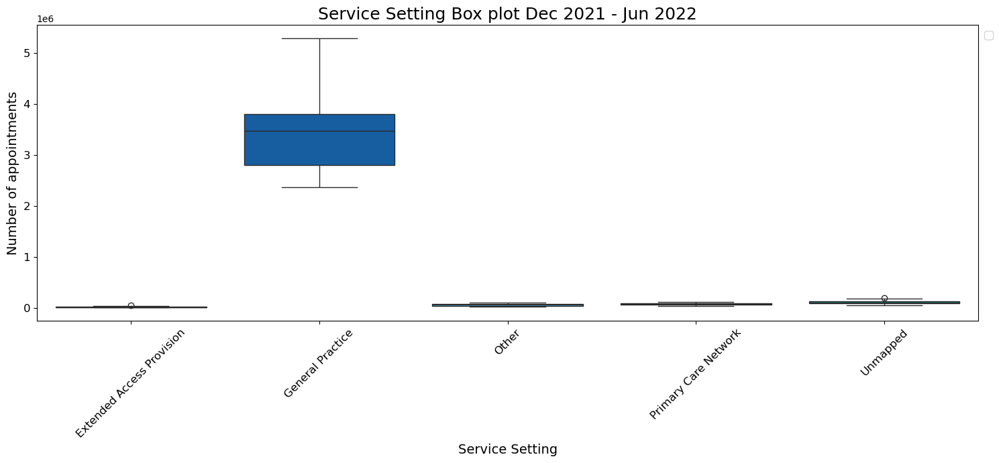

In [134]:
# Create a boxplot after pivoting the filtered_nc DataFrame for the service setting
ss_pivot = pivot_boxplot(filtered_nc,'service_setting')

# Apply the user-defined function to standardize all charts
chart_clean('Service Setting Box plot Dec 2021 - Jun 2022',
            'Service Setting',
            'Number of appointments',
            '')

# Display the pivoted DataFrame by service setting
ss_pivot.head()

### Filtering out the General Practice

In [136]:
# Drop the General Practice from the column
ss_pivot_noGP = ss_pivot.drop('General Practice', axis = 1)



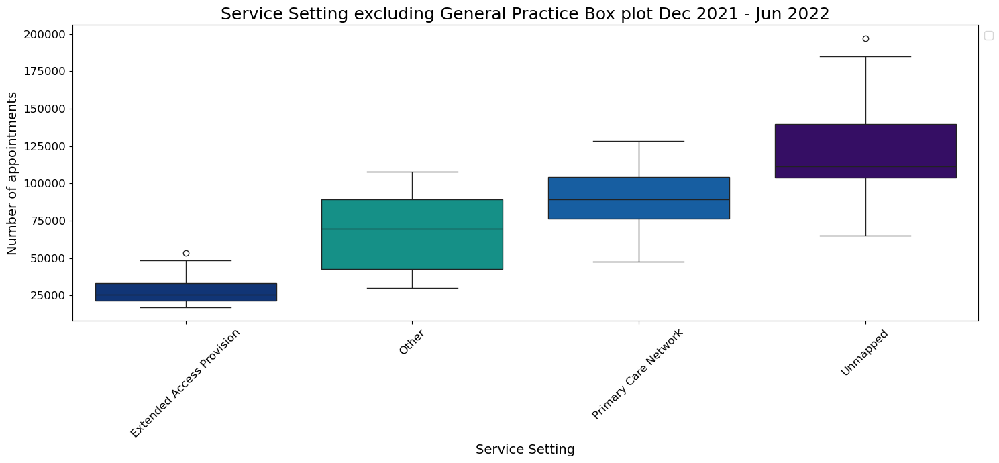

In [137]:
# Set the figure size
plt.figure(figsize=(15,7))

# Box plot of the count of appointments to identify outliers
sns.boxplot(ss_pivot_noGP,palette=nhs_colors)

# Apply the user-defined function to standardize all charts
chart_clean('Service Setting excluding General Practice Box plot Dec 2021 - Jun 2022',
            'Service Setting',
            'Number of appointments',
            '')

plt.show()

## Context Type
- Care related encounter is the context type with the highest number of appointments
- Followed by appointments categorised under inconsistent mapping

In [139]:
# Determine the number of unique context types
print('Unique Context types: ',len(filtered_nc['context_type'].unique()))

Unique Context types:  3


In [140]:
# Group appointments by context type within the date range
context_type_appointment_sum = (
    filtered_nc.groupby('context_type')[['count_of_appointments']]
    .sum()
    .sort_values(by='count_of_appointments',ascending = False))
#context_type_appointment_sum

In [141]:
# Add the percentage column 
ct = percent(context_type_appointment_sum)
ct

,count_of_appointments,percentage
context_type,,
Care Related Encounter,160007693,87.45
Inconsistent Mapping,17067801,9.33
Unmapped,5887700,3.22


,appointment_month_str,region,Care Related Encounter,Inconsistent Mapping,Unmapped
0,April 2022,East of England,2434043,182955,110828
1,April 2022,London,3040433,389391,104345
2,April 2022,Midlands,4090056,374928,138593
3,April 2022,North East and Yorkshire,3397474,370555,143217
4,April 2022,North West,2477847,329676,75151


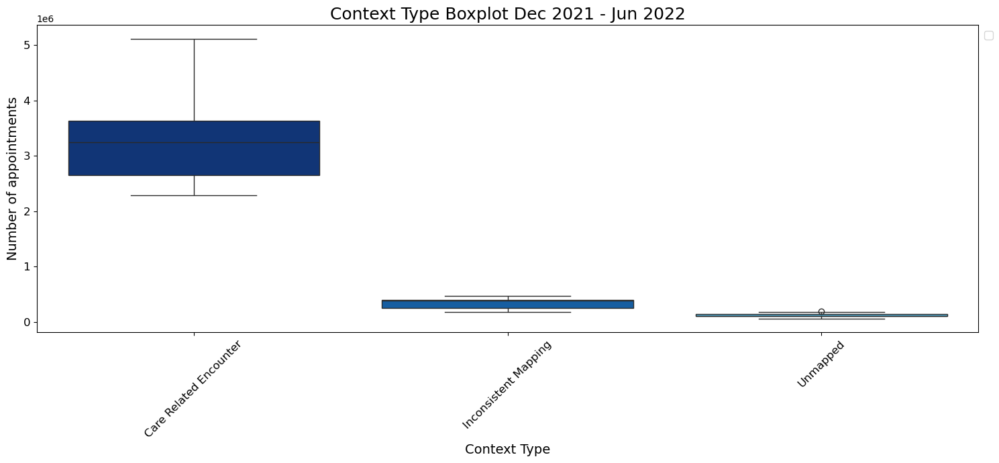

In [142]:
# Create a boxplot after pivoting the filtered_nc DataFrame for the context type
ct_pivot = pivot_boxplot(filtered_nc,'context_type')

# Apply the user-defined function to standardize all charts
chart_clean('Context Type Boxplot Dec 2021 - Jun 2022',
            'Context Type',
            'Number of appointments',
            '')

# Display the pivoted DataFrame by context type
ct_pivot.head()

## National Category
- General Consultation routine is the national category with the highest number of appointments
- Followed by appointments categorized under general consultation acute and clinical triage

In [144]:
# Determine the number of unique national categories
print('Unique Context types: ',len(filtered_nc['national_category'].unique()))

Unique Context types:  18


In [145]:
# Group appointments by national category within the date range
national_category_appointment_sum = (
    filtered_nc.groupby('national_category')[['count_of_appointments']]
    .sum()
    .sort_values(by='count_of_appointments',ascending = False))
#national_category_appointment_sum

In [146]:
# Add the percentage column
nt = percent(national_category_appointment_sum)
nt

,count_of_appointments,percentage
national_category,,
General Consultation Routine,61419764,33.57
General Consultation Acute,34466994,18.84
Clinical Triage,25568097,13.97
Planned Clinics,17105825,9.35
Inconsistent Mapping,17067801,9.33
Planned Clinical Procedure,14339997,7.84
Unmapped,5887700,3.22
Unplanned Clinical Activity,1943489,1.06
Home Visit,1365406,0.75


,appointment_month_str,region,Care Home Needs Assessment & Personalised Care and Support Planning,Care Home Visit,Clinical Triage,General Consultation Acute,General Consultation Routine,Group Consultation and Group Education,Home Visit,Inconsistent Mapping,Non-contractual chargeable work,Patient contact during Care Home Round,Planned Clinical Procedure,Planned Clinics,Service provided by organisation external to the practice,Social Prescribing Service,Structured Medication Review,Unmapped,Unplanned Clinical Activity,Walk-in
0,April 2022,East of England,5921,7876,384614,544737,875506,445,15463,182955,906,10099,158489,342032,11548,6310,28273,110828,31637,10187
1,April 2022,London,2797,6687,545617,627179,1239946,406,14260,389391,2548,4543,191886,340292,7381,6233,20287,104345,24105,6266
2,April 2022,Midlands,7622,8433,621079,1001912,1470280,2450,37800,374928,1359,18662,372409,430217,11387,8309,40249,138593,55847,2041
3,April 2022,North East and Yorkshire,6290,8410,467731,661840,1380378,524,28805,370555,1888,15180,256998,452406,11314,7319,33734,143217,60018,4639
4,April 2022,North West,3227,6492,419111,580818,965017,261,41182,329676,1335,12565,208661,181994,12974,3573,15108,75151,23827,1702


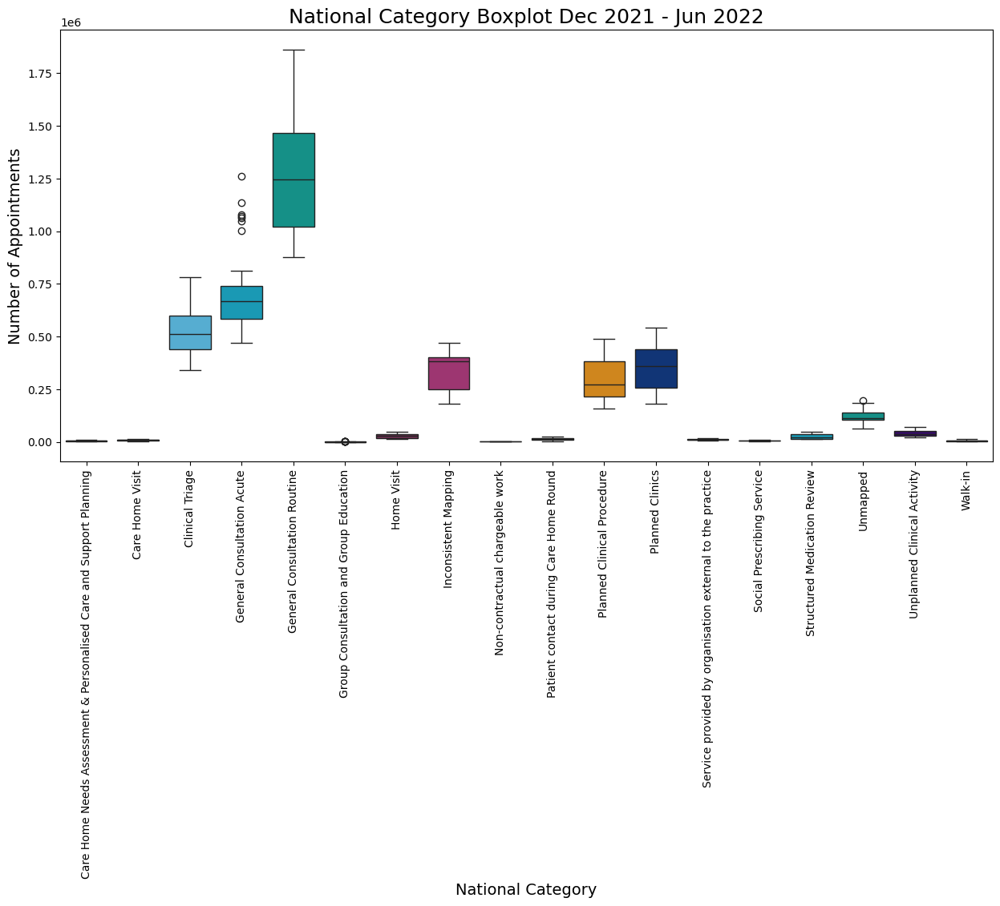

In [147]:
# Create a boxplot after pivoting the filtered_nc DataFrame for the national category
ncat_pivot = pivot_boxplot(filtered_nc,'national_category')

# Manually label the chart to clearly display the xaxis labels
plt.title('National Category Boxplot Dec 2021 - Jun 2022',fontsize = 18)
plt.xlabel('National Category',fontsize=14)
plt.ylabel('Number of Appointments',fontsize=14)
plt.xticks(rotation =90,fontsize= 10)
plt.yticks(fontsize = 10)

# Display the pivoted DataFrame by national category
ncat_pivot.head()

**Filtered ar DataFrame**

For charts in this section to be comparable, the ar DataFrame was filtered to match the same date range as the ad DataFrame.
The date range would be 2021-12-01 to 2022-06-30.

In [149]:
# Filter the ar DataFrame between 01.12.2021 - 30.06.2022 to match the ad and nc DataFrame
start_date = '2021-12-01'
end_date = '2022-06-30'

# Use the filter_date function to filter the DataFrame
filtered_ar = filter_date(ar,'appointment_month',start_date,end_date)

## Appointment Status
- Attended appointment have the largest number of appointments under appointment status
- Followed by the DNA appointments
- The missed appointments consist 4.4% of the total number of appointments between Dec 2021 - Jun 2022

In [151]:
# Determine the number of unique appointment statuses
print('Unique Appointment Statuses: ',len(filtered_ar['appointment_status'].unique()))

Unique Appointment Statuses:  3


In [152]:
# Group appointments by appointment statuses within the date range
filtered_ar_status = (
    filtered_ar.groupby('appointment_status')[['count_of_appointments']]
    .sum()
    .sort_values(by='count_of_appointments',ascending = False)
    .reset_index())
#filtered_ar_status 

In [153]:
# Add percentage column
apps = percent(filtered_ar_status)
apps

,appointment_status,count_of_appointments,percentage
0,Attended,167980692,91.81
1,DNA,8054188,4.40
2,Unknown,6928314,3.79


,appointment_month_str,region,Attended,DNA,Unknown
0,April 2022,East of England,2539897,94877,93052
1,April 2022,London,3197795,192303,144071
2,April 2022,Midlands,4236580,196533,170464
3,April 2022,North East and Yorkshire,3614105,153806,143335
4,April 2022,North West,2589774,155330,137570


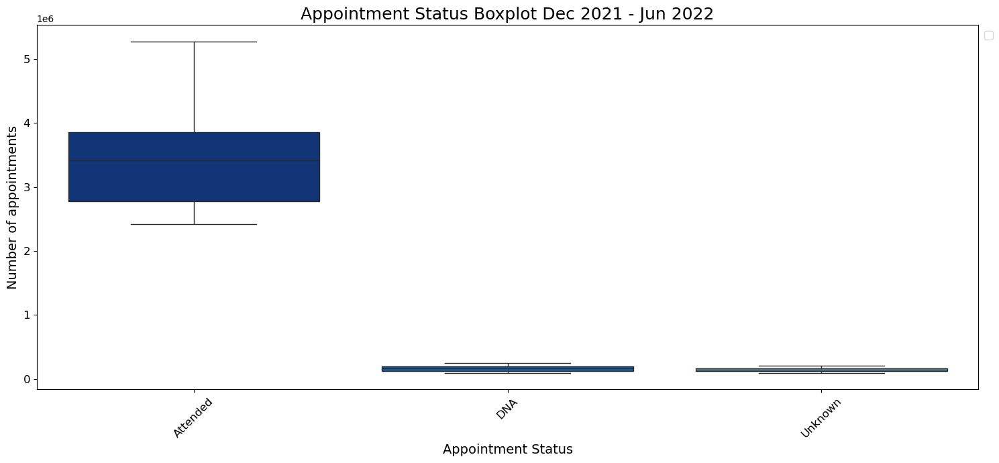

In [154]:
# Create a boxplot after pivoting the filtered_ar DataFrame for the appointment status
as_pivot = pivot_boxplot(filtered_ar,'appointment_status')

# Apply the user-defined function to standardize all charts
chart_clean('Appointment Status Boxplot Dec 2021 - Jun 2022',
            'Appointment Status',
            'Number of appointments',
            '')

# Display the pivoted DataFrame by appointment status
as_pivot.head()

## HCP Type
- GP is the hcp type with the highest number of appointments
- Followed by other practice staff

In [156]:
# Determine the number of unique hcp types
print('Unique HCP Types: ',len(filtered_ar['hcp_type'].unique()))

Unique HCP Types:  3


In [157]:
# Group appointments by hcp types within the date range
filtered_ar_hcp = (
    filtered_ar.groupby('hcp_type')[['count_of_appointments']]
    .sum()
    .sort_values(by='count_of_appointments',ascending = False)
    .reset_index())
#filtered_ar_mode

In [158]:
# Add percentage column
hcp_percent = percent(filtered_ar_hcp)
hcp_percent

,hcp_type,count_of_appointments,percentage
0,GP,92386135,50.49
1,Other Practice staff,84682917,46.28
2,Unknown,5894142,3.22


,appointment_month_str,region,GP,Other Practice staff,Unknown
0,April 2022,East of England,1249176,1363180,115470
1,April 2022,London,2067480,1412373,54316
2,April 2022,Midlands,2289439,2154494,159644
3,April 2022,North East and Yorkshire,1731239,2032619,147388
4,April 2022,North West,1498989,1280373,103312


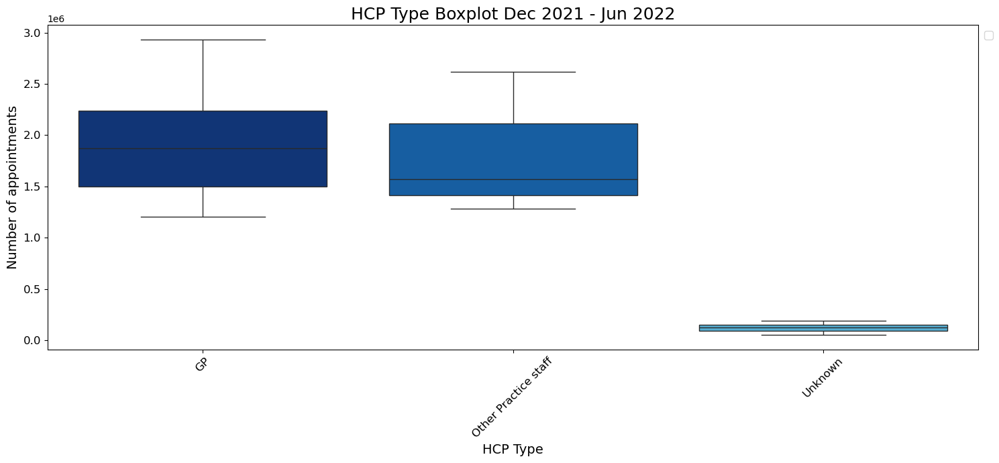

In [159]:
# Create a boxplot after pivoting the filtered_ar DataFrame for the hcp type
hcp_pivot = pivot_boxplot(filtered_ar,'hcp_type')

# Apply the user-defined function to standardize all charts
chart_clean('HCP Type Boxplot Dec 2021 - Jun 2022',
            'HCP Type',
            'Number of appointments',
            '')

# Display the pivoted DataFrame by hcp type
hcp_pivot.head()

## Appointment Mode
- Face-to-Face is the appointment mode with the highest number of appointments
- Followed by the telephone appointment mode

In [161]:
# Determine the list of unique appointment mode
print('Unique appointment mode: ',len(filtered_ar['appointment_mode'].unique()))

Unique appointment mode:  5


In [162]:
# Group appointments by appointment mode within the date range
filtered_ar_mode = (
    filtered_ar.groupby('appointment_mode')[['count_of_appointments']]
    .sum()
    .sort_values(by='count_of_appointments',ascending = False)
    .reset_index())
#filtered_ar_mode

Face-to-Face appointments are also within range of what the NHS has published:

https://digital.nhs.uk/data-and-information/publications/statistical/appointments-in-general-practice/october-2022#

In [164]:
# Add percentage column
app_mode = percent(filtered_ar_mode)
app_mode

,appointment_mode,count_of_appointments,percentage
0,Face-to-Face,114016772,62.32
1,Telephone,61613653,33.68
2,Unknown,5103949,2.79
3,Home Visit,1285751,0.70
4,Video/Online,943069,0.52


,appointment_month_str,region,Face-to-Face,Home Visit,Telephone,Unknown,Video/Online
0,April 2022,East of England,1830078,11796,748954,115942,21056
1,April 2022,London,2037020,15070,1401773,49237,31069
2,April 2022,Midlands,2924205,33730,1503609,123819,18214
3,April 2022,North East and Yorkshire,2673247,22329,1071002,120163,24505
4,April 2022,North West,1764082,43626,1005920,63636,5410


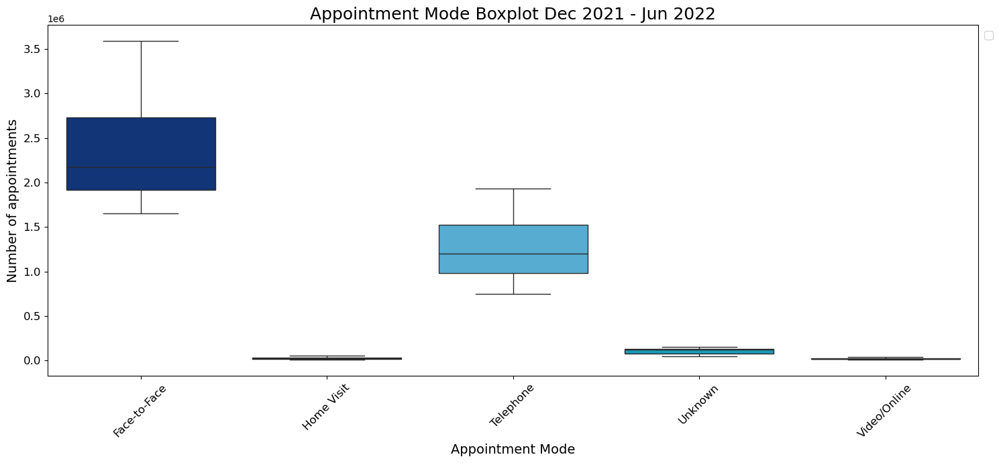

In [165]:
# Create a boxplot after pivoting the filtered_ar DataFrame for the appointment mode
am_pivot = pivot_boxplot(filtered_ar,'appointment_mode')

# Apply the user-defined function to standardize all charts
chart_clean('Appointment Mode Boxplot Dec 2021 - Jun 2022',
            'Appointment Mode',
            'Number of appointments',
            '')

# Display the pivoted DataFrame by appointment mode
am_pivot.head()

## Average Time between booking and consultation date
- This chart is relying on taking the average of the extracted integers from the time between book and appointment column. 
- Plotting the averages make the visualizations easier to read
- The top highest number of appointments are scheduled within a week
- Same day appointments are the highest in this case

The percentage of same day appointments was also confirmed through the following source:

https://digital.nhs.uk/data-and-information/publications/statistical/appointments-in-general-practice/november-2022#

In [168]:
# Determine the list of unique avg time between booking and consultation
print('Unique average time between booking and consultation: ',len(filtered_ar['avg_time_between_book_appointment'].unique()))

Unique average time between booking and consultation:  8


In [169]:
# Group appointment by avg time between book and appointment within the date range
filtered_ar_avg_book_consul = (
    filtered_ar.groupby('avg_time_between_book_appointment')[['count_of_appointments']]
    .sum()
    .sort_values(by='count_of_appointments',ascending = False)
    .reset_index())
#filtered_ar_mode

In [170]:
# Add percentage column
app_mode = percent(filtered_ar_avg_book_consul)
app_mode

,avg_time_between_book_appointment,count_of_appointments,percentage
0,0.0,82554607,45.15
1,4.5,36707478,20.08
2,11.0,22684786,12.41
3,1.0,16083535,8.80
4,18.0,11871816,6.49
5,25.0,7067239,3.87
6,28.0,5868098,3.21


,appointment_month_str,region,0.0,1.0,4.5,11.0,18.0,25.0,28.0
0,April 2022,East of England,1244185,215899,492304,333351,203645,124610,112615
1,April 2022,London,1593371,379469,782220,415894,195758,100562,62851
2,April 2022,Midlands,2178763,371879,832876,544229,323079,187495,162257
3,April 2022,North East and Yorkshire,1710309,344073,729804,487879,295210,175966,165940
4,April 2022,North West,1331481,261908,535891,341828,204202,119292,86191


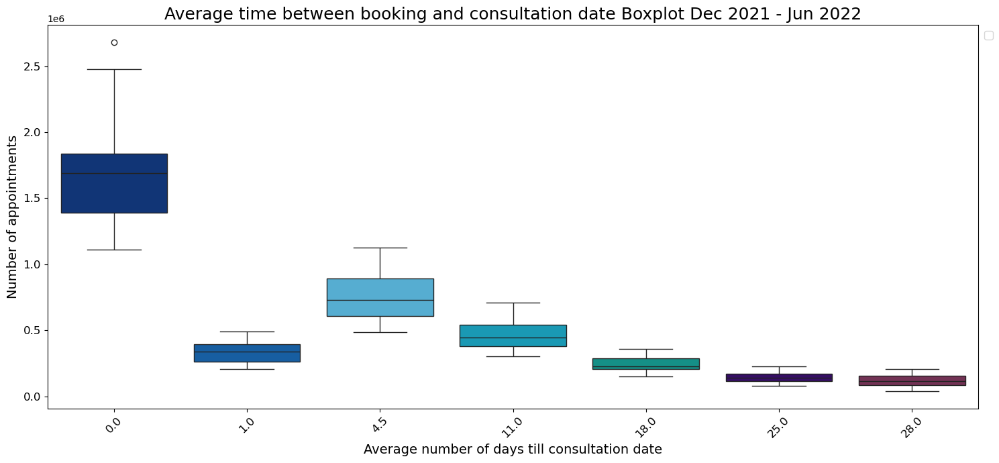

In [171]:
# Create a boxplot after pivoting the filtered_ar DataFrame for the average time between book and appointment
avgt_pivot = pivot_boxplot(filtered_ar,'avg_time_between_book_appointment')

# Apply the user-defined function to standardize all charts
chart_clean('Average time between booking and consultation date Boxplot Dec 2021 - Jun 2022',
            'Average number of days till consultation date',
            'Number of appointments',
            '')

# Display the pivoted DataFrame by average time between book and appointment
avgt_pivot.head()

## Average Appointment Duration
- Appointments with an average duration of 8 mins are the highest in number of appointments
- Followed by appointments with an average duration of 3 mins

In [173]:
# Determine the list of unique avg appointment duration
print('Unique average appointment duration: ',len(ad['average_duration'].unique()))

Unique average appointment duration:  7


In [174]:
# Group appointment by avg appointment duration within the date range
filtered_ar_avg_duration = (
    ad.groupby('average_duration')[['count_of_appointments']]
    .sum()
    .sort_values(by='count_of_appointments',ascending = False)
    .reset_index())
#filtered_ar_mode

In [175]:
# Add percentage column
avg_d = percent(filtered_ar_avg_duration)
avg_d

,average_duration,count_of_appointments,percentage
0,8.0,33800815,26.47
1,3.0,28600865,22.40
2,13.0,25160882,19.70
3,18.0,16004247,12.53
4,25.5,15026365,11.77
5,45.5,9103432,7.13


,appointment_month_str,region,3.0,8.0,13.0,18.0,25.5,45.5
0,April 2022,East of England,469625,548155,401341,248855,226983,132865
1,April 2022,London,491826,570679,446615,286450,268279,177303
2,April 2022,Midlands,742428,895103,656372,408624,373194,219328
3,April 2022,North East and Yorkshire,635359,761047,564777,357049,329173,188757
4,April 2022,North West,384981,465681,362739,234615,223699,133963


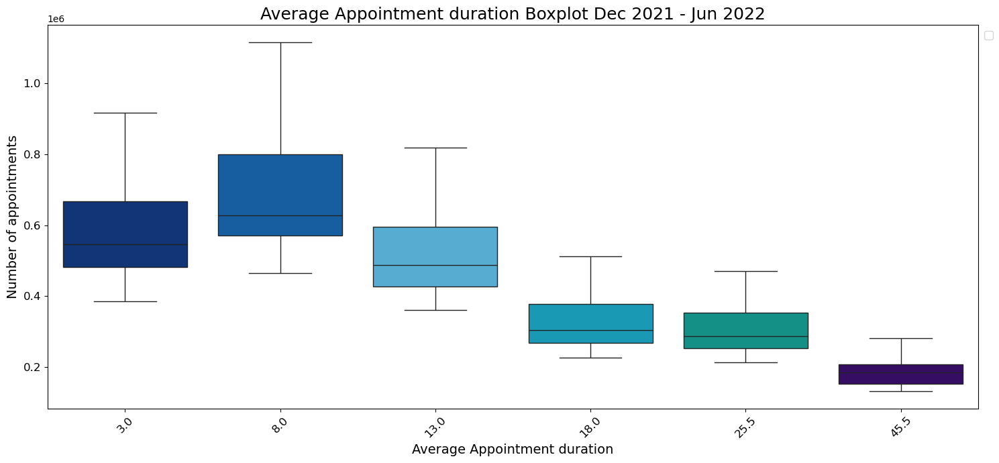

In [176]:
# Create a boxplot after pivoting the filtered_ar DataFrame for the average appointment duration
acd_pivot = pivot_boxplot(ad,'average_duration')

# Apply the user-defined function to standardize all charts
chart_clean('Average Appointment duration Boxplot Dec 2021 - Jun 2022',
            'Average Appointment duration',
            'Number of appointments',
            '')

# Display the pivoted DataFrame by average appointment duration
acd_pivot.head()

# 6. Finding Commonalities between DataFrames

## Check the relation between the DataFrames by grouping and filtering for a common date range


### AD & NC DataFrames
- Check the nc and ar DataFrame for the common date range 01.08.2021 - 30.06.2022
- Group both DataFrames by Month year, season and icb_ons_code
- Compare the grouped DataFrames to judge if they can be joined

In [180]:
# Group by the nc DataFrame
nc_group = (
    nc.groupby(
        ['appointment_month_str',
         'season_year',
         'icb_ons_code'])[['count_of_appointments']]
    .sum()
    .sort_values(by='count_of_appointments',ascending=False)
    .reset_index())
nc_group

,appointment_month_str,season_year,icb_ons_code,count_of_appointments
0,November 2021,Autumn 2021,E54000050,1738485
1,October 2021,Autumn 2021,E54000050,1725403
2,March 2022,Spring 2022,E54000050,1679342
3,September 2021,Autumn 2021,E54000050,1653075
4,May 2022,Spring 2022,E54000050,1564541
...,...,...,...,...
457,February 2022,Winter 2022,E54000011,220679
458,January 2022,Winter 2022,E54000011,218581
459,December 2021,Winter 2021,E54000011,217784
460,August 2021,Summer 2021,E54000011,209824


In [181]:
# Filter the ar DataFrame for the date range 01.08.2021 - 30.06.2022
start_nc = '2021.08.01'
end_nc = '2022.06.30'

# Use the filter_date to ar the DataFrame to match nc date range
filtered_ar_nc=filter_date(ar,'appointment_month',start_nc,end_nc)

# Reset index of the returned DataFrame
filtered_ar_nc = filtered_ar_nc.reset_index()

#filtered_ar_nc

In [182]:
# Group by the ar DataFrame
filtered_ar_nc_group = (
    filtered_ar_nc.groupby(
        ['appointment_month_str',
         'season_year',
         'icb_ons_code'])[['count_of_appointments']]
    .sum()
    .sort_values(by='count_of_appointments',ascending=False)
    .reset_index())
filtered_ar_nc_group

,appointment_month_str,season_year,icb_ons_code,count_of_appointments
0,November 2021,Autumn 2021,E54000050,1738485
1,October 2021,Autumn 2021,E54000050,1725403
2,March 2022,Spring 2022,E54000050,1679342
3,September 2021,Autumn 2021,E54000050,1653075
4,May 2022,Spring 2022,E54000050,1564541
...,...,...,...,...
457,February 2022,Winter 2022,E54000011,220679
458,January 2022,Winter 2022,E54000011,218581
459,December 2021,Winter 2021,E54000011,217784
460,August 2021,Summer 2021,E54000011,209824


***Compare both grouped DataFrames to make sure they match***

Upon subtracting each row of the aggregated DataFrames nc and filtered_ar_nc_group, we can deduct that both DataFrames match by number of appointments and region. 

In [184]:
# Comparison of the grouped DataFrames by subtraction of each element (row by row) of the count of appointment column
comparison = nc_group['count_of_appointments'] - filtered_ar_nc_group ['count_of_appointments']

# Print the result of the comparison
print('The difference between the grouped DataFrames: ',
      comparison.sum(),
      'which means they match on regions and number of appointment per date')


The difference between the grouped DataFrames:  0 which means they match on regions and number of appointment per date


#### Failed Merge attempt for the filtered ar DataFrame & nc for the date range 01.08.2021 - 30.06.2022 
The logic behind the aggregation is to fix the icb_ons_code and the date, pivot the other columns, and aggregate them by summing their number of appointments. 
This was done to both the nc and filtered_ar_nc DataFrames to prepare them for the merge. 

- Pivoting the tables results in a multi-index that's why flattening the columns was necessary.
- The Merge attempt failed and the pivoted results were not used for further calculations. 

***Pivoting the nc DataFrame***

In [187]:
# Aggregate nc
# Pivot table in preparation for a join
nc_pivot = nc.pivot_table(index = 
                          ['appointment_month',
                           'icb_ons_code']
                          ,columns = ['service_setting',
                                      'context_type',
                                      'national_category']
                          ,values = ['count_of_appointments'],
                          aggfunc = 'sum'
                         )

# Reset the index of the pivoted DataFrame
nc_pivot=nc_pivot.reset_index()

# Flatten MultiIndex columns
nc_pivot.columns = [
    '_'.join([str(i) for i in col if i and i != 'count_of_appointments']).strip('_')
    if isinstance(col, tuple) else str(col)
    for col in nc_pivot.columns
]

In [188]:
# Melt the nc_pivot in prep for merge
nc_melt = pd.melt(nc_pivot,
                  id_vars=['appointment_month',
                           'icb_ons_code'],
                  value_name= 'count_of_appointments',
                  var_name='appointments'
                 )

# Test the nc_melt DataFrame by checking the sum of count of appointments
nc_melt['count_of_appointments'].sum()
nc_melt_adj = nc_melt

nc_melt_adj

,appointment_month,icb_ons_code,appointments,count_of_appointments
0,2021-08-01,E54000008,Extended Access Provision_Care Related Encount...,NaN
1,2021-08-01,E54000010,Extended Access Provision_Care Related Encount...,NaN
2,2021-08-01,E54000011,Extended Access Provision_Care Related Encount...,NaN
3,2021-08-01,E54000013,Extended Access Provision_Care Related Encount...,NaN
4,2021-08-01,E54000015,Extended Access Provision_Care Related Encount...,2.0
...,...,...,...,...
31873,2022-06-01,E54000058,Unmapped_Unmapped_Unmapped,19944.0
31874,2022-06-01,E54000059,Unmapped_Unmapped_Unmapped,15376.0
31875,2022-06-01,E54000060,Unmapped_Unmapped_Unmapped,26117.0
31876,2022-06-01,E54000061,Unmapped_Unmapped_Unmapped,18514.0


In [189]:
# Create a user-defined function to split the appointments column into three different columns and give them their correct original name
def split_func(df,
               name1,
               name2,
               name3
              ):
    # Splits the appointments column by the '_' i
    df[[name1, name2, name3]] = df['appointments'].str.split('_', expand=True)

    # Drop the original appointments column after the split
    df.drop(columns='appointments', inplace=True)
    return df

In [190]:
# Apply the split function on nc_melt to separate the appointments column to three individual columns
# This is in preparation for the join with the filtered ar DataFrame

nc_split = split_func(nc_melt_adj,
                      'service_setting',
                      'context_type',
                      'national_category'
                     )
nc_split

,appointment_month,icb_ons_code,count_of_appointments,service_setting,context_type,national_category
0,2021-08-01,E54000008,NaN,Extended Access Provision,Care Related Encounter,Care Home Needs Assessment & Personalised Care...
1,2021-08-01,E54000010,NaN,Extended Access Provision,Care Related Encounter,Care Home Needs Assessment & Personalised Care...
2,2021-08-01,E54000011,NaN,Extended Access Provision,Care Related Encounter,Care Home Needs Assessment & Personalised Care...
3,2021-08-01,E54000013,NaN,Extended Access Provision,Care Related Encounter,Care Home Needs Assessment & Personalised Care...
4,2021-08-01,E54000015,2.0,Extended Access Provision,Care Related Encounter,Care Home Needs Assessment & Personalised Care...
...,...,...,...,...,...,...
31873,2022-06-01,E54000058,19944.0,Unmapped,Unmapped,Unmapped
31874,2022-06-01,E54000059,15376.0,Unmapped,Unmapped,Unmapped
31875,2022-06-01,E54000060,26117.0,Unmapped,Unmapped,Unmapped
31876,2022-06-01,E54000061,18514.0,Unmapped,Unmapped,Unmapped


In [191]:
# Reorganize the columns in preparation for the merge
nc_join = nc_split[['appointment_month',
                    'icb_ons_code',
                    'service_setting',
                    'context_type',
                    'national_category',
                    'count_of_appointments'
                   ]]
nc_join

,appointment_month,icb_ons_code,service_setting,context_type,national_category,count_of_appointments
0,2021-08-01,E54000008,Extended Access Provision,Care Related Encounter,Care Home Needs Assessment & Personalised Care...,NaN
1,2021-08-01,E54000010,Extended Access Provision,Care Related Encounter,Care Home Needs Assessment & Personalised Care...,NaN
2,2021-08-01,E54000011,Extended Access Provision,Care Related Encounter,Care Home Needs Assessment & Personalised Care...,NaN
3,2021-08-01,E54000013,Extended Access Provision,Care Related Encounter,Care Home Needs Assessment & Personalised Care...,NaN
4,2021-08-01,E54000015,Extended Access Provision,Care Related Encounter,Care Home Needs Assessment & Personalised Care...,2.0
...,...,...,...,...,...,...
31873,2022-06-01,E54000058,Unmapped,Unmapped,Unmapped,19944.0
31874,2022-06-01,E54000059,Unmapped,Unmapped,Unmapped,15376.0
31875,2022-06-01,E54000060,Unmapped,Unmapped,Unmapped,26117.0
31876,2022-06-01,E54000061,Unmapped,Unmapped,Unmapped,18514.0


In [192]:
# Recheck the sum appointments to make sure the DataFrame wasn't incorrectly manipulated
nc_join['count_of_appointments'].sum()

296046770.0

***Pivoting the filtered ar DataFrame***

In [194]:
# Pivot table in preparation for a join
filtered_ar_pivot = filtered_ar_nc.pivot_table(index =['appointment_month',
                                                       'icb_ons_code'],
                                               columns = ['appointment_status',
                                                          'hcp_type',
                                                          'appointment_mode'],
                                               values = ['count_of_appointments'],
                                               aggfunc = 'sum'
                                              )
filtered_ar_pivot = filtered_ar_pivot.reset_index()

# Flatten the MultiIndex Columns
filtered_ar_pivot.columns = ['_'.join([str(i) for i in col if i and i != 'count_of_appointments']).strip('_') 
                             if isinstance(col, tuple) 
                             else col
                             for col in filtered_ar_pivot.columns]
filtered_ar_pivot

,appointment_month,icb_ons_code,Attended_GP_Face-to-Face,Attended_GP_Home Visit,Attended_GP_Telephone,Attended_GP_Unknown,Attended_GP_Video/Online,Attended_Other Practice staff_Face-to-Face,Attended_Other Practice staff_Home Visit,Attended_Other Practice staff_Telephone,...,Unknown_Other Practice staff_Face-to-Face,Unknown_Other Practice staff_Home Visit,Unknown_Other Practice staff_Telephone,Unknown_Other Practice staff_Unknown,Unknown_Other Practice staff_Video/Online,Unknown_Unknown_Face-to-Face,Unknown_Unknown_Home Visit,Unknown_Unknown_Telephone,Unknown_Unknown_Unknown,Unknown_Unknown_Video/Online
0,2021-08-01,E54000008,241116.0,4873.0,298572.0,7281.0,1468.0,260410.0,4492.0,106082.0,...,14477.0,1083.0,4640.0,1169.0,30.0,2168.0,932.0,2154.0,123.0,3.0
1,2021-08-01,E54000010,82390.0,564.0,116085.0,NaN,666.0,126121.0,1129.0,56079.0,...,5601.0,486.0,1789.0,NaN,1.0,822.0,151.0,188.0,25.0,NaN
2,2021-08-01,E54000011,50872.0,895.0,47929.0,3206.0,30.0,63949.0,371.0,21256.0,...,2091.0,134.0,691.0,654.0,NaN,144.0,120.0,13.0,NaN,NaN
3,2021-08-01,E54000013,59033.0,133.0,59624.0,NaN,439.0,138227.0,1526.0,37961.0,...,6675.0,78.0,1455.0,NaN,12.0,2.0,NaN,16.0,484.0,NaN
4,2021-08-01,E54000015,125535.0,129.0,113815.0,1.0,1512.0,174919.0,789.0,37182.0,...,7746.0,44.0,1065.0,NaN,35.0,NaN,7.0,4.0,1049.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
457,2022-06-01,E54000058,146089.0,1257.0,84144.0,1.0,1360.0,166697.0,1896.0,38160.0,...,8761.0,302.0,1767.0,NaN,24.0,146.0,332.0,7.0,1422.0,NaN
458,2022-06-01,E54000059,77363.0,159.0,71944.0,NaN,348.0,114066.0,405.0,39698.0,...,4121.0,16.0,1176.0,NaN,19.0,155.0,18.0,21.0,740.0,NaN
459,2022-06-01,E54000060,141676.0,795.0,105153.0,NaN,2808.0,179038.0,1590.0,39845.0,...,8357.0,143.0,1520.0,NaN,63.0,NaN,NaN,1.0,1425.0,NaN
460,2022-06-01,E54000061,167211.0,1263.0,108251.0,NaN,3018.0,241241.0,1268.0,49601.0,...,12376.0,144.0,1663.0,NaN,95.0,187.0,86.0,92.0,1012.0,NaN


In [195]:
# Melt the nc_pivot in prep for merge
ar_melt = pd.melt(filtered_ar_pivot,
                  id_vars=['appointment_month',
                           'icb_ons_code']
                  ,value_name= 'count_of_appointments'
                  ,var_name='appointments')

# Test the nc_melt DataFrame by checking the sum of count of appointments
ar_melt['count_of_appointments'].sum()

296046770.0

In [196]:
# Apply the split function on nc_melt_adj to separate the appointments column to three individual columns
# This is in preparation for the join with the filtered ar DataFrame

ar_split = split_func(ar_melt,
                      'appointment_status',
                      'hcp_type',
                      'appointment_mode')
ar_split

,appointment_month,icb_ons_code,count_of_appointments,appointment_status,hcp_type,appointment_mode
0,2021-08-01,E54000008,241116.0,Attended,GP,Face-to-Face
1,2021-08-01,E54000010,82390.0,Attended,GP,Face-to-Face
2,2021-08-01,E54000011,50872.0,Attended,GP,Face-to-Face
3,2021-08-01,E54000013,59033.0,Attended,GP,Face-to-Face
4,2021-08-01,E54000015,125535.0,Attended,GP,Face-to-Face
...,...,...,...,...,...,...
20785,2022-06-01,E54000058,NaN,Unknown,Unknown,Video/Online
20786,2022-06-01,E54000059,NaN,Unknown,Unknown,Video/Online
20787,2022-06-01,E54000060,NaN,Unknown,Unknown,Video/Online
20788,2022-06-01,E54000061,NaN,Unknown,Unknown,Video/Online


In [197]:
# Reorganize the columns in preparation for the merge
ar_join = ar_split[['appointment_month',
                    'appointment_status',
                    'hcp_type',
                    'appointment_mode',
                    'count_of_appointments']]
ar_join
ar_join['count_of_appointments'].sum()

296046770.0

***Merging the two DataFrames***

In [199]:
merge_nc_ar_filtered = nc_join.merge(ar_join,how='left')
merge_nc_ar_filtered

,appointment_month,icb_ons_code,service_setting,context_type,national_category,count_of_appointments,appointment_status,hcp_type,appointment_mode
0,2021-08-01,E54000008,Extended Access Provision,Care Related Encounter,Care Home Needs Assessment & Personalised Care...,NaN,Attended,GP,Unknown
1,2021-08-01,E54000008,Extended Access Provision,Care Related Encounter,Care Home Needs Assessment & Personalised Care...,NaN,Attended,GP,Unknown
2,2021-08-01,E54000008,Extended Access Provision,Care Related Encounter,Care Home Needs Assessment & Personalised Care...,NaN,Attended,GP,Unknown
3,2021-08-01,E54000008,Extended Access Provision,Care Related Encounter,Care Home Needs Assessment & Personalised Care...,NaN,Attended,GP,Unknown
4,2021-08-01,E54000008,Extended Access Provision,Care Related Encounter,Care Home Needs Assessment & Personalised Care...,NaN,Attended,GP,Unknown
...,...,...,...,...,...,...,...,...,...
2889965,2022-06-01,E54000058,Unmapped,Unmapped,Unmapped,19944.0,NaN,NaN,NaN
2889966,2022-06-01,E54000059,Unmapped,Unmapped,Unmapped,15376.0,NaN,NaN,NaN
2889967,2022-06-01,E54000060,Unmapped,Unmapped,Unmapped,26117.0,NaN,NaN,NaN
2889968,2022-06-01,E54000061,Unmapped,Unmapped,Unmapped,18514.0,NaN,NaN,NaN


In [200]:
# Rechecking the sum of count_of_appointment flagged an error as it doesn't match the original sum
merge_nc_ar_filtered['count_of_appointments'].sum()

296890869.0

### AR & AD DataFrames

- Check the ar and ad DataFrames for the date range between 01.12.2021 and 30.06.2022
- Since the ad DataFrame is only for attended appointments, the ar DataFrame will be filtered further to only show attended appointments

In [202]:
# Filter the ar DataFrame by date and for attended appointments
# Define a start_date and an end_date to filter the ar DataFrame
start_dates = '2021-12-01'
end_dates = '2022-06-30'

# Filter the date range in the DataFrame ar with the new date range to match the ad data range
filtered_date_ar_ad = filter_date(ar,'appointment_month',start_dates,end_dates)

# Filter the ad DataFrame further to only include the attended appointments
filtered_date_ar_ad_attended = filtered_date_ar_ad[filtered_date_ar_ad['appointment_status'] =='Attended']

filtered_date_ar_ad_attended.reset_index(drop=True,inplace=True)

filtered_date_ar_ad_attended

,icb_ons_code,region,appointment_month,appointment_month_str,month,year,season_year,appointment_status,hcp_type,appointment_mode,time_between_book_and_appointment,avg_time_between_book_appointment,count_of_appointments
0,E54000034,South East,2021-12-01,December 2021,12,2021,Winter 2021,Attended,GP,Face-to-Face,1 Day,1.0,7152
1,E54000010,Midlands,2021-12-01,December 2021,12,2021,Winter 2021,Attended,GP,Telephone,Same Day,0.0,16790
2,E54000010,Midlands,2021-12-01,December 2021,12,2021,Winter 2021,Attended,GP,Telephone,Unknown / Data Quality,NaN,9
3,E54000010,Midlands,2021-12-01,December 2021,12,2021,Winter 2021,Attended,Other Practice staff,Face-to-Face,1 Day,1.0,2474
4,E54000010,Midlands,2021-12-01,December 2021,12,2021,Winter 2021,Attended,Other Practice staff,Face-to-Face,15 to 21 Days,18.0,3037
...,...,...,...,...,...,...,...,...,...,...,...,...,...
55335,E54000060,Midlands,2022-06-01,June 2022,6,2022,Summer 2022,Attended,GP,Face-to-Face,8 to 14 Days,11.0,1320
55336,E54000060,Midlands,2022-06-01,June 2022,6,2022,Summer 2022,Attended,GP,Face-to-Face,22 to 28 Days,25.0,1020
55337,E54000060,Midlands,2022-06-01,June 2022,6,2022,Summer 2022,Attended,GP,Face-to-Face,2 to 7 Days,4.5,2406
55338,E54000060,Midlands,2022-06-01,June 2022,6,2022,Summer 2022,Attended,GP,Face-to-Face,15 to 21 Days,18.0,967


In [203]:
# Group by the count of appointments by month to make sure it matches the ad DataFrame
filtered_ar_sum_appointments = (
    filtered_date_ar_ad_attended.groupby(['appointment_month_str',
                                          'season_year',
                                          'icb_ons_code'])[['count_of_appointments']]
    .sum()
    .sort_values(by='count_of_appointments',ascending=False)
    .reset_index())
filtered_ar_sum_appointments

,appointment_month_str,season_year,icb_ons_code,count_of_appointments
0,March 2022,Spring 2022,E54000050,1545887
1,May 2022,Spring 2022,E54000050,1443421
2,June 2022,Summer 2022,E54000050,1349404
3,January 2022,Winter 2022,E54000050,1340200
4,February 2022,Winter 2022,E54000050,1330642
...,...,...,...,...
289,February 2022,Winter 2022,E54000011,205046
290,June 2022,Summer 2022,E54000011,203745
291,January 2022,Winter 2022,E54000011,203005
292,December 2021,Winter 2021,E54000011,199845


In [204]:
# Group by the count of appointments by month to make sure it matches the ar DataFrame
ad_sum_appointments=(
    ad.groupby(['appointment_month_str',
                'season_year',
                'icb_ons_code'])[['count_of_appointments']]
    .sum()
    .sort_values(by='count_of_appointments',ascending=False)
    .reset_index())
ad_sum_appointments

,appointment_month_str,season_year,icb_ons_code,count_of_appointments
0,March 2022,Spring 2022,E54000050,1545887
1,May 2022,Spring 2022,E54000050,1443421
2,June 2022,Summer 2022,E54000050,1349404
3,January 2022,Winter 2022,E54000050,1340200
4,February 2022,Winter 2022,E54000050,1330642
...,...,...,...,...
289,February 2022,Winter 2022,E54000011,205046
290,June 2022,Summer 2022,E54000011,203745
291,January 2022,Winter 2022,E54000011,203005
292,December 2021,Winter 2021,E54000011,199845


***Compare both grouped DataFrames to make sure they match***

Upon subtracting each row of the aggregated DataFrames ad and filtered_ar_sum_appointments, we can deduct that both DataFrames match by number of appointments and region. 

In [206]:
# Comparison of the grouped DataFrames by subtraction
comparisonadar = filtered_ar_sum_appointments['count_of_appointments'] - ad_sum_appointments ['count_of_appointments']

print('The difference between the grouped DataFrames: ',comparison.sum(),
      'which means they match on regions and number of appointment per date')

The difference between the grouped DataFrames:  0 which means they match on regions and number of appointment per date


No merge will be attempted since the logic behind it resulted in erroneous results on the attempt between nc and ar. 

# 7. Utilization / Appointment Detail & Info
This section will include all trends / visualizations related to the appointment details and the utilization.
This includes:
- Appointment duration
- Time between booking and consultation
- Appointment status
- Appointment mode
- HCP Type
- Service Setting
- Context Type
- National Category

## Number of records per month for all DataFrames
The number of records are different between DataFrames and that's because each DataFrame is aggregated 
based on their individual columns. 

The number of records will be calculated for the original DataFrames with their original date ranges.

nc and ar DataFrames match by the sum of appointments if we compare that by dates and location
ad and ar match by the sum of attended appointments if we compare that by dates and location

**ad DataFrame Records**

In [211]:
# Total number of records per month DataFrame
number_records_ad = ad['appointment_month_str'].value_counts().reset_index()

# Change the name of the columns in the new DataFrame to match the displayed data
number_records_ad.columns = ['appointment_month','count_of_appointments']
number_records_ad.head()

,appointment_month,count_of_appointments
0,March 2022,21236
1,May 2022,20128
2,January 2022,19643
3,December 2021,19507
4,June 2022,19227


**ar DataFrame Records**

In [213]:
# Total number of records per month DataFrame
number_records_ar = ar['appointment_month_str'].value_counts().reset_index()

# Change the name of the columns in the new DataFrame to match the displayed data
number_records_ar.columns= ['appointment_month','count_of_appointments']
number_records_ar.head()

,appointment_month,count_of_appointments
0,March 2020,21350
1,January 2020,20889
2,November 2021,20766
3,February 2020,20689
4,October 2021,20562


**nc DataFrame Records**

In [215]:
# Total number of records per month DataFrame
number_records_nc = nc['appointment_month_str'].value_counts().reset_index()

# Change the name of the columns in the new DataFrame to match the displayed data
number_records_nc.columns= ['appointment_month','count_of_appointments']
number_records_nc

,appointment_month,count_of_appointments
0,March 2022,82822
1,November 2021,77652
2,May 2022,77425
3,September 2021,74922
4,June 2022,74168
5,October 2021,74078
6,December 2021,72651
7,January 2022,71896
8,February 2022,71769
9,April 2022,70012


## Number of Appointments

The month with the highest number of appointments?
- The ar DataFrame will be used as it's the DataFrame with the longest date range.
- It would help us get insights across months, seasons and even exceptions (pandemic period)

**November 2021 followed by October 2021** are the highest months in terms of appointments. 

The increase on both months can be explained by the Covid vaccinations which peaked during those months. 
Patients received either first or second dose vaccinations on those months.

This is confirmed by the following source:

https://www.england.nhs.uk/statistics/wp-content/uploads/sites/2/2021/10/COVID-19-weekly-announced-vaccinations-21-October-2021.pdf

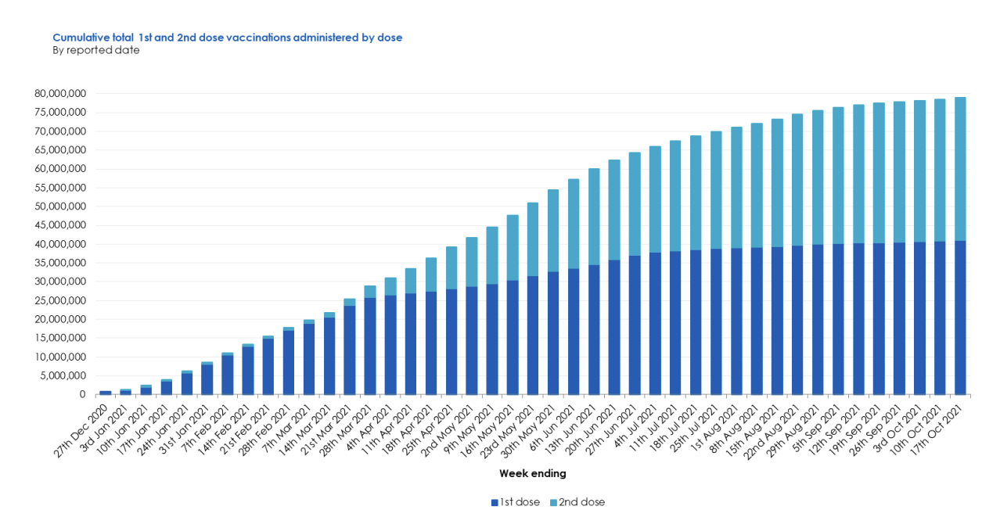

In [219]:
# Group the ar DataFrame by the appointment_month and display the month and year
ar_monthly = (
    ar.groupby(['appointment_month',
                'appointment_month_str'])[['count_of_appointments']]
    .sum().reset_index())

# Sort the nc_monthly DataFrame based on the count_of_appointments and drop the original index
ar_monthly_sorted = ar_monthly.sort_values(by = 'appointment_month', ascending = True).reset_index(drop= True)
ar_monthly_sorted.head()

,appointment_month,appointment_month_str,count_of_appointments
0,2020-01-01,January 2020,27199296
1,2020-02-01,February 2020,24104621
2,2020-03-01,March 2020,24053468
3,2020-04-01,April 2020,16007881
4,2020-05-01,May 2020,16417212


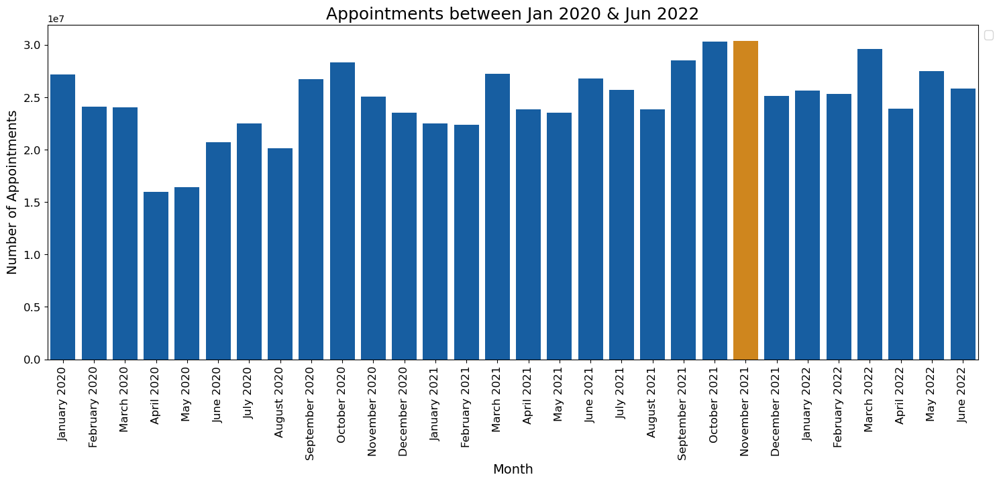

In [220]:
# Set the figure size
plt.figure(figsize=(15,7))

# Create a color list
colors = ['#ED8B00' if month == 'November 2021' else '#005EB8' for month in ar_monthly['appointment_month_str']]

# Plot a barplot for the Number of appointments per month
sns.barplot(x='appointment_month_str',
            y='count_of_appointments',
            data=ar_monthly,
            errorbar = None,
            palette=colors)

# Apply the chart clean function to standardize the chart
chart_clean('Appointments between Jan 2020 & Jun 2022','Month','Number of Appointments','')

# Override the x-axis label's rotation to 90
plt.xticks(rotation=90)

plt.show()


## Service Settings

Most popular service setting for NHS North West London from 1 January to 1 June 2022

In [223]:
# For each of these service settings, determine the number of records available for the period and the location. 
start_date3 = '2022-01-01'
end_date3 = '2022-06-01'

# Filter nc DataFrame for the required date intervale 01.01.2022 - 01.06.2022
seg_nc = filter_date(nc,'appointment_date',start_date3,end_date3)


# Filter by the given location NHS North West London
seg_nc = seg_nc[seg_nc['sub_icb_location_name'].apply(lambda x: 'NHS North West London ICB - W2U3Z' in x)]

(seg_nc.groupby('service_setting')[['count_of_appointments']]
.sum()
.sort_values(by='count_of_appointments',ascending = False)
.reset_index())

,service_setting,count_of_appointments
0,General Practice,4804239
1,Unmapped,391106
2,Other,152897
3,Primary Care Network,109840
4,Extended Access Provision,98159


**General Practice** is the service setting with the highest number of appointments.
To better see the trends of the other service settings, general practice will be filtered out and the set will be plotted again. 

In [225]:
# Function to groupby the nc DataFrame
def group_nc(column):
    
    ''' This function is used to group nc by a specific column
                Parameters: column
                Return: the grouped nc DataFrame
    '''
    df_group = nc.groupby(['appointment_month',
                           'appointment_month_str',
                           column])[['count_of_appointments']]\
    .sum().sort_values(by='appointment_month',ascending=True).reset_index()
    return df_group

In [226]:
# Use the goup_nc function to group by service_setting
# This is to aggregate on a monthly level and determine the sum of appointments per month for the service settings
nc_ss = group_nc('service_setting')

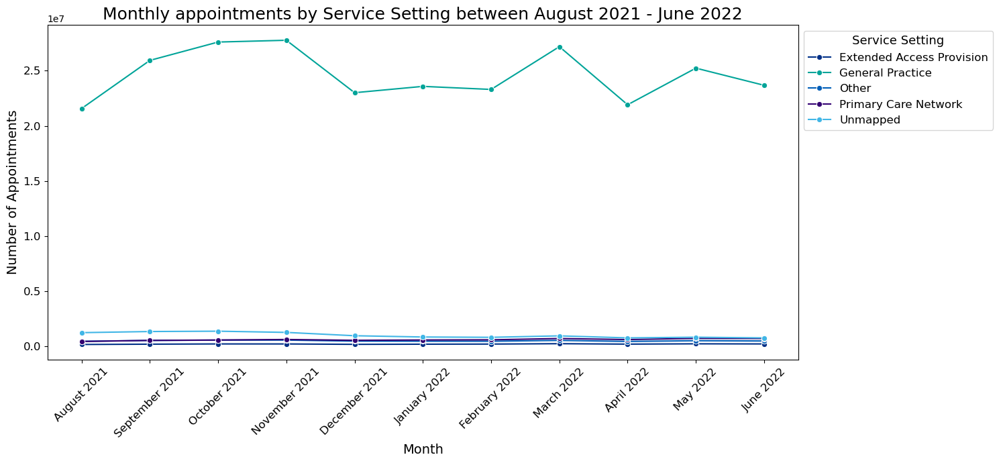

In [227]:
# Plot the appointments over the available date range, and review the service settings for months.
# Create a lineplot.
plt.figure(figsize=(15,7))

sns.lineplot(data = nc_ss, 
             x= 'appointment_month_str',
             y='count_of_appointments',
             hue='service_setting', 
             marker = 'o',
             palette=nhs_colors)

# Apply the user-defined function to standardize all charts
chart_clean('Monthly appointments by Service Setting between August 2021 - June 2022',
            'Month',
            'Number of Appointments',
            'Service Setting')


plt.show()


**Service Settings Excluding General Practice:**

As the gap between General practice and the other service settings is big, filtering the general practice out would allow us to get a detailed look at the other service types.

- **Unmapped** appointments have a negative slope suggesting an improvement in the tracking of appointment's service settings
- **Other and Primary Care Network** appointments overlapped between August 2021 to October 20021.
- **Primary Care Network appointments** surpassed other appoointment between October 2021 to June 2022
- **Extended Care Provision** are the lowest service setting

There is a significant improvement in data quality shown by the negative slope of the Unmapped curve. 
This is also confirmed by the NHS's commitment to improve data security and to retrain partners in the network to make sure that the data is collected according to its set standards.

source: https://www.gov.uk/government/publications/data-saves-lives-reshaping-health-and-social-care-with-data/data-saves-lives-reshaping-health-and-social-care-with-data

In [229]:
# Filter out the General practice from the nc_ss DataFrame
nc_ss_filtered = nc_ss[nc_ss['service_setting']!='General Practice']

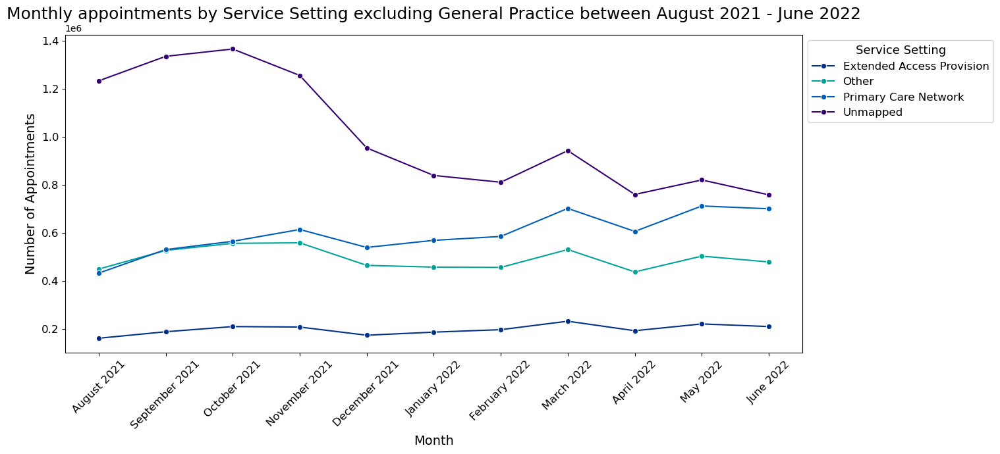

In [230]:
# Plot the appointments over the available date range, and review the service settings for months.
# Create a lineplot.
plt.figure(figsize=(15,7))
#fig,ax = plt.subplots()

sns.lineplot(data = nc_ss_filtered, 
             x= 'appointment_month_str',
             y='count_of_appointments', 
             hue='service_setting', 
             marker = 'o',
             palette=nhs_colors)

# Apply the user-defined function to standardize all charts
chart_clean('Monthly appointments by Service Setting excluding General Practice between August 2021 - June 2022',
            'Month',
            'Number of Appointments',
            'Service Setting')

# Save the generated chart
plt.savefig('Service_setting.png',dpi=300,bbox_inches='tight')
plt.show()


## Context Type

Care Related Encounter is the Context type with the highest number of appointments. 

Also to better view the other context types, it will be filtered out and the other context types will be plotted on a separate chart.

In [233]:
# Use the goup_nc function to group by context_type
# This is to aggregate on a monthly level and determine the sum of appointments per month for the service settings
nc_ct = group_nc('context_type')

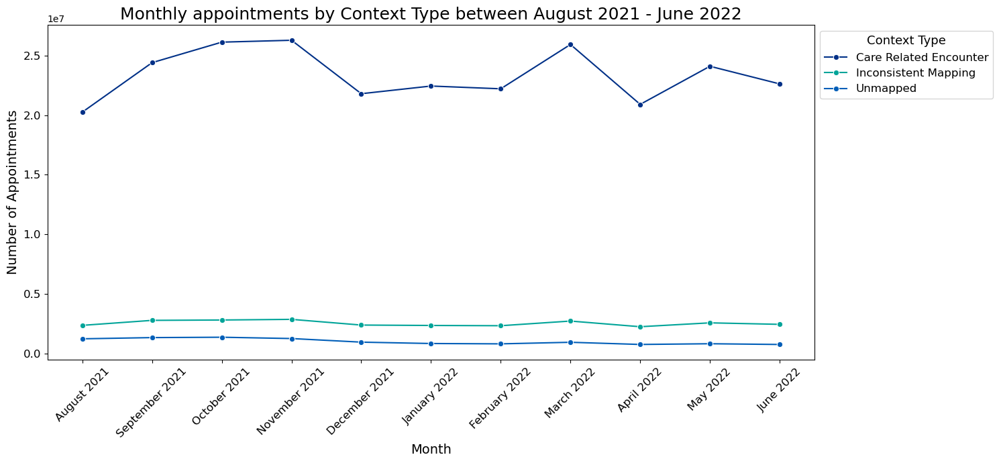

In [234]:
# Plot the appointments over the available date range, and review the service settings for months.
# Create a lineplot.
plt.figure(figsize=(15,7))


sns.lineplot(data = nc_ct,
             x= 'appointment_month_str',
             y='count_of_appointments', 
             hue='context_type', 
             marker = 'o',
             palette=nhs_colors)

# Apply the user-defined function to standardize all charts
chart_clean('Monthly appointments by Context Type between August 2021 - June 2022',
            'Month',
            'Number of Appointments',
            'Context Type')

plt.show()

**Context Type Excluding Care Related Encounter:**

Consistently with the pattern we see on the previous chart, the unmapped appointments seem to have a negative slope for the context types too. 

This is suggesting a strong improvement in data collection for both context type and service setting. 

In [236]:
# Filter out the Care Related Encounter from the nc_ss DataFrame
nc_ct_filtered = nc_ct[nc_ct['context_type']!='Care Related Encounter']

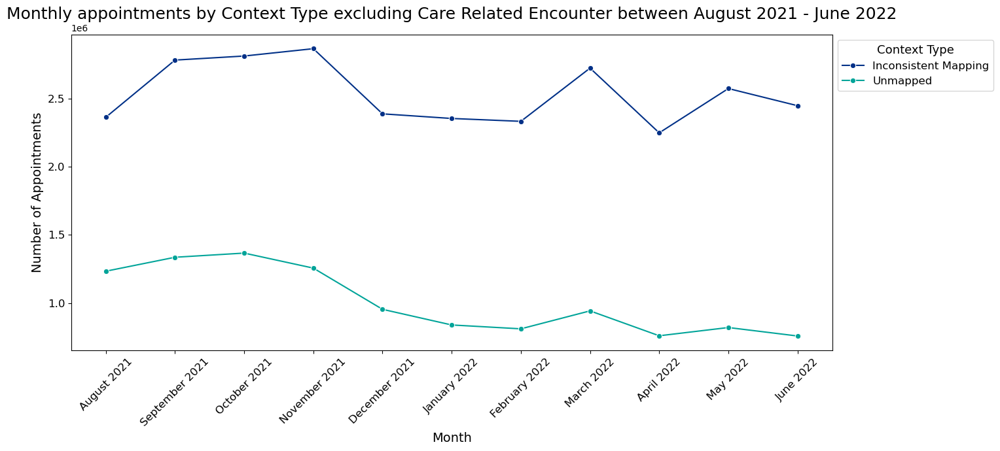

In [237]:
# Plot the appointments over the available date range, and review the service settings for months.
# Create a lineplot.
plt.figure(figsize=(15,7))


sns.lineplot(data = nc_ct_filtered, 
             x= 'appointment_month_str',
             y='count_of_appointments', 
             hue='context_type', 
             marker = 'o',
             palette=nhs_colors)

# Apply the user-defined function to standardize all charts
chart_clean('Monthly appointments by Context Type excluding Care Related Encounter between August 2021 - June 2022',
            'Month',
            'Number of Appointments',
            'Context Type')

plt.show()

## National Categories

**National categories:**
Since the national categories include 18 categories, the chart showing them all on one chart is a little cumbersome.

The chart will be split into three charts: 

**High Tier:**
- General Consultation Routine
- General Consultation Acute
- Clinical Triage
- Planned Clinics
- Inconsistent Mapping
- Planned Clinical Procedure

**Mid Tier:**
- Unmapped
- Unplanned Clinical Activity
- Home Visit

**Low Tier:**
- Service provided by organisation external to the practice
- Patient contact during Care Home Round
- Care Home Visit
- Social Prescribing Service
- Walk-in
- Care Home Needs Assessment & Personalised Care & Personalised Care and Support Planning
- Non-contractual chargeable work
- Group Consultation and Group Education

In [240]:
# Use the goup_nc function to group by national_category
# This is to aggregate on a monthly level and determine the sum of appointments per month for the service settings
nc_nc = group_nc('national_category')
#nc_nc

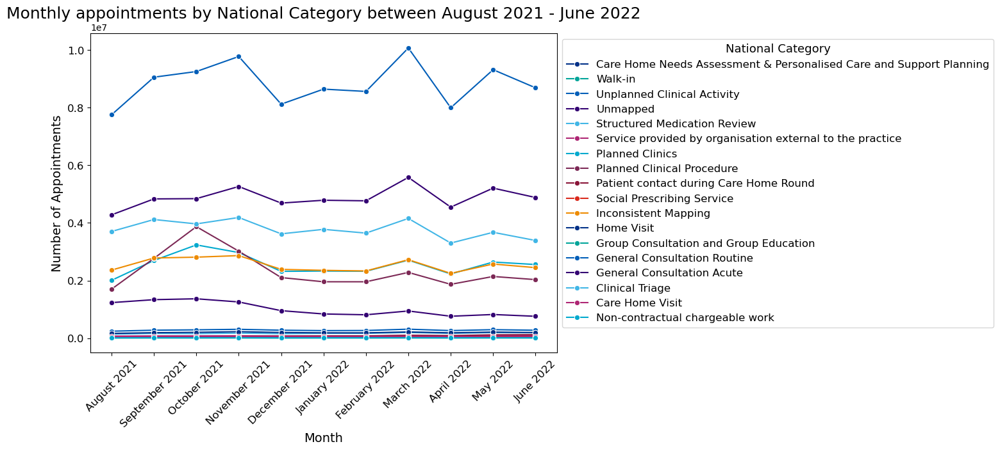

In [241]:
# Plot the appointments over the available date range, and review the national category for months.
# Create a lineplot.
plt.figure(figsize=(15,7))


sns.lineplot(data = nc_nc, 
             x= 'appointment_month_str',
             y='count_of_appointments', 
             hue='national_category', 
             marker = 'o',
             palette=nhs_colors)

# Apply the user-defined function to standardize all charts
chart_clean('Monthly appointments by National Category between August 2021 - June 2022',
            'Month',
            'Number of Appointments',
            'National Category')

plt.show()

**High Tier**
- **Planned Clinical Procedure and Clinical Triage** have the same number of appointments in Oct 2021
- **General Consultation Acute and Clinical Triage** follow the same pattern
- **Planned Clinics and Inconsistent Mapping** overlapp between Dec 2021 and June 2022

In [243]:
# High tier chart
# Filter the context type for the top 9 types by number of appointments
high_tier = ['General Consultation Routine',
             'General Consultation Acute',
             'Clinical Triage',
             'Planned Clinics',
             'Inconsistent Mapping',
             'Planned Clinical Procedure']
nc_high_tier = nc_nc[nc_nc['national_category'].isin(high_tier)]

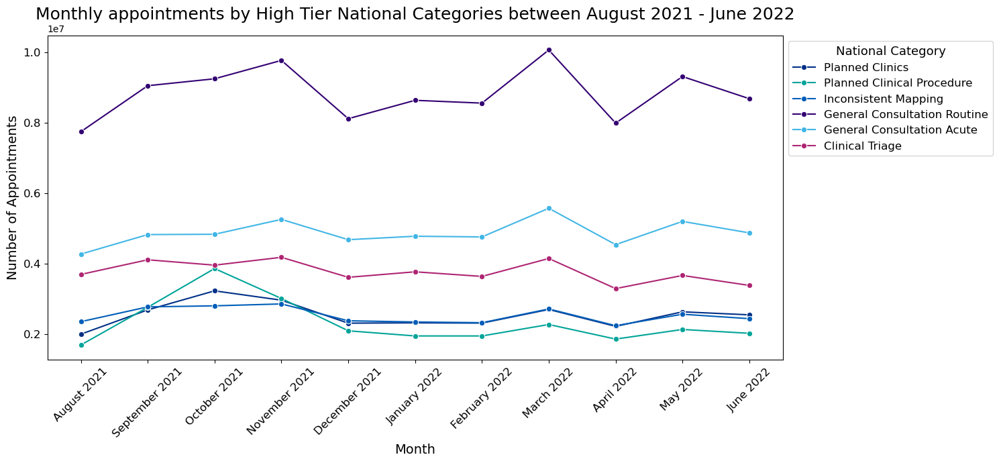

In [244]:
# Plot the appointments over the available date range, and review the national category for months.
# Create a lineplot.
plt.figure(figsize=(15,7))


sns.lineplot(data = nc_high_tier, 
             x= 'appointment_month_str',
             y='count_of_appointments', 
             hue='national_category', 
             marker = 'o',
             palette=nhs_colors)

# Apply the user-defined function to standardize all charts
chart_clean('Monthly appointments by High Tier National Categories between August 2021 - June 2022',
            'Month',
            'Number of Appointments',
            'National Category')

plt.show()

**Mid Tier**
- **Unmapped** is the highest in this tier
- **Home Visit and Unplanned Clinical Activity** follow the same trend for the whole date range

In [246]:
# Mid tier chart
# Filter the context type for the top 9 types by number of appointments
mid_tier = ['Unmapped',
             'Unplanned Clinical Activity',
             'Home Visit']
nc_mid_tier = nc_nc[nc_nc['national_category'].isin(mid_tier)]

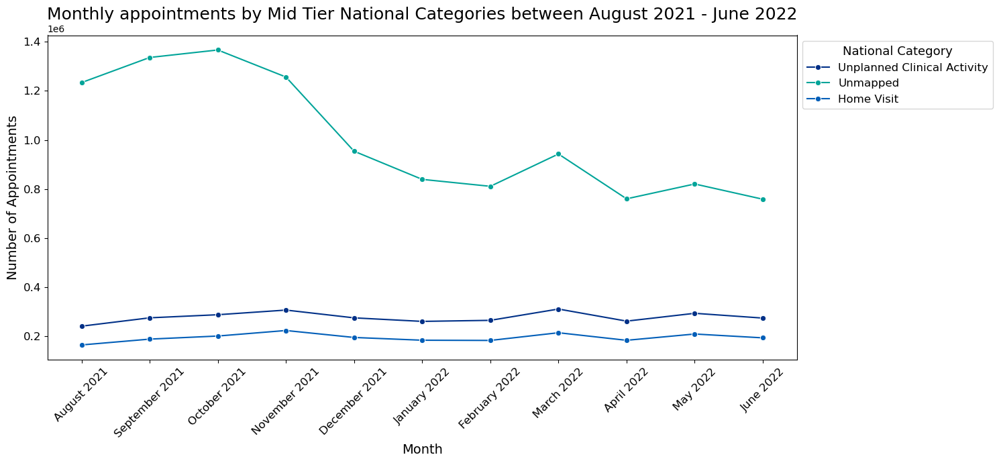

In [247]:
# Plot the appointments over the available date range, and review the national category for months.
# Create a lineplot.
plt.figure(figsize=(15,7))


sns.lineplot(data = nc_mid_tier, 
             x= 'appointment_month_str',
             y='count_of_appointments', 
             hue='national_category', 
             marker = 'o',
             palette=nhs_colors)

# Apply the user-defined function to standardize all charts
chart_clean('Monthly appointments by Mid Tier National Categories between August 2021 - June 2022',
            'Month',
            'Number of Appointments',
            'National Category')

plt.show()

**Low Tier**
- **Patient Contact during Care Home Round** has a steep positive slope suggesting a strong change starting Oct 2021
- **Group Consultation and Group Education** are the lowest overall in terms of number of appointments

In [249]:
# Low tier chart
# Filter the context type for the top 9 types by number of appointments
low_tier = ['Service provided by organisation external to the practice',
            'Patient contact during Care Home Round',
            'Care Home Visit',
            'Social Prescribing Service',
            'Walk-in',
            'Care Home Needs Assessment & Personalised Care & Personalised Care and Support Planning',
            'Non-contractual chargeable work',
            'Group Consultation and Group Education']
nc_low_tier = nc_nc[nc_nc['national_category'].isin(low_tier)]

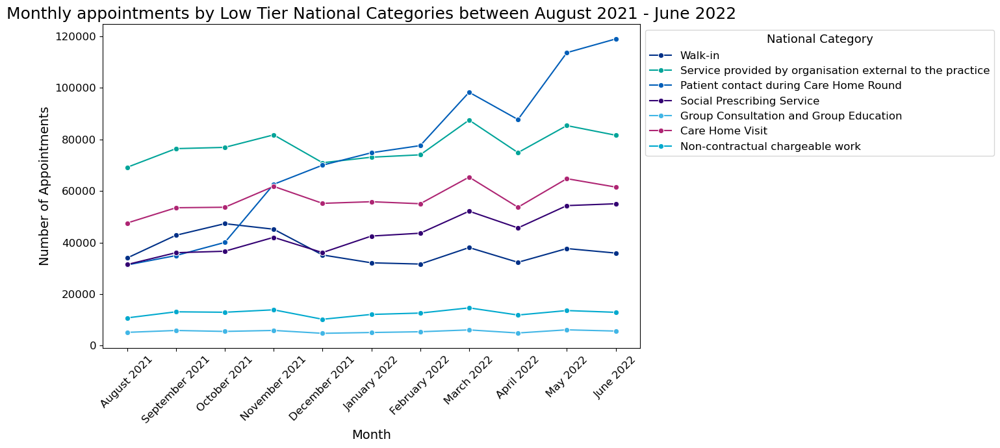

In [250]:
# Plot the appointments over the available date range, and review the national category for months.
# Create a lineplot.
plt.figure(figsize=(15,7))


sns.lineplot(data = nc_low_tier,
             x= 'appointment_month_str',
             y='count_of_appointments', 
             hue='national_category',
             marker = 'o',
             palette=nhs_colors)

# Apply the user-defined function to standardize all charts
chart_clean('Monthly appointments by Low Tier National Categories between August 2021 - June 2022',
            'Month',
            'Number of Appointments',
            'National Category')

# Save the generated chart
plt.savefig('National_Cateogry.png',dpi=300,bbox_inches='tight')
plt.show()

## HCP Type

- **GP** Appointments are higher over the course of the analysed date range, except for **Oct 2021** where Other practice staff appointments exceeded them
- Appointments categorized under **Unkown** would be filtered out to better see the trend of GP and other practice staff appointments

In [253]:
# Group the filtered ar DataFrame by hcp type
ar_hcp = (
    filtered_ar_nc.groupby(['appointment_month_str','appointment_month','hcp_type'])[['count_of_appointments']]
    .sum()
    .sort_values(by='appointment_month',ascending = True)
    .reset_index())

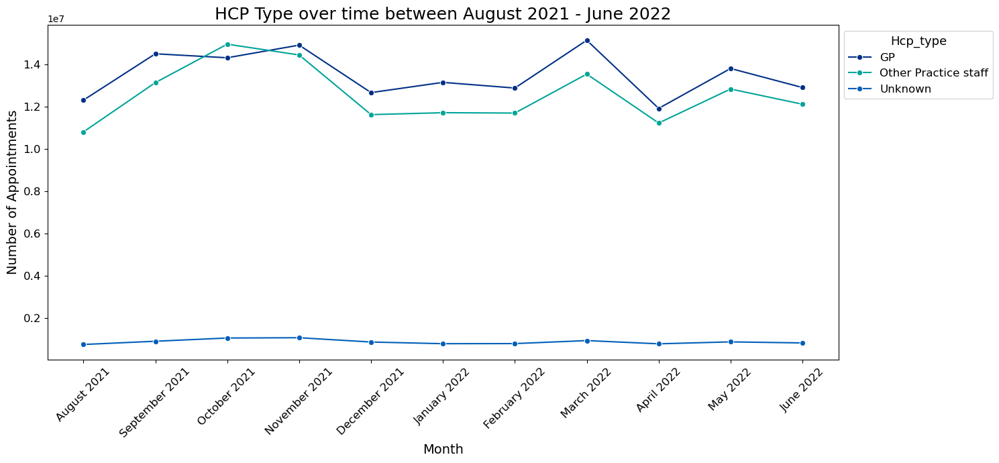

In [254]:
# Plot the hcp type over time between August 2021 - June 2022
# Create a lineplot.
plt.figure(figsize=(15,7))


sns.lineplot(data = ar_hcp,
             x= 'appointment_month_str',
             y='count_of_appointments', 
             hue = 'hcp_type',
             marker = 'o',
             palette=nhs_colors)

# Apply the user-defined function to standardize all charts
chart_clean('HCP Type over time between August 2021 - June 2022',
            'Month',
            'Number of Appointments',
            'Hcp_type')


plt.show()

In [255]:
# Filter ou the Unkown hcp types
ar_hcp_unkown = ar_hcp[ar_hcp['hcp_type']!='Unknown']

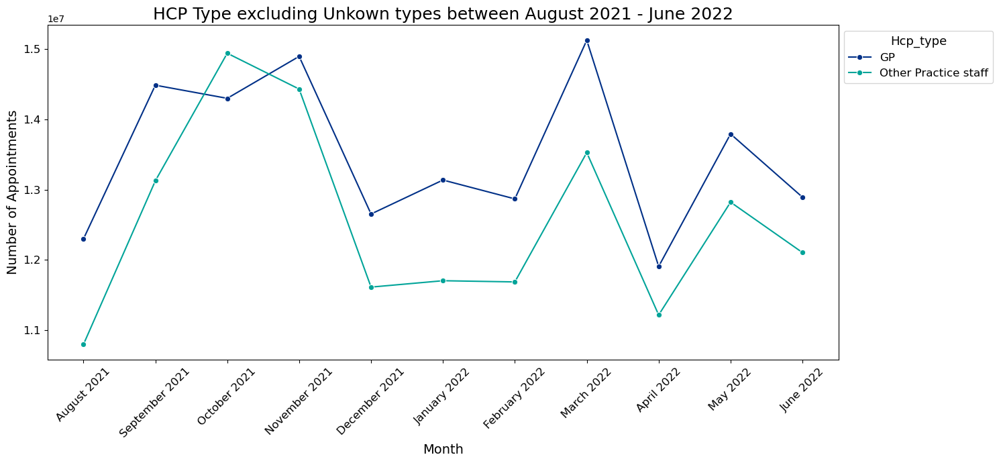

In [256]:
# Plot the hcp type over time excluding the unknown appointment between August 2021 - June 2022
# Create a lineplot.
plt.figure(figsize=(15,7))


sns.lineplot(data = ar_hcp_unkown, 
             x= 'appointment_month_str',
             y='count_of_appointments',
             hue = 'hcp_type',
             marker = 'o',
             palette=nhs_colors)

# Apply the user-defined function to standardize all charts
chart_clean('HCP Type excluding Unkown types between August 2021 - June 2022',
            'Month',
            'Number of Appointments',
            'Hcp_type')


plt.show()

## Appointment Status

- **Attended** appointments are the highest in the date range between August 2021 and June 2022
- To be able to better see the trends of DNA and Unknown appointments, the attended appointments will be filtered out on the second chart. 

In [259]:
# Group the filtered ar DataFrame by appointment status
ar_attended = (
    filtered_ar_nc.groupby(['appointment_month_str','appointment_month','appointment_status'])[['count_of_appointments']]
    .sum()
    .sort_values(by='appointment_month',ascending = True)
    .reset_index())

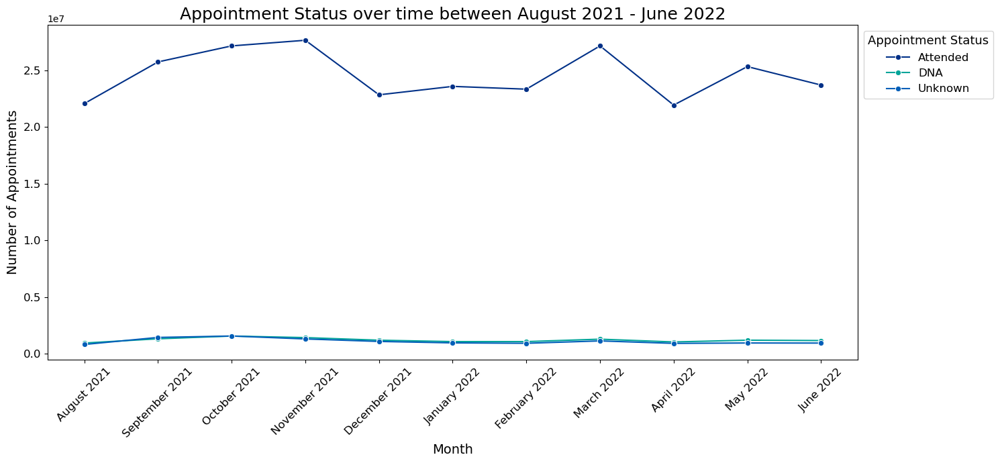

In [260]:
# Plot the appointment status over time between August 2021 - June 2022
# Create a lineplot.
plt.figure(figsize=(15,7))

sns.lineplot(data = ar_attended, 
             x= 'appointment_month_str',
             y='count_of_appointments', 
             hue = 'appointment_status',
             marker = 'o',
             palette=nhs_colors)

# Apply the user-defined function to standardize all charts
chart_clean('Appointment Status over time between August 2021 - June 2022',
            'Month',
            'Number of Appointments',
            'Appointment Status')


plt.show()


**DNA Appointments**
- DNA appointments were at their highest in October 2021 where they actually matched the Unknown appointments.
- Both appointment statuses started having a negative slope from their peak in Oct 2021. 

In [262]:
# Filter out the Attended appointments
ar_DNA = ar_attended[ar_attended['appointment_status']!='Attended']

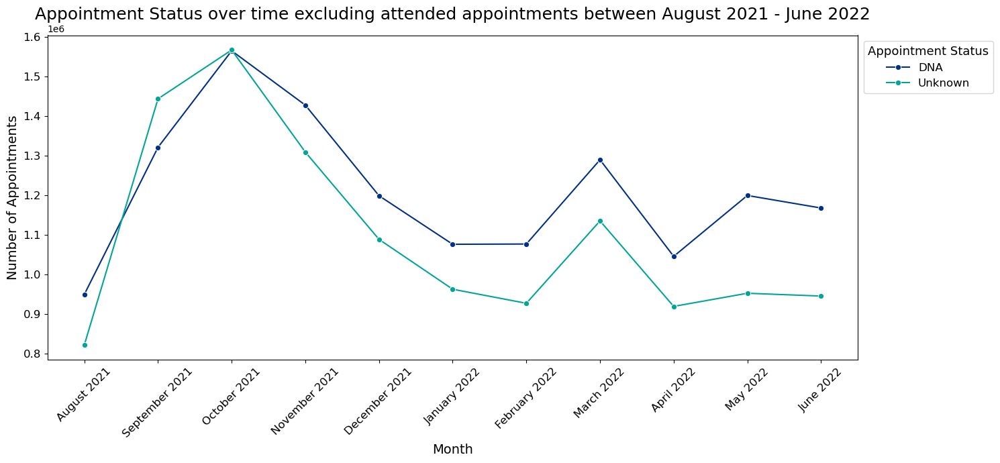

In [263]:
# Plot the appointment status over time between August 2021 - June 2022
# Create a lineplot.
plt.figure(figsize=(15,7))

sns.lineplot(data = ar_DNA,
             x= 'appointment_month_str',
             y='count_of_appointments', 
             hue = 'appointment_status',
             marker = 'o',
             palette=nhs_colors)

# Apply the user-defined function to standardize all charts
chart_clean('Appointment Status over time excluding attended appointments between August 2021 - June 2022',
            'Month',
            'Number of Appointments',
            'Appointment Status')


# Save the generated chart
plt.savefig('DNA_timeseries.png',dpi=300,bbox_inches='tight')
plt.show()


## Appointment Mode

- **Face-to-Face** appointments are the highest over the course of the date range
- They are followed by **Telephone** appointments

To better see the trends of the different appointment modes, the set will be divided in:
-High-Tier appointments with Face-to-Face and Telephone appointments
-Low-Tier appointments with Vidoe/Online, Home visits and Unkown

In [266]:
# Group the filtered ar DataFrame by appointment mode
ar_mode = (
    filtered_ar_nc.groupby(['appointment_month_str','appointment_month','appointment_mode'])[['count_of_appointments']]
    .sum()
    .sort_values(by='appointment_month',ascending = True)
    .reset_index())

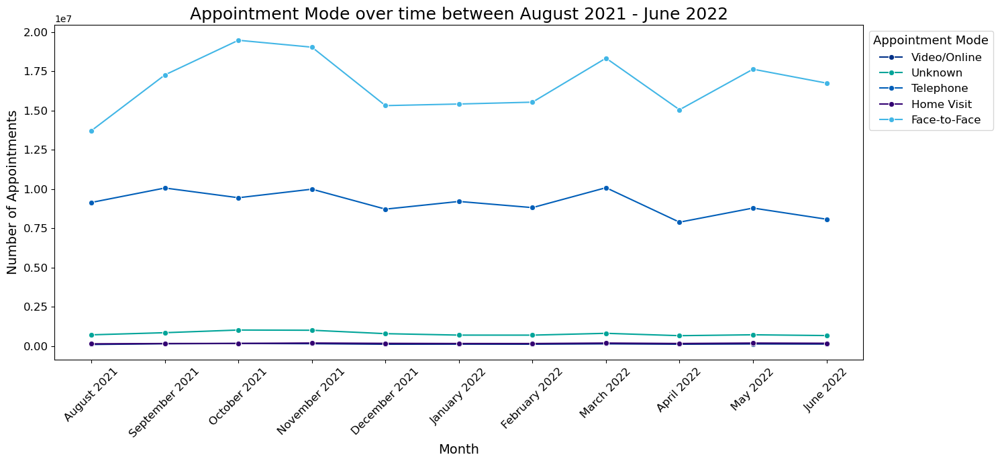

In [267]:
# Plot the appointment mode over time between August 2021 - June 2022
# Create a lineplot.
plt.figure(figsize=(15,7))

sns.lineplot(data = ar_mode,
             x= 'appointment_month_str',
             y='count_of_appointments',
             hue = 'appointment_mode',
             marker = 'o',
             palette=nhs_colors)

# Apply the user-defined function to standardize all charts
chart_clean('Appointment Mode over time between August 2021 - June 2022',
            'Month',
            'Number of Appointments',
            'Appointment Mode')


plt.show()

- **Face-To-Face** appointments were at an all time high in Oct 2021. 
This is an expected trend after the pandemic months
- **Telephone** has a slow negative slop

In [269]:
# High Tier appointment modes
high_tier = ['Face-to-Face','Telephone']
ar_mode_high_tier = ar_mode[ar_mode['appointment_mode'].isin(high_tier)]

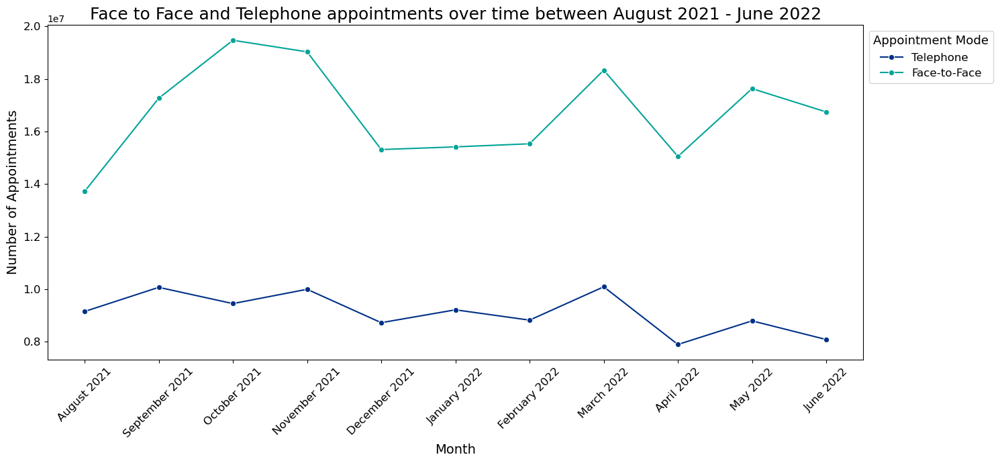

In [270]:
# Plot the appointment mode (Face-to-Face & Telephone) over time between August 2021 - June 2022
# Create a lineplot.
plt.figure(figsize=(15,7))

sns.lineplot(data = ar_mode_high_tier, 
             x= 'appointment_month_str',
             y='count_of_appointments', 
             hue = 'appointment_mode',
             marker = 'o',
             palette=nhs_colors)

# Apply the user-defined function to standardize all charts
chart_clean('Face to Face and Telephone appointments over time between August 2021 - June 2022',
            'Month',
            'Number of Appointments',
            'Appointment Mode')

plt.show()

- **Unkown** appointments are higher than Video and home visits, suggesting an issue in the data collection. 

In [272]:
# Low Tier appointment modes
low_tier = ['Video/Online','Unknown','Home Visit']
ar_mode_low_tier = ar_mode[ar_mode['appointment_mode'].isin(low_tier)]


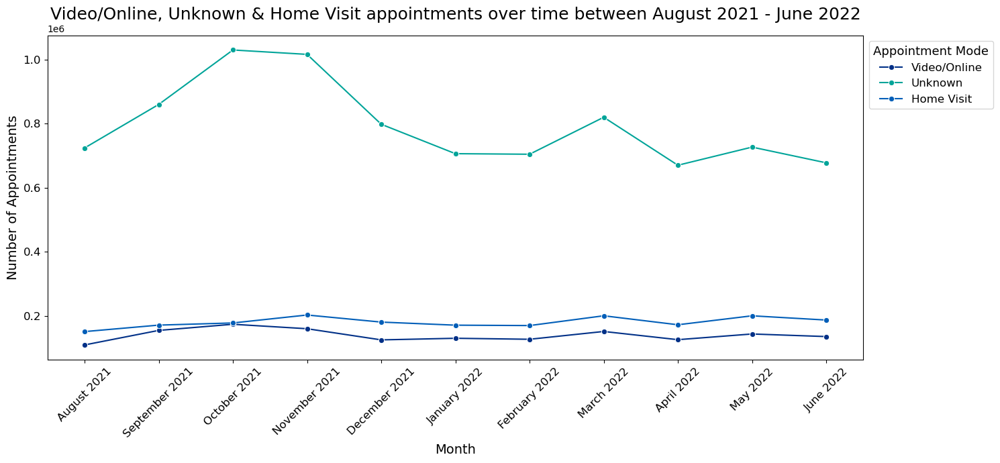

In [273]:
# Plot the appointment mode Video/Online Unknown Home Visit over time between August 2021 - June 2022
# Create a lineplot.
plt.figure(figsize=(15,7))

sns.lineplot(data = ar_mode_low_tier,
             x= 'appointment_month_str',
             y='count_of_appointments', 
             hue = 'appointment_mode',
             marker = 'o',
             palette=nhs_colors)

# Apply the user-defined function to standardize all charts
chart_clean('Video/Online, Unknown & Home Visit appointments over time between August 2021 - June 2022',
            'Month',
            'Number of Appointments',
            'Appointment Mode')

plt.show()

## Average Time between booking and Consultation

**Average time between book and appointment in the period between 01.08.2021 - 30.06.2022**
  
- This shows ***same day*** appointments are the highest in **Autumn 2021**, **Spring 2022** and **Winter 22**.

In [276]:
# Count appointments by average time between book and appointment for the date range between 01.08.2021 - 30.06.2022
filtered_avg_time_ar = (
    filtered_ar_nc.groupby(['avg_time_between_book_appointment',
                            'season_year'])[['count_of_appointments']]
    .sum()
    .sort_values(by='count_of_appointments',ascending = False)
    .reset_index())
#filtered_avg_time_ar

In [277]:
# Add percentage column
avg_time = percent(filtered_avg_time_ar)
avg_time.head()

,avg_time_between_book_appointment,season_year,count_of_appointments,percentage
0,0.0,Autumn 2021,37371031,12.63
1,0.0,Spring 2022,36199336,12.24
2,0.0,Winter 2022,23373812,7.90
3,4.5,Autumn 2021,19101662,6.46
4,4.5,Spring 2022,16172129,5.47


**Avg time between booking and consultation**
- Same-day appointments are the highest appointments over the analysed date range
- This is followed by appointments that are scheduled within less than a week

In [279]:
# Group by appointment month and average time between booking and consultation and hcp type to prep for the chart
avgtime = (
    filtered_ar_nc.groupby(['appointment_month_str','appointment_month','avg_time_between_book_appointment'])[['count_of_appointments']]
    .sum()
    .sort_values(by='appointment_month',ascending=True)
    .reset_index())

In [280]:
avgtime

,appointment_month_str,appointment_month,avg_time_between_book_appointment,count_of_appointments
0,August 2021,2021-08-01,28.0,673225
1,August 2021,2021-08-01,25.0,828866
2,August 2021,2021-08-01,18.0,1453209
3,August 2021,2021-08-01,11.0,2889150
4,August 2021,2021-08-01,4.5,4924960
...,...,...,...,...
72,June 2022,2022-06-01,18.0,1914740
73,June 2022,2022-06-01,25.0,1217197
74,June 2022,2022-06-01,28.0,1067420
75,June 2022,2022-06-01,0.0,11461923


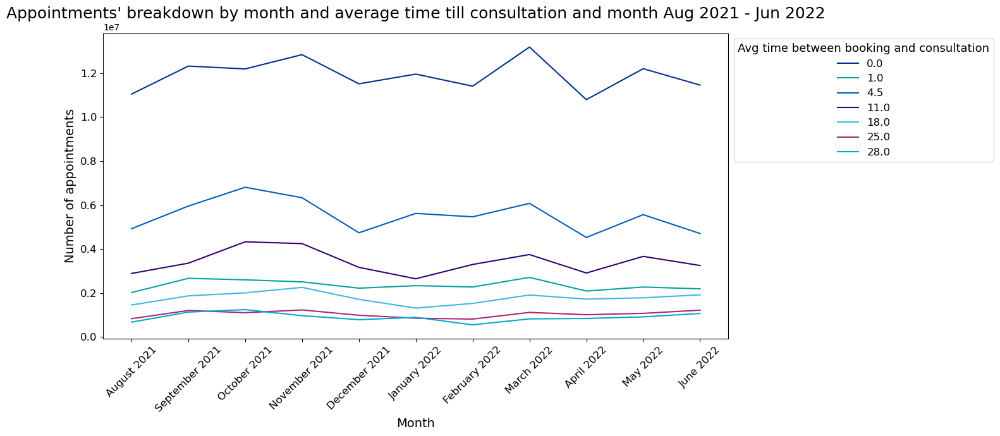

In [281]:
plt.figure(figsize=(15,7))

sns.lineplot(data = avgtime, 
             x= 'appointment_month_str',
             y='count_of_appointments',
             hue='avg_time_between_book_appointment',
             errorbar=None,
             palette=nhs_colors)

# Apply the user-defined function to standardize all charts
chart_clean(title="Appointments' breakdown by month and average time till consultation and month Aug 2021 - Jun 2022",
            xlabel='Month',
            ylabel='Number of appointments',
            legend='Avg time between booking and consultation')

plt.show()

### Low Tier Average Time between booking and consultation
To better see the trend of appointments with a longer wait time till consultation, a low-tier subset was created to look at appointments with 18, 25 and 28 days on average between booking and consultation.
- All three curves show a positive slope towards May and June 2022 which is suggesting an expected increase in the wait times.

In [283]:
# Low Tier average time between booking and consultation

avgtime_low= avgtime[(avgtime['avg_time_between_book_appointment']==18.0) |
                     (avgtime['avg_time_between_book_appointment']==25.0) | 
                     (avgtime['avg_time_between_book_appointment']==28.0) ]   
#avgtime_low

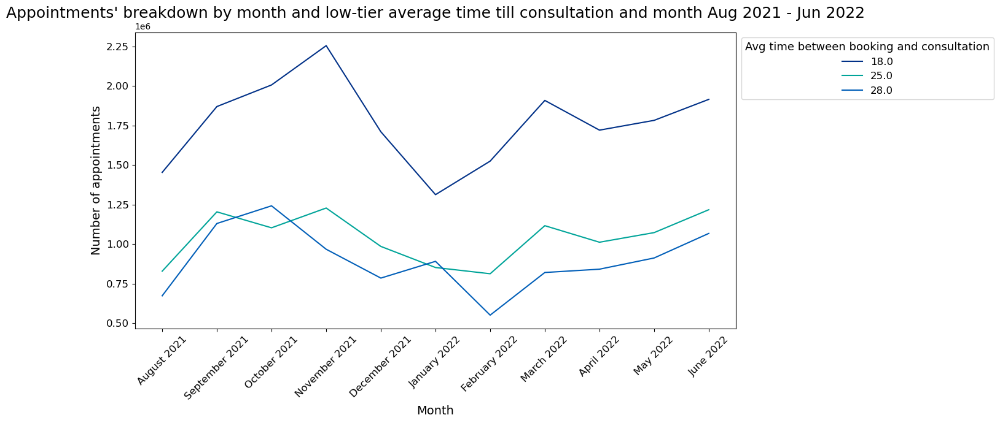

In [284]:
plt.figure(figsize=(15,7))

sns.lineplot(data = avgtime_low, 
             x= 'appointment_month_str',
             y='count_of_appointments',
             hue='avg_time_between_book_appointment',
             errorbar=None,
             palette=nhs_colors)

# Apply the user-defined function to standardize all charts
chart_clean(title="Appointments' breakdown by month and low-tier average time till consultation and month Aug 2021 - Jun 2022",
            xlabel='Month',
            ylabel='Number of appointments',
            legend='Avg time between booking and consultation')


plt.show()

### High-Tier average time between booking and consultation
High-tier average time was plotted on another chart to show the trend of quick appointments. 
The tier includes appointments with a waiting time of 0, 1, 4.5 and 11 days on average till consultation. 

- The chart shows a negative slope in all curves towards May and June 2022.
- This is suggesting an expected decrease in the number of quick appointments.


In [286]:
# High Tier average time between booking and consultation

avgtime_high= avgtime[(avgtime['avg_time_between_book_appointment']==0.0) |
                     (avgtime['avg_time_between_book_appointment']==1.0) | 
                     (avgtime['avg_time_between_book_appointment']==4.5) |
                     (avgtime['avg_time_between_book_appointment']==11.0) ]   
#avgtime_high

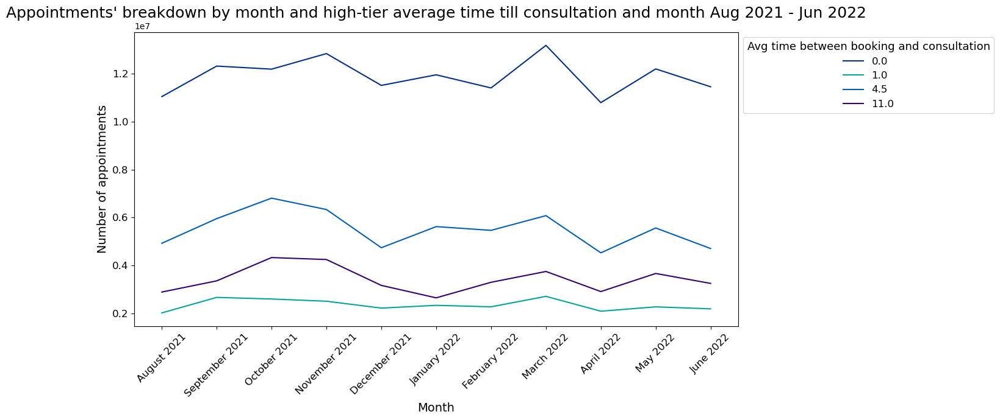

In [287]:
plt.figure(figsize=(15,7))

sns.lineplot(data = avgtime_high, 
             x= 'appointment_month_str',
             y='count_of_appointments',
             hue='avg_time_between_book_appointment',
             errorbar=None,
             palette=nhs_colors)

# Apply the user-defined function to standardize all charts
chart_clean(title="Appointments' breakdown by month and high-tier average time till consultation and month Aug 2021 - Jun 2022",
            xlabel='Month',
            ylabel='Number of appointments',
            legend='Avg time between booking and consultation')


plt.show()

## Average Appointment Duration

- Appointments with a duration of 8 mins are the highest within the date range Dec 2021 - June 2022.
- They are followed by 3 min and 11 mins appointments.

In [290]:
ad_duration = (
    ad.groupby(['appointment_month_str',
                'appointment_date',
                'average_duration'])[['count_of_appointments']]
    .sum()
    .sort_values(by='appointment_date',ascending = True)
    .reset_index())

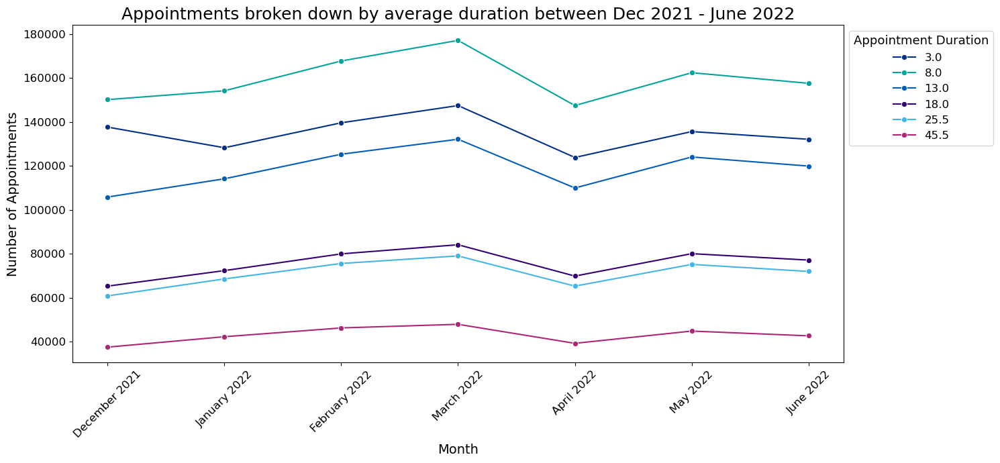

In [291]:
# Plot the time between booking and appointment over time between December 2021 - June 2022
# Create a lineplot.
plt.figure(figsize=(15,7))

sns.lineplot(data = ad_duration,
             x= 'appointment_month_str',
             y='count_of_appointments', 
             hue = 'average_duration',
             marker = 'o',
             palette=nhs_colors, 
             errorbar=None)

# Apply the user-defined function to standardize all charts
chart_clean('Appointments broken down by average duration between Dec 2021 - June 2022',
            'Month',
            'Number of Appointments',
            'Appointment Duration')


plt.show()


### Low-Tier & High-Tier average appointment duration
The separation between low and high tier average duration appointments was made to see the lines and their trends clearly. 
- Low-Tier include appointments with an average duration of 18, 25 and 45.5 minutes
- High-Tier include appointments with an average duration of 3, 8 and 13 minutes

In [293]:
# Low Tier average appointment duration

avgdur_low= ad_duration[(ad_duration['average_duration']==18.0) |
                        (ad_duration['average_duration']==25.5) | 
                        (ad_duration['average_duration']==45.5) ]   
#avgtime_low

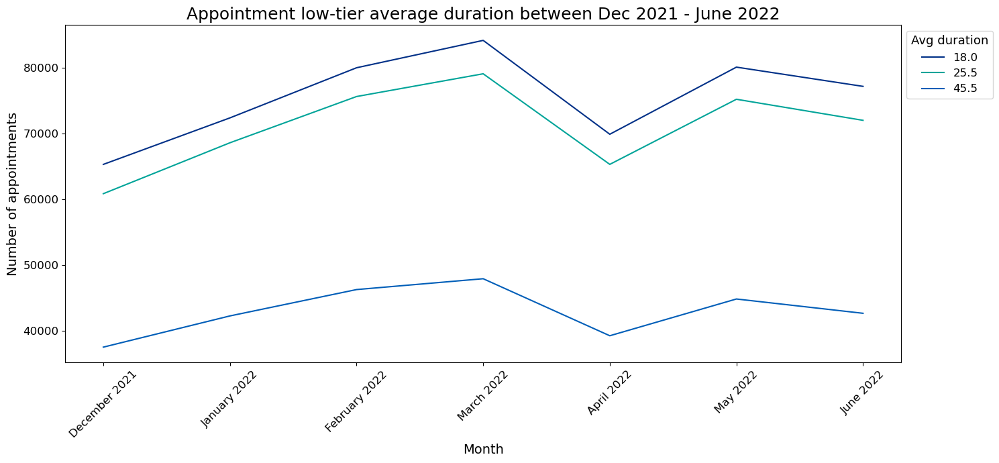

In [294]:
plt.figure(figsize=(15,7))

sns.lineplot(data = avgdur_low,
             x= 'appointment_month_str',
             y='count_of_appointments',
             hue='average_duration',
             errorbar=None,
             palette=nhs_colors)

# Apply the user-defined function to standardize all charts
chart_clean(title="Appointment low-tier average duration between Dec 2021 - June 2022",
            xlabel='Month',
            ylabel='Number of appointments',
            legend='Avg duration')


plt.show()

In [295]:
# High Tier average appointment duration

avgdur_high= ad_duration[(ad_duration['average_duration']==3.0) |
                        (ad_duration['average_duration']==8.0) | 
                        (ad_duration['average_duration']==13.0) ]   
#avgtime_low

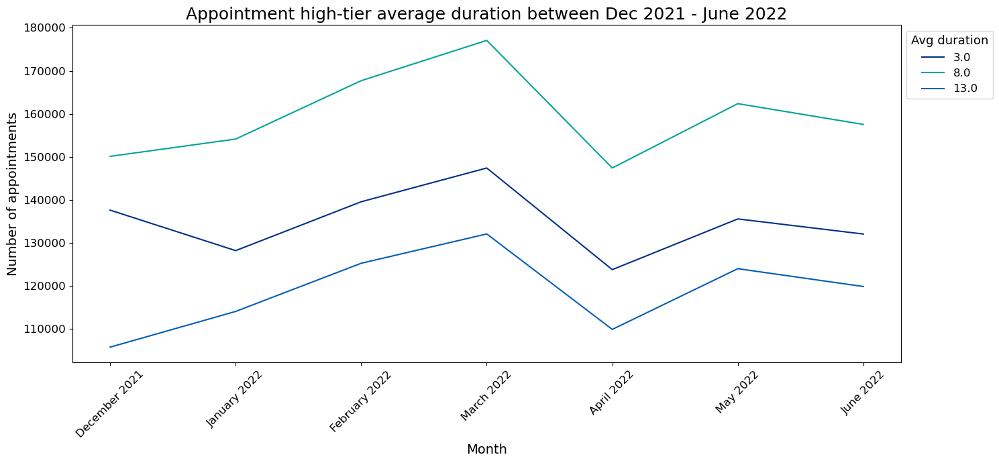

In [296]:
plt.figure(figsize=(15,7))

sns.lineplot(data = avgdur_high, 
             x= 'appointment_month_str',
             y='count_of_appointments',
             hue='average_duration',
             errorbar=None,
             palette=nhs_colors)

# Apply the user-defined function to standardize all charts
chart_clean(title="Appointment high-tier average duration between Dec 2021 - June 2022",
            xlabel='Month',
            ylabel='Number of appointments',
            legend='Avg duration')

plt.show()

# 8. Regional / Seasonal Trends

## Locations / Regions
This section will focus on trends, calculations and charts that are specific to regions or locations. 

### Regions

In [300]:
# Determine the number of regions
print('Unique regions: ',len(nc['region'].unique()))

Unique regions:  7


**The region with the highest number of appointments**

The aggregation is using the ar DataFrame as it's the DataFrame with the longest date range. 
- **Midlands** has the highest number of appointments
- **London** comes 4th by number of appointments

In [302]:
# Sum of appointments by region
region_appointments = (
    ar.groupby('region')[['count_of_appointments']]
    .sum()
    .sort_values(by='count_of_appointments',ascending=False))
region_appointments

,count_of_appointments
region,
Midlands,143625196
North East and Yorkshire,121448860
South East,112144789
London,107684862
North West,88702868
East of England,86228648
South West,82969302


Plotting the data for the previous question as a time series, we can draw the following insights:

- All regions have a consistent pattern across tracked months
- **Midlands** is the highest in terms of number of appointments and there is a big gap between it and all other regions
- **The set is then divided in two main categories:**
- **London, North West and North East and Yorkshire** are close in number of appointments especially in 2022 and they fall between the Midlands and the lowest set of regions.
- **North West, South West and East England** are similar in number of appointments and they're the regions with the lowest number of appointments.
- **North West, South West and East England** almost overlapped in 2020 during the onset of the pandemic and till **September 2020**

In [304]:
# Prep a group by for the line chart
line_region = (
    ar.groupby(['appointment_month',
                'appointment_month_str',
                'region'])[['count_of_appointments']]
    .sum()
    .sort_values(by='appointment_month',ascending = True)
    .reset_index())

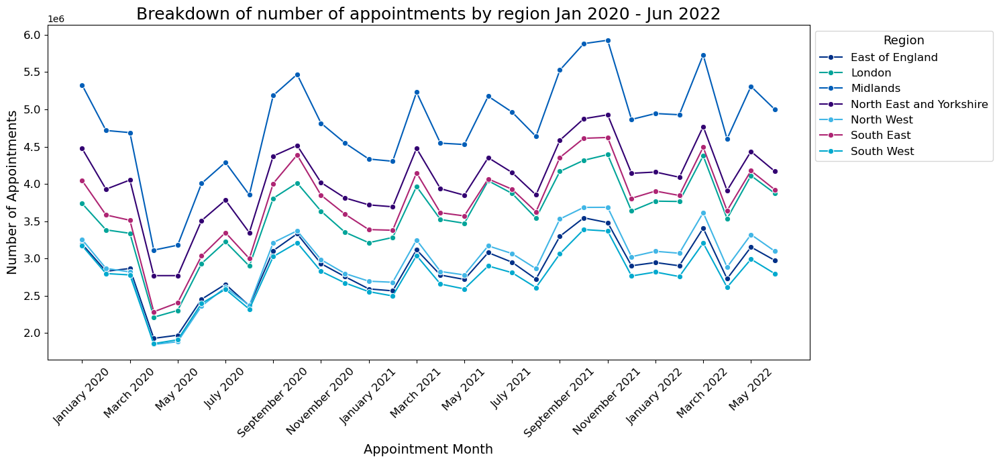

In [305]:
# Set the size of the chart
plt.figure(figsize=(15,7))

# Create a lineplot for the number of appointments per month broken drown by region
sns.lineplot(data = line_region, 
             x= 'appointment_month_str',
             y='count_of_appointments', 
             hue='region', 
             marker = 'o',
             errorbar=None,
             palette=nhs_colors)

# Apply the user-defined function to standardize all charts
chart_clean(title='Breakdown of number of appointments by region Jan 2020 - Jun 2022',
            xlabel='Appointment Month',
            ylabel='Number of Appointments',
            legend='Region')

# Getting the labels on the xaxis
ax = plt.gca()  # Get current axis
ticks = ax.get_xticks()
labels = ax.get_xticklabels()

# Show every 2nd tick
ax.set_xticks(ticks[::2])
ax.set_xticklabels([label.get_text() for label in labels[::2]], rotation=45)

plt.show()

**Appointments made between Jan 2020 and June 2022 broken down by region**

Checking the DataFrame with the longest date range would allow us to see trends across seasons, years and special cases like the pandemic period. 

This is why the answer to this question relies on the **ar DataFrame**.

In [307]:
# Determine the regions' list together with their sum of appointment counts
# The result is sorted by the sum value of count of appointments
region_sum = ar.pivot_table(index='appointment_month',
                            columns='region',
                            values='count_of_appointments',
                            aggfunc='sum')
region_sum.head()

region,East of England,London,Midlands,North East and Yorkshire,North West,South East,South West
appointment_month,,,,,,,
2020-01-01,3192308,3736924,5326136,4474327,3253398,4044622,3171581
2020-02-01,2827790,3383402,4717291,3929083,2866183,3583468,2797404
2020-03-01,2865248,3337073,4688218,4052635,2819365,3512070,2778859
2020-04-01,1927799,2211432,3111746,2769330,1845663,2284464,1857447
2020-05-01,1970358,2302672,3177905,2769544,1882752,2405151,1908830


- **November 2021** shows an all time high across all regions except for the South West
- Another chart will be created only focusing on Dec 2021 - Jun 2022 for better readability

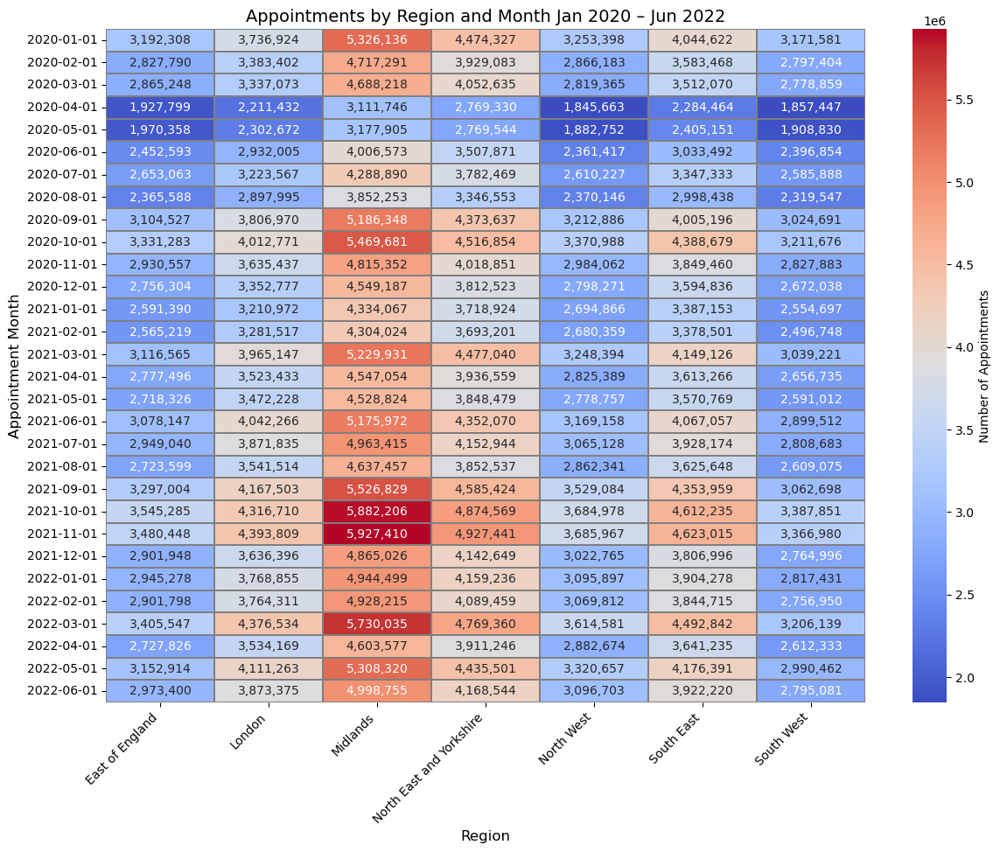

In [309]:
# Set the figure size
plt.figure(figsize=(14, 10))

# Convert the index as string before plotting
region_sum.index = region_sum.index.astype(str)

# Plot a heatmap for the pivoted table
sns.heatmap(
    region_sum,              
    annot=True,                
    fmt=',.0f',
    cmap='coolwarm',               
    linewidths=0.3,              
    linecolor='gray',
    cbar_kws={"label": "Number of Appointments"} 
)

# Ajust ticks and labels
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(fontsize=10)
plt.xlabel('Region', fontsize=12)
plt.ylabel('Appointment Month', fontsize=12)
plt.title('Appointments by Region and Month Jan 2020 – Jun 2022', fontsize=14)


plt.show()

In [310]:
# Determine the regions' list together with their sum of appointment counts
# The result is sorted by the sum value of count of appointments
region_sum_2022 = filtered_ar.pivot_table(index='appointment_month',
                            columns='region',
                            values='count_of_appointments',
                            aggfunc='sum')
region_sum_2022.head()

region,East of England,London,Midlands,North East and Yorkshire,North West,South East,South West
appointment_month,,,,,,,
2021-12-01,2901948,3636396,4865026,4142649,3022765,3806996,2764996
2022-01-01,2945278,3768855,4944499,4159236,3095897,3904278,2817431
2022-02-01,2901798,3764311,4928215,4089459,3069812,3844715,2756950
2022-03-01,3405547,4376534,5730035,4769360,3614581,4492842,3206139
2022-04-01,2727826,3534169,4603577,3911246,2882674,3641235,2612333


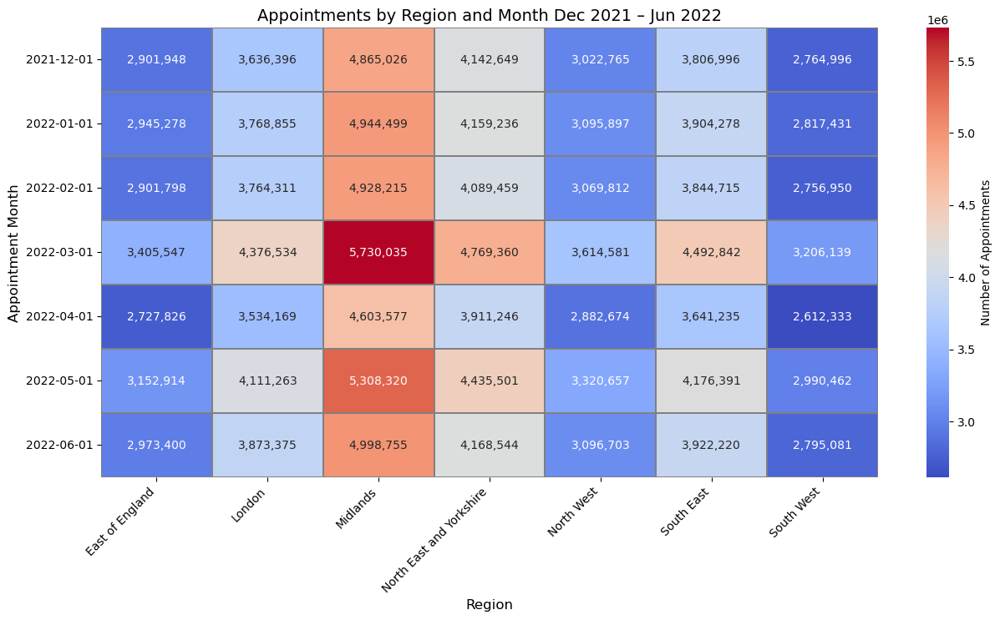

In [311]:
# Set the figure size
plt.figure(figsize=(15, 7))

# Convert the index as string before plotting
region_sum_2022.index = region_sum_2022.index.astype(str)

# Plot a heatmap for the pivoted table
sns.heatmap(
    region_sum_2022,              
    annot=True,                
    fmt=',.0f',
    cmap='coolwarm',               
    linewidths=0.1,              
    linecolor='gray',
    cbar_kws={"label": "Number of Appointments"} 
)

# Ajust ticks and labels
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(fontsize=10)
plt.xlabel('Region', fontsize=12)
plt.ylabel('Appointment Month', fontsize=12)
plt.title('Appointments by Region and Month Dec 2021 – Jun 2022', fontsize=14)


plt.show()

**Attended Appointments**
The following heatmap only focuses on the attended appointments across regions and over the course of Dec 2021 - Jun 2022

The sudden surge in the number of appointments in March 2022 is confirmed by the following source:

https://www.pulsetoday.co.uk/news/breaking-news/last-month-saw-gps-deliver-the-highest-number-of-consultations-on-record/

Another source confirms that March 2022 witnessed a record in staff decrease:

https://managementinpractice.com/news/gp-appointments-up-by-4-million-in-march-official-figures-show/

In [313]:
# Filter the filtered_ar DataFrame to only keep Attended appointments
attended_filtered_ar = filtered_ar[filtered_ar['appointment_status']=='Attended']

In [314]:
# Determine the regions' list together with their sum of appointment counts
# The result is sorted by the sum value of count of appointments
attended_sum_2022 = attended_filtered_ar.pivot_table(index='appointment_month',
                            columns='region',
                            values='count_of_appointments',
                            aggfunc='sum')
#attended_sum_2022.head()

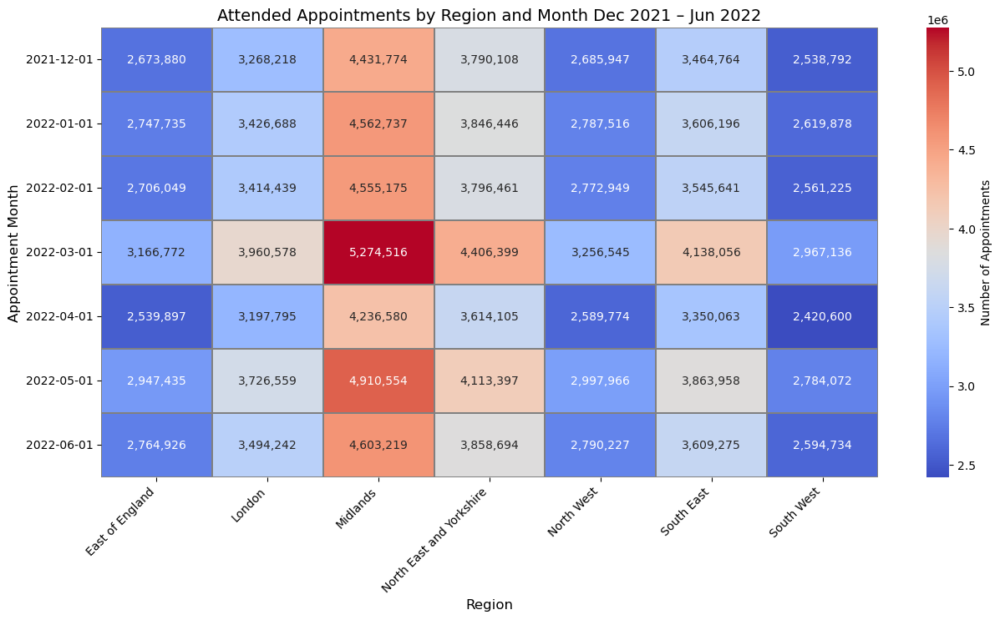

In [315]:
# Set the figure size
plt.figure(figsize=(15, 7))

# Convert the index as string before plotting
attended_sum_2022.index = attended_sum_2022.index.astype(str)

# Plot a heatmap for the pivoted table
sns.heatmap(
    attended_sum_2022,              
    annot=True,                
    fmt=',.0f',
    cmap='coolwarm',               
    linewidths=0.1,              
    linecolor='gray',
    cbar_kws={"label": "Number of Appointments"} 
)

# Ajust ticks and labels
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(fontsize=10)
plt.xlabel('Region', fontsize=12)
plt.ylabel('Appointment Month', fontsize=12)
plt.title('Attended Appointments by Region and Month Dec 2021 – Jun 2022', fontsize=14)


plt.show()

**DNA Appointments**
The following heatmap only focuses on the DNA appointments across regions and over the course of Dec 2021 - Jun 2022
The heatmap shows the following:
- **Midlands and London** are the highest regions with unattended appointments
- This is especially the case in **March 2022**

In [317]:
# Filter the filtered_ar DataFrame to only keep Attended appointments
DNA_filtered_ar = filtered_ar[filtered_ar['appointment_status']=='DNA']

In [318]:
# Determine the regions' list together with their sum of appointment counts
# The result is sorted by the sum value of count of appointments
DNA_sum_2022 = DNA_filtered_ar.pivot_table(index='appointment_month',
                            columns='region',
                            values='count_of_appointments',
                            aggfunc='sum')
#DNA_sum_2022.head()

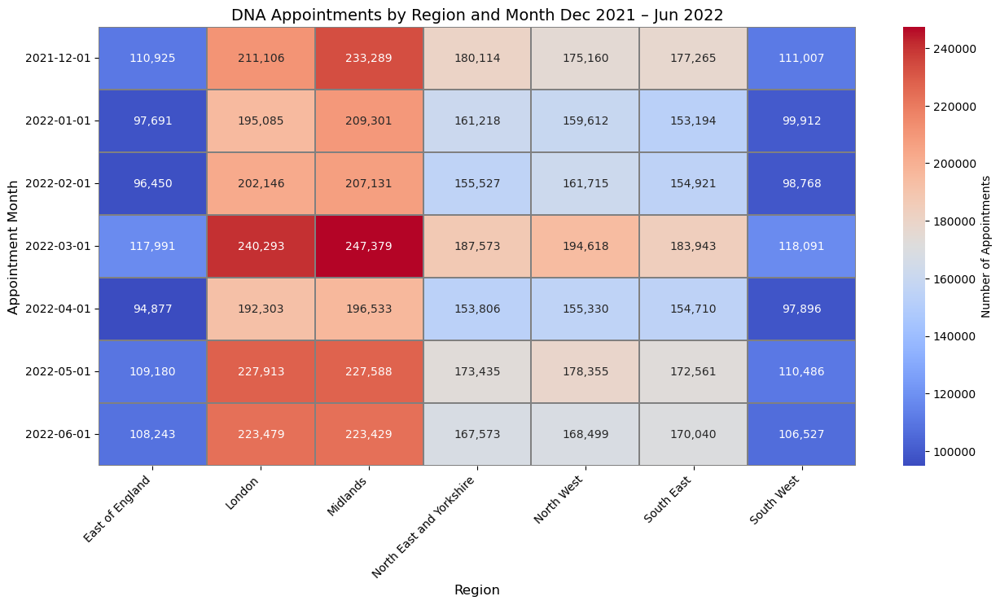

In [319]:
# Set the figure size
plt.figure(figsize=(15, 7))

# Convert the index as string before plotting
DNA_sum_2022.index = DNA_sum_2022.index.astype(str)

# Plot a heatmap for the pivoted table
sns.heatmap(
    DNA_sum_2022,              
    annot=True,                
    fmt=',.0f',
    cmap='coolwarm',               
    linewidths=0.1,              
    linecolor='gray',
    cbar_kws={"label": "Number of Appointments"} 
)

# Ajust ticks and labels
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(fontsize=10)
plt.xlabel('Region', fontsize=12)
plt.ylabel('Appointment Month', fontsize=12)
plt.title('DNA Appointments by Region and Month Dec 2021 – Jun 2022', fontsize=14)


plt.show()

Analyze the relation between the average time between booking and consultation broken down by region between Aug 2021 and Jun 2022

**Region Chart**
- **For appointments within less than 11 days** the 4 top regions are consistently the highest.
- **London** has the highest number of next-day appointments it is also only second to the Midlands in appointments taken within a week.
- This suggests that there is pressure on quicker appointments in London. 

In [321]:
avgtime_season = (
    filtered_ar_nc.groupby(['appointment_month',
                            'avg_time_between_book_appointment',
                            'season_year',
                            'region'])[['count_of_appointments']]
    .sum()
    .sort_values(by='appointment_month',ascending=True)
    .sort_values(by='appointment_month',ascending=True)
    .reset_index())
avgtime_season

,appointment_month,avg_time_between_book_appointment,season_year,region,count_of_appointments
0,2021-08-01,0.0,Summer 2021,East of England,1268407
1,2021-08-01,0.0,Summer 2021,Midlands,2257625
2,2021-08-01,0.0,Summer 2021,North East and Yorkshire,1732771
3,2021-08-01,0.0,Summer 2021,North West,1346390
4,2021-08-01,0.0,Summer 2021,South East,1676715
...,...,...,...,...,...
534,2022-06-01,28.0,Summer 2022,North East and Yorkshire,198758
535,2022-06-01,11.0,Summer 2022,North West,376955
536,2022-06-01,25.0,Summer 2022,London,123768
537,2022-06-01,28.0,Summer 2022,North West,116396


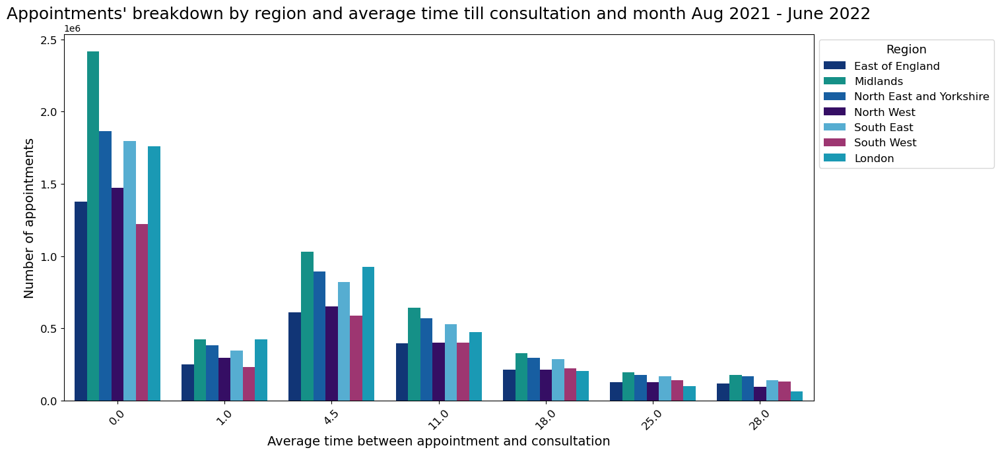

In [322]:
plt.figure(figsize=(15,7))

sns.barplot(x='avg_time_between_book_appointment',
            y='count_of_appointments',
            hue = 'region',
            data=avgtime_season, 
            errorbar = None,  
            palette=nhs_colors)

# Apply the user-defined function to standardize all charts
chart_clean(title="Appointments' breakdown by region and average time till consultation and month Aug 2021 - June 2022",
            xlabel='Average time between appointment and consultation',
            ylabel='Number of appointments',
            legend='Region')


plt.show()

### Location

In [324]:
# Determine the number of unique locations
print('Unique locations: ',len(nc['icb_ons_code'].unique()))

Unique locations:  42


Five icb_ons_code locations with the highest number of appointments between 01.08.2021 - 30.06.2022

In [326]:
# Determine the locations' icb_ons_code list together with their sum of appointment counts
# The result is sorted by the sum value of count of appointments
icb_appointment_sum = (
    nc.groupby(['icb_ons_code',
                'region'])[['count_of_appointments']]
    .sum()
    .sort_values(by='count_of_appointments',ascending = False))
icb_appointment_sum.head(10)

,,count_of_appointments
icb_ons_code,region,
E54000050,North East and Yorkshire,16882235
E54000054,North East and Yorkshire,14358371
E54000057,North West,13857900
E54000008,North West,13250311
E54000027,London,12142390
E54000029,London,9588891
E54000032,South East,9286167
E54000042,South East,9210625
E54000051,North East and Yorkshire,9125945


**Lineplot of the top 10 ICB Codes** by number of appointments between August 2021 - June 2022
- The chart shows a peak in November 2021 and in March 2022. 

In [328]:
# Select the top 10 icb locations by number of appointments
top_icb = icb_appointment_sum.head(10).reset_index()
#top_icb

# Get a series of the top icb ons codes
top_icb_codes = top_icb['icb_ons_code']
#top_icb_codes

# Filter by the codes of the top 10 icb codes
filtered_ar_nc_top_icb = filtered_ar_nc[filtered_ar_nc['icb_ons_code'].isin(top_icb_codes)]

# Icb grouping of the top 10 in prep for line chart
icb_group= (
    filtered_ar_nc_top_icb.groupby(['appointment_month_str',
                                    'appointment_month',
                                    'icb_ons_code',
                                    'appointment_status'])[['count_of_appointments']]
    .sum()
    .sort_values(by='appointment_month',ascending = True)
    .reset_index())
#filtered_ar_nc_top_icb 

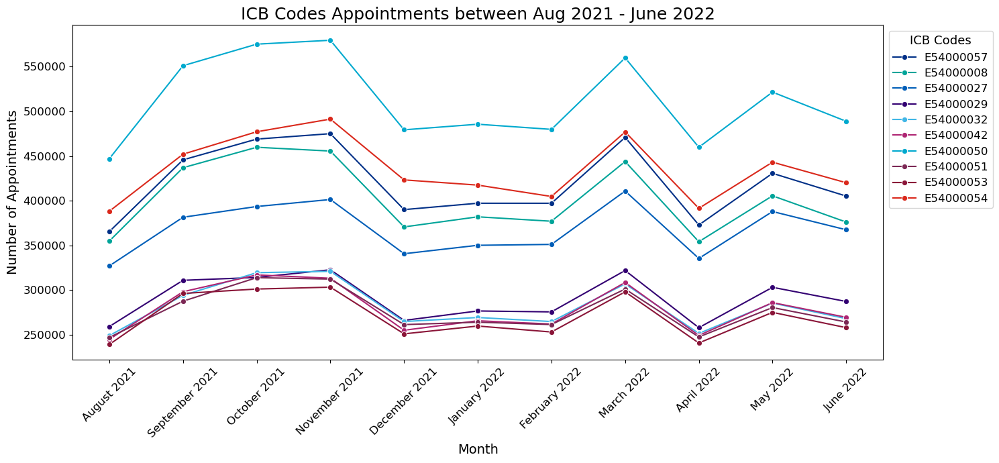

In [329]:
# Plot the number of appointments broken down by the top 10 icb locations August 2021 - June 2022
# Create a lineplot.
plt.figure(figsize=(15,7))

sns.lineplot(data = icb_group,
             x= 'appointment_month_str',
             y='count_of_appointments', 
             hue = 'icb_ons_code',
             marker = 'o',
             palette=nhs_colors, 
             errorbar=None)

# Apply the user-defined function to standardize all charts
chart_clean('ICB Codes Appointments between Aug 2021 - June 2022',
            'Month',
            'Number of Appointments',
            'ICB Codes')


plt.show()


In [330]:
# Determine the number of unique sub-icb-locations
print('Unique sub-icb-locations: ',len(nc['sub_icb_location_name'].unique()))

Unique sub-icb-locations:  106


Five sub-locations with the highest number of appointments between 01.08.2021 - 30.06.2022?

In [332]:
# Determine the sub_locations' list together with their sum of appointment counts
# The result is sorted by the sum value of count of appointments
sub_icb_appointment_sum = (
    nc.groupby('sub_icb_location_name')[['count_of_appointments']]
    .sum()
    .sort_values(by='count_of_appointments',ascending = False)
    .reset_index())
sub_icb_appointment_sum.head()

,sub_icb_location_name,count_of_appointments
0,NHS North West London ICB - W2U3Z,12142390
1,NHS North East London ICB - A3A8R,9588891
2,NHS Kent and Medway ICB - 91Q,9286167
3,NHS Hampshire and Isle Of Wight ICB - D9Y0V,8288102
4,NHS South East London ICB - 72Q,7850170


In [333]:
# Select the top 10 sub icb locations by number of appointments
top_sub = sub_icb_appointment_sum.head(10).reset_index()
#top_icb

# Get a series of the top sub icb locations
top_sub_names = top_sub['sub_icb_location_name']
#top_icb_codes

# Filter by the codes of the top sub icb locations
filtered_ar_nc_top_sub = nc[nc['sub_icb_location_name'].isin(top_sub_names)]

# Icb grouping of the top 10 in prep for line chart
sub_group= (
    filtered_ar_nc_top_sub.groupby(['appointment_month_str',
                                    'appointment_month',
                                    'sub_icb_location_name'])[['count_of_appointments']]
    .sum()
    .sort_values(by='appointment_month',ascending = True)
    .reset_index())


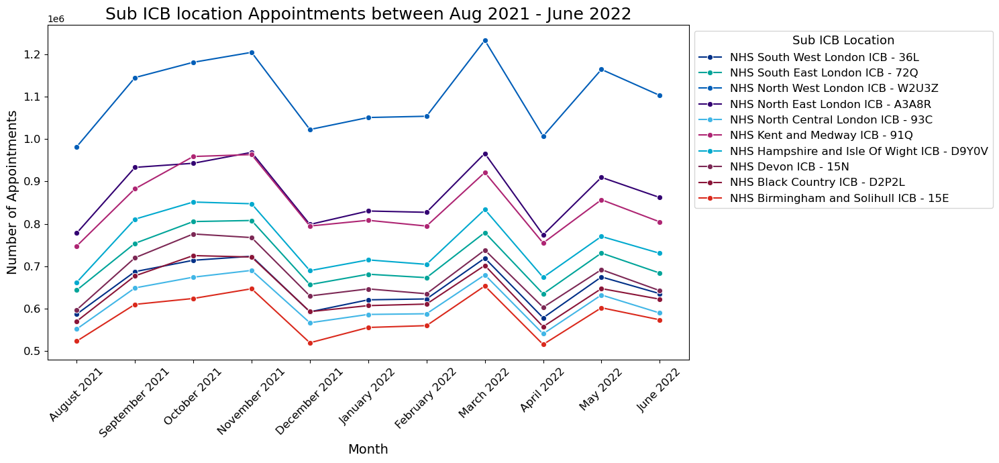

In [334]:
# Plot the number of appointments broken down by the top 10 sub_icb locations August 2021 - June 2022
# Create a lineplot.
plt.figure(figsize=(15,7))

sns.lineplot(data = sub_group, 
             x= 'appointment_month_str',
             y='count_of_appointments', 
             hue = 'sub_icb_location_name',
             marker = 'o',
             palette=nhs_colors,
             errorbar=None)

# Apply the user-defined function to standardize all charts
chart_clean('Sub ICB location Appointments between Aug 2021 - June 2022',
            'Month',
            'Number of Appointments',
            'Sub ICB Location')


plt.show()



### Season Chart
To analyze the relation between the average time between booking and consultation broken down by season 

To get full seasons the date range was adjusted for the following chart to be 01.06.2021 - 31.05.2022 and this is to include full Summer 2021 and full Spring 2022.
- Other than Autumn 2021, Spring 2022 shows a spike in number of appointments under all brackets. This is with the exception of appointments booked within 4.5 days. 

In [336]:
# Filter the ar DataFrame for the date range 01.06.2021 - 31.05.2022
start_season = '2021.06.01'
end_season = '2022.05.31'

# Use the filter_date to ar the DataFrame to match nc date range
ar_season=filter_date(ar,'appointment_month',start_season,end_season)

# Reset index of the returned DataFrame
ar_season = ar_season.reset_index()

#filtered_ar_nc

In [337]:
avgtime_fullseason = (
    ar_season.groupby(['appointment_month',
                       'avg_time_between_book_appointment',
                       'season_year',
                       'region'])[['count_of_appointments']]
    .sum()
    .sort_values(by='appointment_month',ascending=True)
    .sort_values(by='appointment_month',ascending=True)
    .reset_index())
avgtime_fullseason

,appointment_month,avg_time_between_book_appointment,season_year,region,count_of_appointments
0,2021-06-01,0.0,Summer 2021,East of England,1425216
1,2021-06-01,0.0,Summer 2021,Midlands,2479233
2,2021-06-01,0.0,Summer 2021,North East and Yorkshire,1916114
3,2021-06-01,0.0,Summer 2021,North West,1473653
4,2021-06-01,0.0,Summer 2021,South East,1850929
...,...,...,...,...,...
583,2022-05-01,28.0,Spring 2022,North East and Yorkshire,178033
584,2022-05-01,11.0,Spring 2022,North West,428262
585,2022-05-01,25.0,Spring 2022,London,109370
586,2022-05-01,28.0,Spring 2022,North West,95407


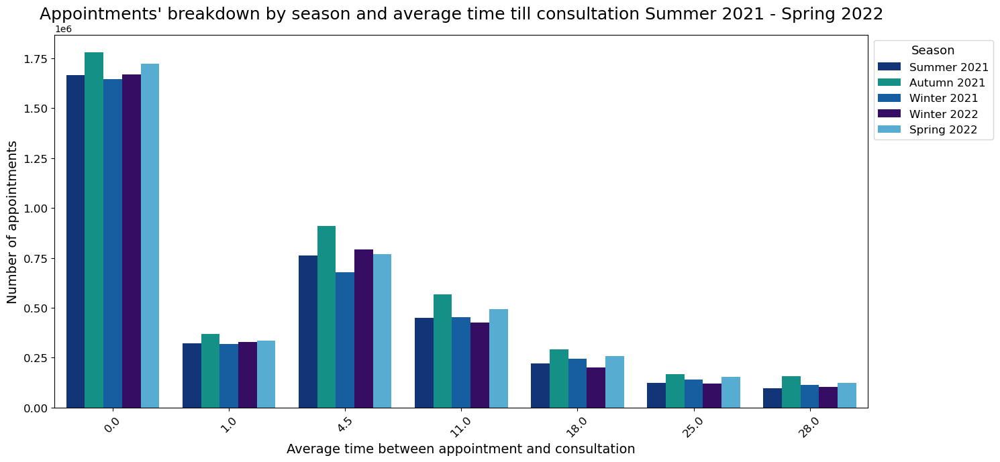

In [338]:
plt.figure(figsize=(15,7))
sns.barplot(x='avg_time_between_book_appointment', 
            y='count_of_appointments',
            hue = 'season_year',
            data=avgtime_fullseason, 
            errorbar = None, 
            palette=nhs_colors)

# Apply the user-defined function to standardize all charts
chart_clean(title="Appointments' breakdown by season and average time till consultation Summer 2021 - Spring 2022",
            xlabel='Average time between appointment and consultation',
            ylabel='Number of appointments',
            legend='Season')

#Saving the file 
plt.savefig('Season_timeconsul.png', dpi=300, bbox_inches='tight')
plt.show()

### Seasonal Visulatizations** for the service setting
Since it includes the sevice setting, the charts will revert back to the date range of the nc DataFrame. 
 

In [340]:
nc_ss_day = (
    nc.groupby(['appointment_month',
                'season_year',
                'service_setting'])[['count_of_appointments']]
    .sum()
    .sort_values(by='appointment_month',ascending=True)
    .reset_index())
#nc_ss_day

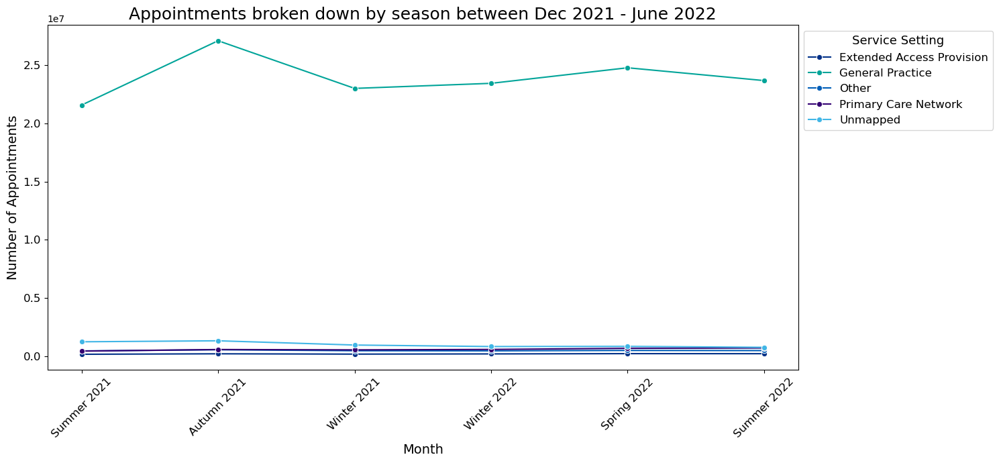

In [341]:
# Plot seasons number of appointments between August 2021 - June 2022
# Create a lineplot.
plt.figure(figsize=(15,7))

sns.lineplot(data = nc_ss_day, 
             x= 'season_year',
             y='count_of_appointments', 
             hue = 'service_setting',
             marker = 'o',
             palette=nhs_colors, 
             errorbar=None)

# Apply the user-defined function to standardize all charts
chart_clean('Appointments broken down by season between Dec 2021 - June 2022',
            'Month',
            'Number of Appointments',
            'Service Setting')


plt.show()


In [342]:
nc_ss_day_filtered = nc_ss_day[nc_ss_day['service_setting']!='General Practice']

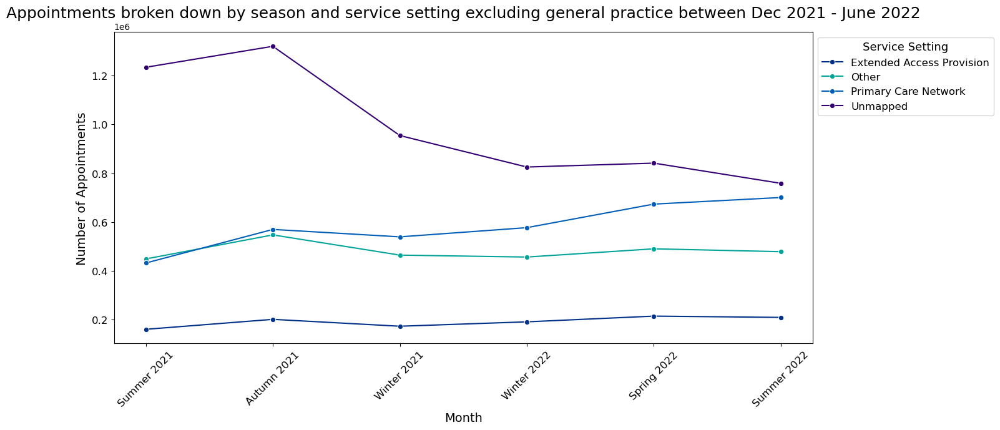

In [343]:
# Plot seasons number of appointments between August 2021 - June 2022
# Create a lineplot.
plt.figure(figsize=(15,7))

sns.lineplot(data = nc_ss_day_filtered, 
             x= 'season_year',
             y='count_of_appointments', 
             hue = 'service_setting',
             marker = 'o',
             palette=nhs_colors, 
             errorbar=None)

# Apply the user-defined function to standardize all charts
chart_clean('Appointments broken down by season and service setting excluding general practice between Dec 2021 - June 2022',
            'Month',
            'Number of Appointments',
            'Service Setting')


plt.show()


As the nc DataFrame includes columns for season_year, the chart will be utilizing those to aggregate the nc DataFrame by season and year.
The approach to this is to draw them on point plots, as there are seasons with only one month: 
- Summer 2021
- Winter 2021
- Summer 2022.
**The General practice** will be filtered out on the second chart and this is to emphasize the trends on the other service settings.

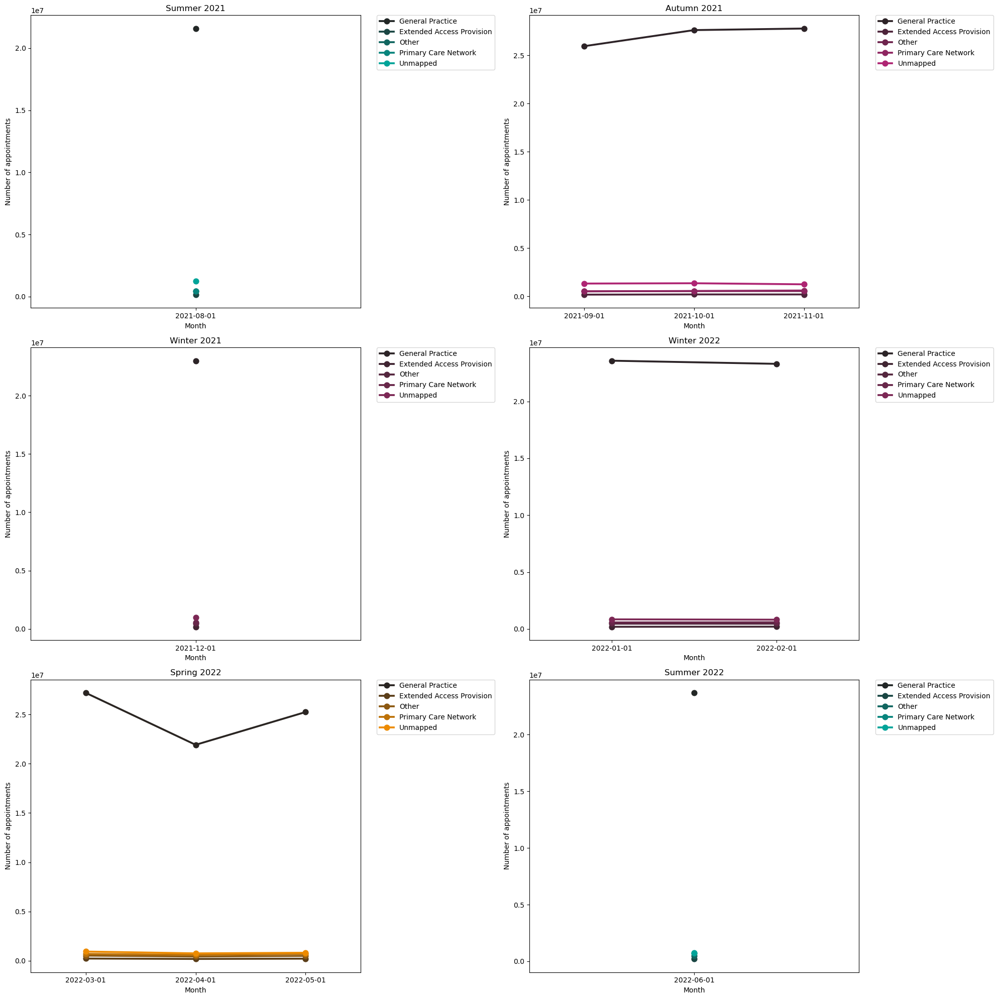

In [345]:
figseason,axes=plt.subplots(nrows = 3,ncols = 2, figsize=(20,20))

hue_order = ['General Practice',
    'Extended Access Provision',
    'Other',
    'Primary Care Network',
    'Unmapped'
]

# Filter and plot on each axis using seaborn
# Plot for Summer 2021
sns.pointplot(data=nc_ss_day[nc_ss_day['season_year'] == 'Summer 2021'], 
            x='appointment_month', 
            y='count_of_appointments',
            hue='service_setting', 
            hue_order=hue_order,
            ax=axes[0][0], 
            color='#00A499',
            errorbar = None)
axes[0][0].legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
axes[0][0].set_title("Summer 2021")
axes[0][0].set_xlabel("Month")
axes[0][0].set_ylabel("Number of appointments")

# Plot for Autumn 2021
sns.pointplot(data=nc_ss_day[nc_ss_day['season_year'] == 'Autumn 2021'], 
            x='appointment_month', 
            y='count_of_appointments', 
            hue='service_setting',
            hue_order=hue_order,
            ax=axes[0][1], 
            color='#AE2573',
            errorbar=None)
axes[0][1].legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
axes[0][1].set_title("Autumn 2021")
axes[0][1].set_xlabel("Month")
axes[0][1].set_ylabel("Number of appointments")


# Plot for Winter 2021
sns.pointplot(data=nc_ss_day[nc_ss_day['season_year'] == 'Winter 2021'],
            x='appointment_month', 
            y='count_of_appointments', 
            hue='service_setting',
            hue_order=hue_order,
            ax=axes[1][0], 
            color='#7C2855',
           errorbar=None)
axes[1][0].legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
axes[1][0].set_title("Winter 2021")
axes[1][0].set_xlabel("Month")
axes[1][0].set_ylabel("Number of appointments")


# Plot for Winter 2022
sns.pointplot(data=nc_ss_day[nc_ss_day['season_year'] == 'Winter 2022'],
            x='appointment_month', 
            y='count_of_appointments', 
            hue='service_setting',
            hue_order=hue_order,
            ax=axes[1][1], 
            color='#7C2855',
            errorbar=None)
axes[1][1].legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
axes[1][1].set_title("Winter 2022")
axes[1][1].set_xlabel("Month")
axes[1][1].set_ylabel("Number of appointments")



# Plot for Spring 2022
sns.pointplot(data=nc_ss_day[nc_ss_day['season_year'] == 'Spring 2022'], 
            x='appointment_month',
            y='count_of_appointments', 
            hue='service_setting',
            hue_order=hue_order,
            ax=axes[2][0], 
            color='#ED8B00',
           errorbar=None)
axes[2][0].legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
axes[2][0].set_title("Spring 2022")
axes[2][0].set_xlabel("Month")
axes[2][0].set_ylabel("Number of appointments")


# Plot for Summer 2022
sns.pointplot(data=nc_ss_day[nc_ss_day['season_year'] == 'Summer 2022'], 
            x='appointment_month',
            y='count_of_appointments', 
            hue='service_setting',
            hue_order=hue_order,
            ax=axes[2][1], 
            color='#00A499',
            errorbar=None)
axes[2][1].legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
axes[2][1].set_title("Summer 2022")
axes[2][1].set_xlabel("Month")
axes[2][1].set_ylabel("Number of appointments")

# To adjust the layout of the charts
plt.tight_layout()
plt.show()


Filtering out the General Practice

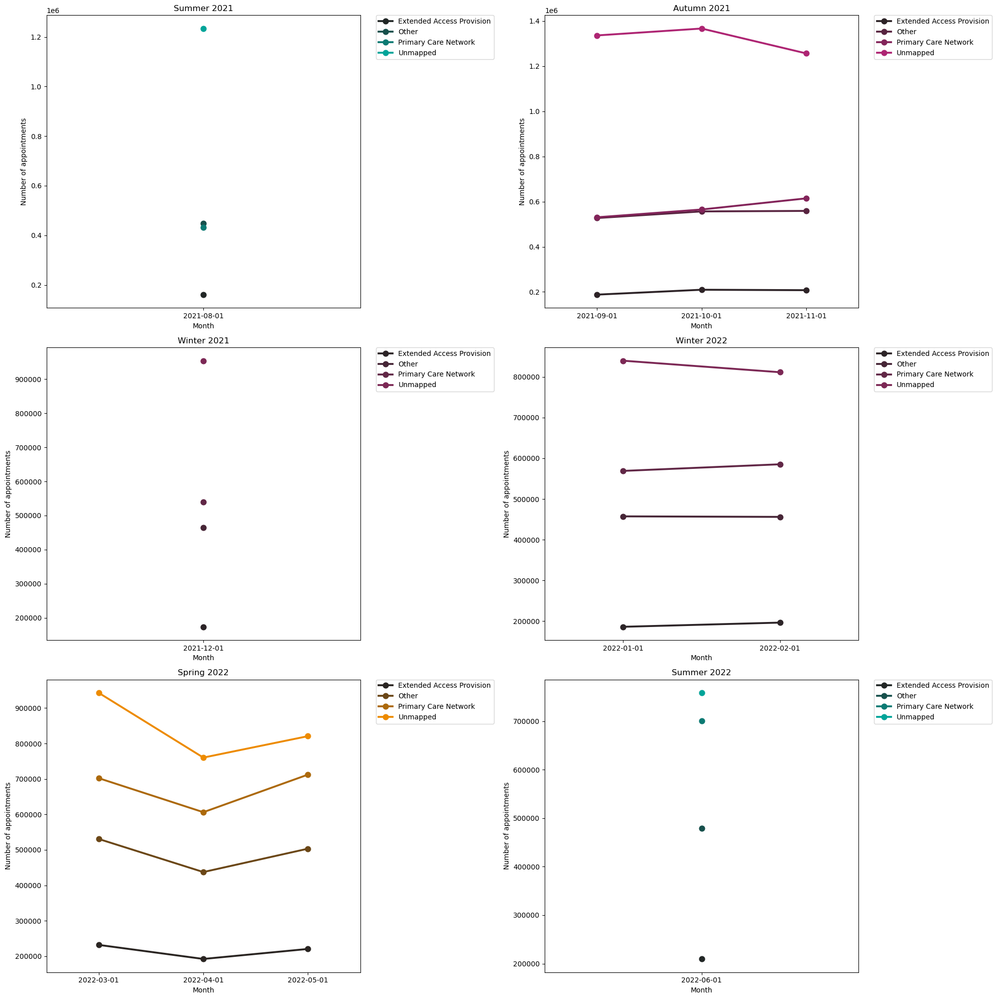

In [347]:
figseason,axes=plt.subplots(nrows = 3,ncols = 2, figsize=(20,20))

hue_order = [
    'Extended Access Provision',
    'Other',
    'Primary Care Network',
    'Unmapped'
]

# Filter and plot on each axis using seaborn
# Plot for Summer 2021
sns.pointplot(data=nc_ss_day_filtered[nc_ss_day_filtered['season_year'] == 'Summer 2021'], 
            x='appointment_month', 
            y='count_of_appointments',
            hue='service_setting', 
            hue_order=hue_order,
            ax=axes[0][0], 
            color='#00A499',
            errorbar = None)
axes[0][0].legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
axes[0][0].set_title("Summer 2021")
axes[0][0].set_xlabel("Month")
axes[0][0].set_ylabel("Number of appointments")


# Plot for Autumn 2021
sns.pointplot(data=nc_ss_day_filtered[nc_ss_day_filtered['season_year'] == 'Autumn 2021'], 
            x='appointment_month', 
            y='count_of_appointments', 
            hue='service_setting',
            hue_order=hue_order,
            ax=axes[0][1], 
            color='#AE2573',
            errorbar=None)
axes[0][1].legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
axes[0][1].set_title("Autumn 2021")
axes[0][1].set_xlabel("Month")
axes[0][1].set_ylabel("Number of appointments")


# Plot for Winter 2021
sns.pointplot(data=nc_ss_day_filtered[nc_ss_day_filtered['season_year'] == 'Winter 2021'],
            x='appointment_month', 
            y='count_of_appointments', 
            hue='service_setting',
            hue_order=hue_order,
            ax=axes[1][0], 
            color='#7C2855',
            errorbar=None)
axes[1][0].legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
axes[1][0].set_title("Winter 2021")
axes[1][0].set_xlabel("Month")
axes[1][0].set_ylabel("Number of appointments")


# Plot for Winter 2022
sns.pointplot(data=nc_ss_day_filtered[nc_ss_day_filtered['season_year'] == 'Winter 2022'],
            x='appointment_month', 
            y='count_of_appointments', 
            hue='service_setting',
            hue_order=hue_order,
            ax=axes[1][1], 
            color='#7C2855',
            errorbar=None)
axes[1][1].legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
axes[1][1].set_title("Winter 2022")
axes[1][1].set_xlabel("Month")
axes[1][1].set_ylabel("Number of appointments")


# Plot for Spring 2022
sns.pointplot(data=nc_ss_day_filtered[nc_ss_day_filtered['season_year'] == 'Spring 2022'], 
            x='appointment_month',
            y='count_of_appointments', 
            hue='service_setting',
            hue_order=hue_order,
            ax=axes[2][0], 
            color='#ED8B00',
            errorbar=None)
axes[2][0].legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
axes[2][0].set_title("Spring 2022")
axes[2][0].set_xlabel("Month")
axes[2][0].set_ylabel("Number of appointments")


# Plot for Summer 2022
sns.pointplot(data=nc_ss_day_filtered[nc_ss_day_filtered['season_year'] == 'Summer 2022'], 
            x='appointment_month',
            y='count_of_appointments', 
            hue='service_setting',
            hue_order=hue_order,
            ax=axes[2][1], 
            color='#00A499',
            errorbar=None)
axes[2][1].legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
axes[2][1].set_title("Summer 2022")
axes[2][1].set_xlabel("Month")
axes[2][1].set_ylabel("Number of appointments")

# To adjust the layout of the charts
plt.tight_layout()
plt.show()

# 9. Crisis Management

## Pandemic effect on the number of appointments
During the start of the pandemic, there was a sudden drop in the number of appointments.

This recovered starting September 2020, where appointments went back to pre-pandemic numbers. 

This has also been confirmed through research: 
https://www.health.org.uk/features-and-opinion/features/how-has-the-covid-19-pandemic-impacted-primary-care

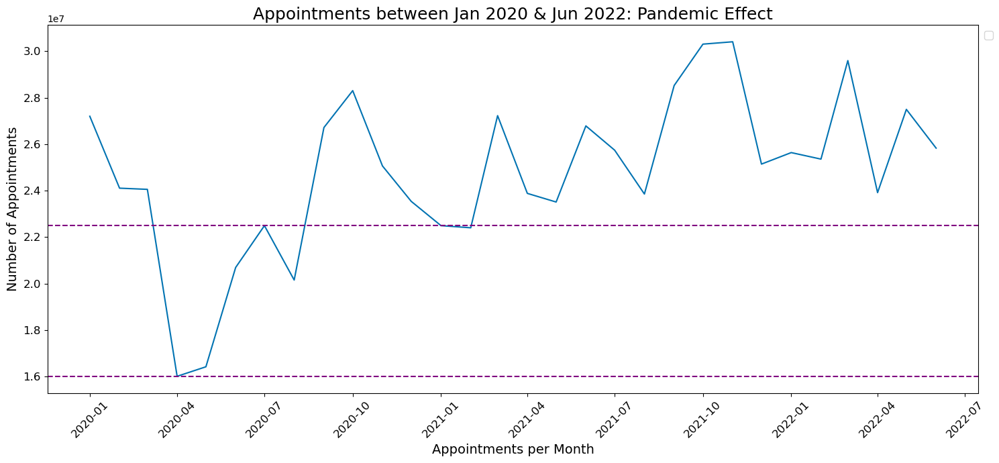

In [350]:
# Setting the size of the plot to suit PPT
plt.figure(figsize=(15,7))

sns.set_palette('colorblind')

# Plot a lineplot showing the number of appointments per date
sns.lineplot(data=ar_monthly_sorted,x='appointment_month',y='count_of_appointments')

# Apply the chart clean function to standardize the chart
chart_clean('Appointments between Jan 2020 & Jun 2022: Pandemic Effect','Appointments per Month','Number of Appointments','')

# Highlighting the sudden drop in appointments during the pandemic
plt.axhline(y=16007881, color = 'purple',linestyle = '--')
plt.axhline(y=22491437, color = 'purple',linestyle = '--')

#Saving the file 
plt.savefig('Pandemic_effect.png', dpi=300, bbox_inches='tight')

# Showing the plot
plt.show()

## Pandemic Effect on top Appointment modes and top hcp types 

**Appointment mode trend during the pandemic months**
To get a full picture of the behaviour, growth and decline of the two top appointment modes, it was important to extend the date range to include 2020 data and by this using the original ar DataFrame.

This section would focus on the top two hcp types together with the top two appointment modes. 
This will help us get additional insights on the relation between the top health care providers and the top appointment modes.  

**GP Chart insights**
- The chart shows a sharp drop in Face-to-Face appointments during the pandemic.
- This was followed by a positive increase in Telephone appointments.
- Both appointment modes overlapped at the start of 2022, but then Face-to-Face took the lead.
- Face-to-Face appointments haven't regained their pre-pandemic levels but they're on a positive slope.

**Other Practice Staff insights**
- Face-to-Face appointments have also suffered drastically during the pandemic, but unlike GP appointments, they seem to be very close to regaining their pre-pandemic levels.
- Telephone appointments seem to maintain a more or less constant level that was also unaffected by the pandemic.

In [353]:
# Filter the ar DataFrame to only show records for Face-To-Face and Telephone
filtered_telface =(
    ar[ar['appointment_mode']
    .isin(['Face-to-Face', 'Telephone']) &
    (ar['hcp_type'] != 'Unknown')
])
#filtered_telface

# Group the filtered DataFrame for Face to Face and phone appointments by month, season and hcp type
telface_group = (
    filtered_telface.groupby(['appointment_month',
                              'season_year',
                              'appointment_mode',
                              'hcp_type'])[['count_of_appointments']]
    .sum())
telface_group = telface_group.reset_index()

<Figure size 1500x700 with 0 Axes>

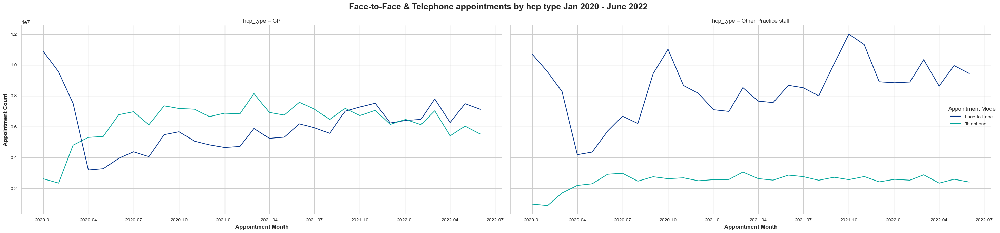

In [354]:
# Set the size of the chart
plt.figure(figsize=(15,7))

# Set a whitegrid style and a colorblind friendly color palette
sns.set_theme(style = 'whitegrid',palette = nhs_colors)

# Create a relplot to show the relation between the appointment modes: Face to Face and telephone in regards to GP 
# and other practice staff appointments
h = sns.relplot( x='appointment_month',y='count_of_appointments',
                hue='appointment_mode',data=telface_group,col='hcp_type',
                kind='line',height=7,aspect =2)

# Change the chart title and the axis labels
h.fig.suptitle("Face-to-Face & Telephone appointments by hcp type Jan 2020 - June 2022", fontsize=18,fontweight='bold')

# Customize font sizes and styles
for ax in h.axes.flat:
    ax.set_xlabel("Appointment Month", fontsize=12, fontweight='bold')
    ax.set_ylabel("Appointment Count", fontsize=12, fontweight='bold')
    ax.tick_params(axis='x', labelsize=10)
    ax.tick_params(axis='y', labelsize=10)

# Legend
h._legend.set_title("Appointment Mode")
for text in h._legend.texts:
    text.set_fontsize(10)


plt.tight_layout()
plt.show()


# 10. External Sources

## Tweets

Analyse tweets from Twitter with hashtags related to healthcare in the UK.
Although the sample data is a good starting point, it has the following limitations: 

-**The date range of the data collection**. 
This is essential in enabling us to specify the trending topics of interest.

-**Language**
The sample only includes English tweets which isn't representative of the NHS patients. 
As one of the main goals of the NHS is to abide by its ethical responsibility to ensure equitable healthcare access, tweets in other languages should be considered. 

source: https://www.gov.uk/guidance/language-interpretation-migrant-health-guide

-**Sentiment Analysis of the tweets with low retweets and likes**
A sentiment analysis of tweets with low engagement would be very informative, it was however excluded due to time constraints and low relevance to the business question. 

In [358]:
# Set figure size.
sns.set(rc={'figure.figsize':(15, 7)})

# Set the plot style as white.
sns.set_style('white')

# Maximum column width to display
pd.options.display.max_colwidth = 200

In [359]:
# Evaluating both the tweet_retweet_count and tweet_favorite_count by value_counts()
retweet = tw['tweet_retweet_count'].value_counts()
print('Retweet value counts:',retweet)

favorite = tw['tweet_favorite_count'].value_counts()
print('Favorite value counts:',favorite)


Retweet value counts: tweet_retweet_count
0      526
1      215
2      114
3       70
5       35
4       27
7       18
12      16
8       15
73      14
9       13
6       12
208     12
35      10
37       6
11       6
10       5
53       5
44       4
150      4
63       4
76       3
85       3
41       3
62       3
207      3
68       3
78       2
23       2
24       2
72       2
16       2
13       1
49       1
48       1
15       1
107      1
14       1
79       1
20       1
39       1
19       1
303      1
57       1
40       1
54       1
169      1
Name: count, dtype: int64
Favorite value counts: tweet_favorite_count
0     1027
1       91
2       16
3       13
4        7
5        5
6        2
17       1
12       1
10       1
8        1
13       1
11       1
7        1
20       1
28       1
14       1
18       1
9        1
42       1
Name: count, dtype: int64


In [360]:
# Checking the languages of the tweets
lang = tw['tweet_lang'].value_counts()
lang

tweet_lang
en    1174
Name: count, dtype: int64

### Topics covered in tweets with more 70 retweets

Looking at the topics / themes covered in the tweets is helpful in guiding us on the users' topics of interest.
Amongst those topics are:
- New apps
- AI and Data in healthcare
- Healthcare's digital transformation
- Partnerships with private healthcare service providers
- Countries' health care assessment

In [362]:
# Filter the tw DataFrame by retweet count >70
retweets70 = tw[tw['tweet_retweet_count']>70]
retweets70 = (
    retweets70[['tweet_full_text',
                'tweet_retweet_count',
                'tweet_favorite_count']]
    .drop_duplicates()
    .sort_values(by='tweet_retweet_count',ascending = False))

retweets70

,tweet_full_text,tweet_retweet_count,tweet_favorite_count
263,RT @UltimaLionsDen: Temitope is looking to boost efficiency in the Health industry with his app- \nWe-Care Africa. \n\nWas his pitch in good s…,303,0
330,"RT @khaleejtimes: .@BurjeelHoldings, a private healthcare services provider, has partnered with superstar @iamsrk as its new brand ambassad…",208,0
27,"RT @khaleejtimes: .@BurjeelHoldings, a private healthcare services provider, has partnered with superstar @iamsrk as its new brand ambassad…",207,0
1130,RT @imedverse: I.V Drug Calculations Cheat Sheet\n\n@Pharma_Connect @imedverse #TipsForNewDocs #MedEd #MedTwitter #medicine #medical #medicar…,169,0
779,RT @Khulood_Almani: 🔟#Applications of #AI in #healthcare \n\nv/@ValueCoders\n \n#digitalhealth #Healthtech #Health #DataScience #Bigdata #Analy…,150,0
790,RT @Khulood_Almani: #Healthcare #DigitalTransformation Starts with This 6⃣Step Process\n\nv/@uptophealth\n#digitalhealth #AI #Python #DataScie…,107,0
65,"RT @SoniaFurstenau: Germany has one of the top ranked #healthcare systems in the world, while Canada’s is teetering. We both dedicate simil…",85,0
577,RT @imedverse: Features of Lung Diseases\n\n#pulmonary #pulmtwitter #pulmonology #pulmonary #respiratory #internalmedicine #TipsForNewDocs #M…,79,0
355,RT @Khulood_Almani: 🪑This #wearable Chair from Could be a Solution to many People’s Back Pain Due to Long Time Standing\n\n#wearable #healthc…,78,0
111,"RT @AWSCloudIndia: How is #data revolutionizing #healthcare? 💊 🚑 🏥 \n\nHear the prognosis from @DubeyPradeepK, Director of @intel's Parallel…",76,0


### Topics covered in tweets with >10 likes
Checking the topics of liked tweets, it was noticed that they are in general more specific than the ones with a higher retweet count. 
They cover:
- Drugs with certain effects
- Tweets about health insurance
- Specific health conditions
- Announcements

In [364]:
# Filter the tw DataFrame by favorite count >10
favorite10 = tw[tw['tweet_favorite_count']>10]
favorite10 = (
    favorite10[['tweet_full_text',
                'tweet_retweet_count',
                'tweet_favorite_count']]
    .drop_duplicates()
    .sort_values(by='tweet_favorite_count',ascending = False))

favorite10

,tweet_full_text,tweet_retweet_count,tweet_favorite_count
1156,Lipid-Lowering Drugs\n\n#TipsForNewDocs #MedEd #MedTwitter #medicine #medical #medicare #health #healthcare #FOAMed #ClinicalPearl #clinicaltips #MedStudents #medstudenttwitter #lipid \n\nCredit: ...,12,42
9,You ready for $JCO @_JennyCo ❤️\n\n#Healthcare data powered by @Conste11ation $DAG 🔥,1,28
442,How health insurance works 😂 \n\n#comedy #adulting #healthcare https://t.co/ciksdeoAkb,5,20
84,"Our nat’l choices re: #healthcare systems aren’t the continuum of public or private, but how much we want of:\n\n- fragmented or seamless\n- does simplicity or complexity well\n- prioritizes savin...",4,18
1122,"Heart Failure, Myocardial Infarction &amp; immediate Treatment\n\n#TipsForNewDocs #MedEd #MedTwitter #medicine #medical #medicare #health #healthcare #FOAMed #ClinicalPearl #clinicaltips #MedStude...",3,17
119,"More data that our 13+ 🇨🇦 #healthcare systems fall short of providing adequate access to care, even for those w/ a family physician.\n\nInstead of siloed solutions and further system fragmentation...",4,14
758,Looking forward to speaking at #ConV2X on Sep 15! Ping me for a speaker discount if interested! Register at https://t.co/v20ebbXmdO \n\n.@BHTYjournal @hedera @acoerco\n#blockchain #DLT #healthcare...,3,13
1098,@CapricornFMNews We have waiting to hear this kind of news now Sa is getting things correct there is absolutely nothing mahala #HealthCare services in SA must be paid by foreign nationals and loca...,0,12
342,September is #WomenInMedicine Month! Thrilled to join @JulieSilverMD #SheLeadsHealthcare @ELAMProgram &amp; @AMWADoctors to #InvestInHer!\n\nI #InvestInHer to diversify the #healthcare #leadersh...,8,11


### Favorite and Retweeted messages

Looking at favorite and retweeted messages is generally a good starting point. 
It gives general direction on the users' topics of interest and content types. 

The data set is, however, limited as it doesn't include other important impressions and engagement metrics such as:
- Impressions
- Link Clicks
- Detail Expands
- Profile Clicks
- Media Engagement
  
Source: https://buffer.com/library/twitter-analytics/



In [366]:
# Create a new DataFrame containing only the tweet's text
tweets_text = tw['tweet_full_text']

# Create an empty list tags
tags=[]

# Loop through the messages, and create a list of values containing the # symbol.
for y in [x.split(' ') for x in tweets_text.values]:
    for z in y:
        if '#' in z:
            # Change to lowercase.
            tags.append(z.lower())

In [367]:
# Assess the tags by calculating a value count
tag_series = pd.Series(tags)


# Display the first 30 records.
tag_series = tag_series.value_counts().head(30)
tag_series

#healthcare                    716
#health                         80
#medicine                       41
#ai                             40
#job                            38
#medical                        35
#strategy                       30
#pharmaceutical                 28
#digitalhealth                  25
#pharma                         25
#marketing                      25
#medtwitter                     24
#biotech                        24
#competitiveintelligence        24
#meded                          23
#vaccine                        18
#hiring                         18
#news                           17
#machinelearning                17
#technology                     17
#coronavirus                    16
#womeninmedicine                16
#covid                          16
#competitivemarketing           16
#wellness                       15
#healthtech                     15
#doctorofveterinarymedicine     14
#science                        14
#medicare           

In [368]:
# Convert the series to a DataFrame in preparation for visualisation.
data = pd.DataFrame(tag_series).reset_index()

# Rename the columns.
data.rename(columns={'index': 'word', 'count': 'count'}, inplace=True)

#Check the count's data type before aggregating 
#data.dtypes


In [369]:
# Display records where the count is larger than 10.
data10 = data[data['count']>10]
data10

,word,count
0,#healthcare,716
1,#health,80
2,#medicine,41
3,#ai,40
4,#job,38
5,#medical,35
6,#strategy,30
7,#pharmaceutical,28
8,#digitalhealth,25
9,#pharma,25


### Analyse the top 30 hashtags from Twitter
- **Healthcare** is the top used hashtag

Bars are highlighted based on the theme of the Kws:

**Health-related kws**
- Highlighting them shows that although they have the highest number they don't necessarily dominate the top 30 kws.
  
**Covid-related kws**
- Covid-related kws are amongst the lowest in the top 30. As we don't have the date of the tweets, this could be an indication that the tweets' sample was in late 2021 - 2022.
  
**Medical/Pharma-related kws**
- Medical/Pharma-related kws dominate the kws in the top 30 in terms of share. 

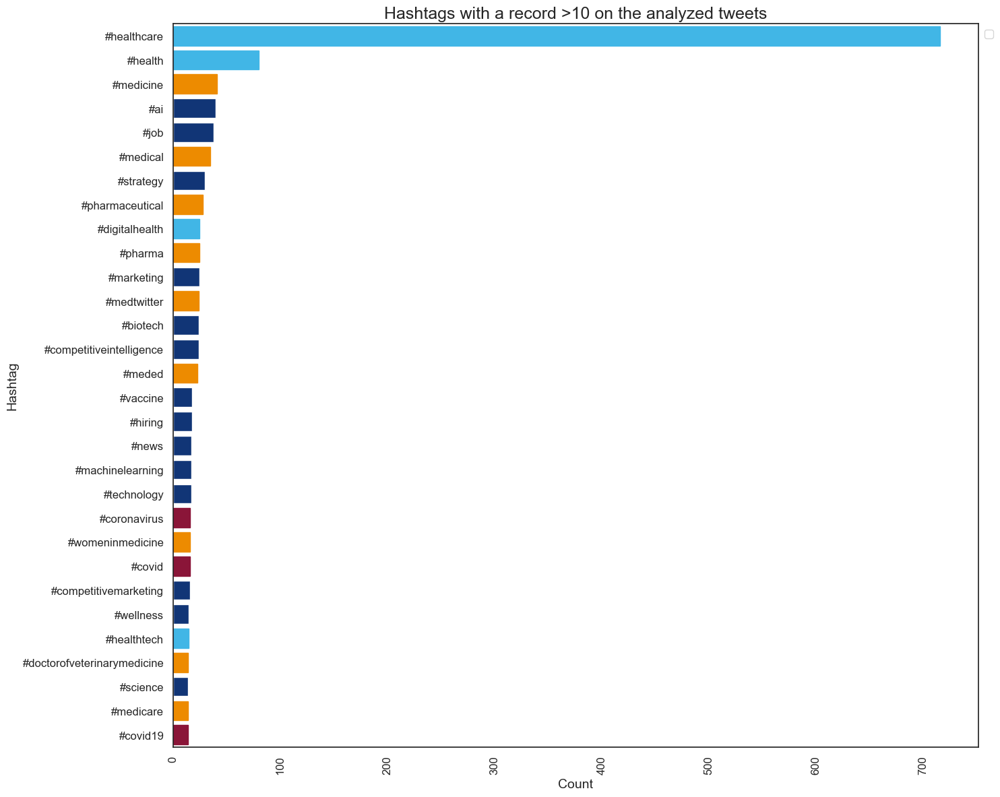

In [371]:
# Create a Seaborn barplot indicating hashtags with a count >10 records.
# Create a barplot
plt.figure(figsize=(15,12))

ax = sns.barplot(data = data10, x= 'count',y='word',color='#003087')

# Apply the user-defined function to standardize all charts
chart_clean('Hashtags with a record >10 on the analyzed tweets',
            'Count',
            'Hashtag',
            '')

# Override the chart clean rotation of the xaxis to better show the x axis labels
plt.xticks(rotation=90)

# To be able to highlight specific bars based on their location
bars = ax.patches

''' Specify the Kws that will be used to highlight bars on the barplot'''

# Health related Kws
# Create a list for the indices of rows containing health-related kws
health_indices = data10[data10['word'].str.contains('health', case=False, na=False)].index.tolist()
# Define a color for health-related Kws bars
health_color = '#41B6E6'
for i in health_indices:
    bars[i].set_color(health_color)

    
# Covid related Kws
# Specify the Kws related to Covid
covid = ['covid', 'corona']
# Create pattern and join them with an or to be able to locate them in the row strings
covid_pattern = '|'.join(covid)
# Find matching row indices
covid_indices = data10[data10['word'].str.contains(covid_pattern, case=False, na=False)].index.tolist()
# Change the color of covid-related KWs
covid_color = '#8A1538'
for i in covid_indices:
    bars[i].set_color(covid_color)


    
# Med and Pharma related Kws
med = ['med', 'pharm']
# Create pattern and join them with an or to be able to locate them in the row strings
med_pattern = '|'.join(med)
# Find matching row indices
med_indices = data10[data10['word'].str.contains(med_pattern, case=False, na=False)].index.tolist()
# Change the color of med-related KWs
med_color = '#ED8B00'
for i in med_indices:
    bars[i].set_color(med_color)


plt.tight_layout()

# Save the generated chart
plt.savefig('Twitter.png',dpi=300,bbox_inches='tight')
plt.show()


### Scarping the NHS weekly post on the tweets of the week including their hashtags

To get a sense of what Hashtags are normally used by the NHS, the following links for two weeks in 2022 were scraped:
- Week of 14 Jan 2022
- Week of 27 May 2022
These are not representative of all NHS hashtags. They are just sample hashtags for comparison's sake. 

In [373]:
# Scraping top NHS tweets for comparison's sake
# Specify the URL
URL = 'https://blog.horizonsnhs.com/post/102hg1l/tweets-of-the-week-14-january-2022'

# Create a variable
PAGE = requests.get(URL)

# View the HTML
soup = BeautifulSoup(PAGE.content,'html.parser')
#print(soup.prettify())

In [374]:
hashtags_jan = []

for tag in soup.find_all('h2'):
    text = tag.get_text()
    if text.startswith('#'):  # simple check for hashtag
        hashtags_jan.append(text)

print('Hashtags promoted on the week of 14 January 2022: ',hashtags_jan)

Hashtags promoted on the week of 14 January 2022:  ['#Caring4NHSPeople', '#VirtualCollaborate', '#SolvingTogether']


In [375]:
# Scraping top NHS tweets for comparison's sake
# Specify the URL
url = 'https://blog.horizonsnhs.com/post/102hp6x/tweets-of-the-week-27th-may-2022'

# Create a variable
page = requests.get(url)

# View the HTML
soup = BeautifulSoup(page.content,'html.parser')
#print(soup.prettify())

In [376]:
hashtags_may = []

for tag in soup.find_all('h2'):
    text = tag.get_text()
    if text.startswith('#'):  # simple check for hashtag
        hashtags_may.append(text)

print('Hashtags promoted on the week of 27 May 2022: ',hashtags_may)

Hashtags promoted on the week of 27 May 2022:  ['#SolvingTogether', '#OurNHSPeople', '#StayandThrive', '#SolvingTogether']


# 11. Population Needs

**Population projections till 2030**
The population projections were deemed necessary to include. This is because it would give a better sense on the growth and age groups of the population. 

This is an exerpt of a large projections project carried out by the Office for National Statistics.

Source:
https://www.ons.gov.uk/peoplepopulationandcommunity/populationandmigration/populationprojections/datasets/2014basednationalpopulationprojectionstableofcontents

In [379]:
# Load the population projections file
population = pd.read_excel('data/project_population.xlsx')
population

,Ages,2022,2023,2024,2025,2026,2027,2028,2029,2030
0,Ages 0 to 14,9896.653000,9870.308000,9827.597000,9770.606000,9694.480000,9607.165000,9525.488000,9459.417000,9395.373000
1,Ages 15 to 29,10467.920000,10802.746000,11036.455000,11235.308000,11396.882000,11492.583000,11534.259000,11556.280000,11590.914000
2,Ages 30 to 44,11537.852000,11835.723000,12057.647000,12221.923000,12368.380000,12520.700000,12637.101000,12754.657000,12829.409000
3,Ages 45 to 59,11199.347000,11134.096000,11098.534000,11084.703000,11070.161000,11045.521000,11030.469000,11019.343000,11055.525000
4,Ages 60 to 74,8864.502000,8952.767000,9093.093000,9258.125000,9430.083000,9607.968000,9766.579000,9919.550000,10057.678000
5,Ages 75 and over,5146.268000,5314.571000,5454.893000,5574.746000,5678.676000,5771.131000,5868.113000,5964.204000,6049.997000
6,All ages,57112.542000,57910.211000,58568.219000,59145.411000,59638.662000,60045.068000,60362.009000,60673.451000,60978.896000
7,Ages 0 to 14 %,17.328336,17.044158,16.779744,16.519635,16.255361,15.999924,15.780601,15.590702,15.407581
8,Ages 15 to 29 %,18.328584,18.654303,18.843761,18.996077,19.109889,19.139928,19.108474,19.046683,19.008075
9,Ages 30 to 44 %,20.201958,20.438059,20.587355,20.664195,20.738862,20.852171,20.935521,21.021809,21.039097


In [380]:
population_actual = population.head(7)
population_actual.set_index('Ages',inplace=True)

population_actual = population_actual.drop('All ages', errors='ignore')
population_actual


,2022,2023,2024,2025,2026,2027,2028,2029,2030
Ages,,,,,,,,,
Ages 0 to 14,9896.653,9870.308,9827.597,9770.606,9694.480,9607.165,9525.488,9459.417,9395.373
Ages 15 to 29,10467.920,10802.746,11036.455,11235.308,11396.882,11492.583,11534.259,11556.280,11590.914
Ages 30 to 44,11537.852,11835.723,12057.647,12221.923,12368.380,12520.700,12637.101,12754.657,12829.409
Ages 45 to 59,11199.347,11134.096,11098.534,11084.703,11070.161,11045.521,11030.469,11019.343,11055.525
Ages 60 to 74,8864.502,8952.767,9093.093,9258.125,9430.083,9607.968,9766.579,9919.550,10057.678
Ages 75 and over,5146.268,5314.571,5454.893,5574.746,5678.676,5771.131,5868.113,5964.204,6049.997


## Population Projections
- The heatmap shows that the age brackets with the highest projections are for the **age bracket between 30-44**
- Age brackets **0 to 14** and **45 to 49** are projected to decrease
- This is an indication that the NHS would be serving and aging and growing population.

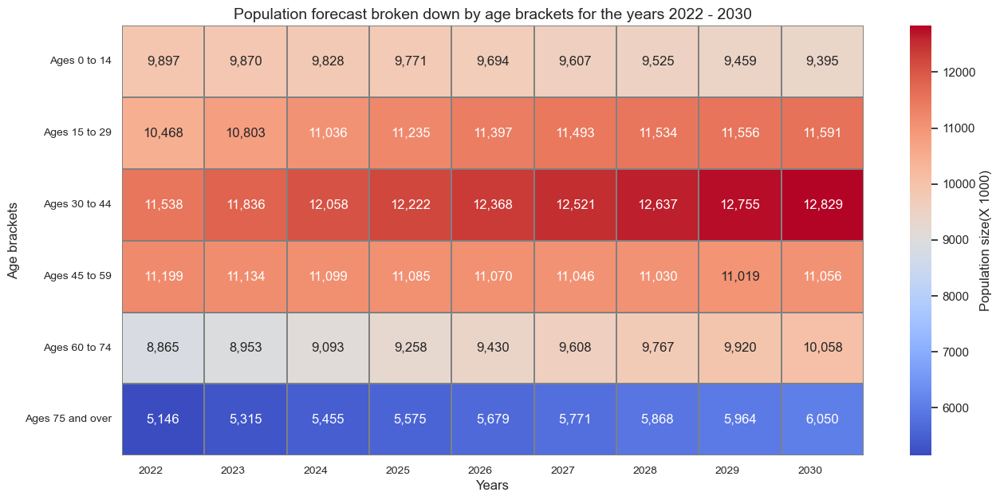

In [382]:
# Set the figure size
plt.figure(figsize=(15, 7))

# Plot a heatmap for the pivoted table
sns.heatmap(
    population_actual,              
    annot=True,  
    fmt=',.0f',
    cmap='coolwarm',               
    linewidths=0.1,              
    linecolor='gray',
    cbar_kws={"label": "Population size(X 1000)"} 
)

# Ajust ticks and labels
plt.xticks(ha='right',fontsize=10)
plt.yticks(fontsize=10)
plt.xlabel('Years', fontsize=12)
plt.ylabel('Age brackets', fontsize=12)
plt.title('Population forecast broken down by age brackets for the years 2022 - 2030', fontsize=14)

# Save the generated chart
plt.savefig('Population_age.png',dpi=300,bbox_inches='tight')
plt.show()

# 12. Staff Needs

Unfortunately the data doesn't cover NHS staff information. External sources and references had to be used to cover the data's limitations. 

## Permanent Staff ratio

- According to the following chart only 75% of the NHS staff are permanentfixed-term staff. 
- That leaves 25% of the NHS remaining position that are covered by temporary staff.

This is to cover for shortfalls in staff for one of the following reasons:
- Vacancy
- Long-term sickness
- Unfilled positions
- Other reasons

Source:
https://www.nuffieldtrust.org.uk/resource/the-nhs-workforce-in-numbers

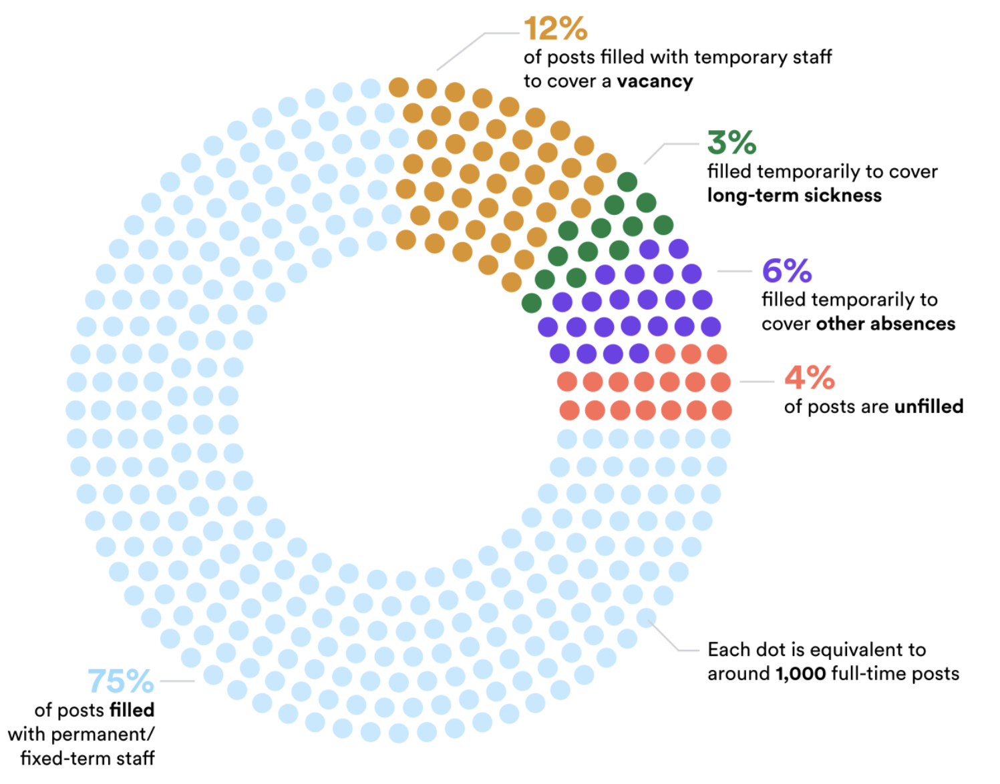

## FTE Staff Numbers by position and age bracket

To get more information on the breakdown of the NHS staff by position, age group between March 2020 - June 2022,
the analysis referred to an external source:

https://digital.nhs.uk/data-and-information/publications/statistical/primary-care-network-workforce/30-june-2022

The following data are excerpts of the published data and it represents the following groups on an FTE (Full time equivalent) basis:
- Directors
- Other Direct Care Staff
- Admin non-clinical Staff

In [390]:
# Load the NHS directors numbers based on FTE (Full Time Equivalent) and age bracket
directors = pd.read_excel('data/directors_fte.xlsx')

# Format all numerical cells as integers
directors[directors.select_dtypes(include='number').columns] = directors.select_dtypes(include='number').astype(int)

# Set the Age brackets column ad index 
directors.set_index(directors.columns[0],inplace=True)

# Drop the all ages row
directors = directors.iloc[1:]

### Directors hired in March and June 2022
- In March and June 2022 More directors were hired compared to other months included in the analysis
- They mostly are 40+ in Age

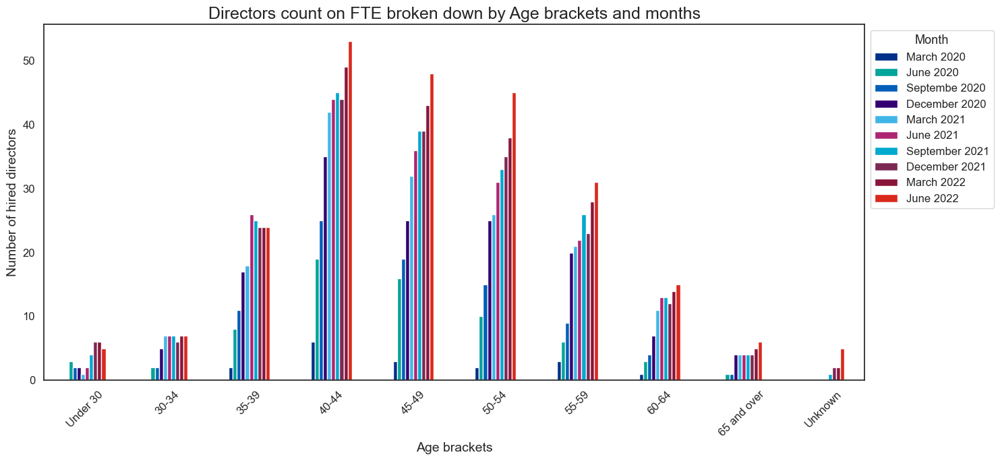

In [392]:
#Plot the data on a bar chart 
ax = directors.plot(kind='bar',figsize = (15,7),color=nhs_colors)

# Apply the user-defined function to standardize all charts
chart_clean(title="Directors count on FTE broken down by Age brackets and months",
            xlabel='Age brackets',
            ylabel='Number of hired directors',
            legend='Month')

# Save the generated chart
plt.savefig('FTE_directors.png',dpi=300,bbox_inches='tight')
plt.show()

### Other direct care staff
- The chart shows an increase in other direct care staff across all age brackets.
- The hiring for other direct care staff shows a steady growth across months and age groups.
- The hires categorized under Unknown suggest an issue in the data collection quality.

In [394]:
# Load the NHS Other direct care staff numbers based on FTE (Full Time Equivalent) and age bracket
direct_care = pd.read_excel('data/direct_patientcare_fte.xlsx')

# Format all numerical cells as integers
direct_care[direct_care.select_dtypes(include='number').columns] = direct_care.select_dtypes(include='number').astype(int)

# Set the Age brackets column ad index 
direct_care.set_index(direct_care.columns[0],inplace=True)

# Drop the all ages row
direct_care = direct_care.iloc[1:]
direct_care


,March 2020,June 2020,September 2020,December 2020,March 2021,June 2021,September 2021,December 2021,March 2022,June 2022
All other Director Patient Care staff,,,,,,,,,,
Under 30,60,241,406,714,1158,1460,1600,1766,1956,2200
30-34,50,205,349,602,942,1148,1265,1429,1625,1817
35-39,52,183,277,412,582,782,866,1024,1205,1352
40-44,25,136,203,374,570,750,802,944,1055,1244
45-49,27,103,176,289,433,520,588,692,793,886
50-54,20,88,146,235,368,487,533,610,697,835
55-59,9,59,83,150,236,302,331,399,461,539
60-64,5,11,25,50,74,98,117,145,177,223
65 and over,1,5,7,12,15,26,30,35,36,40


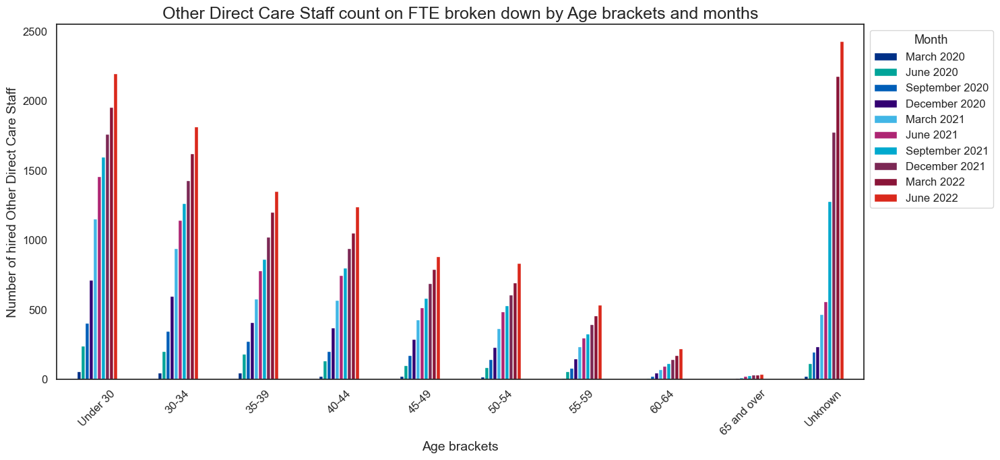

In [395]:
#Plot the data on a bar chart 
ax = direct_care.plot(kind='bar',figsize = (15,7), color=nhs_colors)

# Apply the user-defined function to standardize all charts
chart_clean(title="Other Direct Care Staff count on FTE broken down by Age brackets and months",
            xlabel='Age brackets',
            ylabel='Number of hired Other Direct Care Staff',
            legend='Month')

# Save the generated chart
plt.savefig('FTE_Othe Direct Care.png',dpi=300,bbox_inches='tight')
plt.show()


### Admin Non-Clinical Staff
The chart shows an increase in Admin non-clinical staff across all age brackets.
The hiring for Admin non-clinical staff shows a steady growth across months and age groups.


In [397]:
# Load the NHS admin non-clinical staff numbers based on FTE (Full Time Equivalent) and age bracket
admin_nonclinical = pd.read_excel('data/admin_nonclinical.xlsx')

# Format all numerical cells as integers
admin_nonclinical[admin_nonclinical.select_dtypes(include='number').columns] = admin_nonclinical.select_dtypes(include='number').astype(int)

# Set the Age brackets column ad index 
admin_nonclinical.set_index(admin_nonclinical.columns[0],inplace=True)

# Drop the all ages row
admin_nonclinical = admin_nonclinical.iloc[1:]
admin_nonclinical


,March 2020,June 2020,September 2020,December 2020,March 2021,June 2021,September 20217,December 2021,March 2022,June 2022
Admin Non Clinical Staff,,,,,,,,,,
Under 30,5,27,62,97,122,160,166,179,187,206
30-34,8,14,22,41,49,68,91,101,123,128
35-39,6,13,24,49,64,79,85,97,112,130
40-44,4,18,33,46,64,74,88,97,110,120
45-49,7,17,25,50,67,74,83,89,97,104
50-54,5,20,37,56,77,102,111,121,134,148
55-59,2,13,24,38,57,76,88,100,119,135
60-64,1,10,14,25,40,50,53,51,52,64
65 and over,0,2,4,6,9,13,13,13,15,16


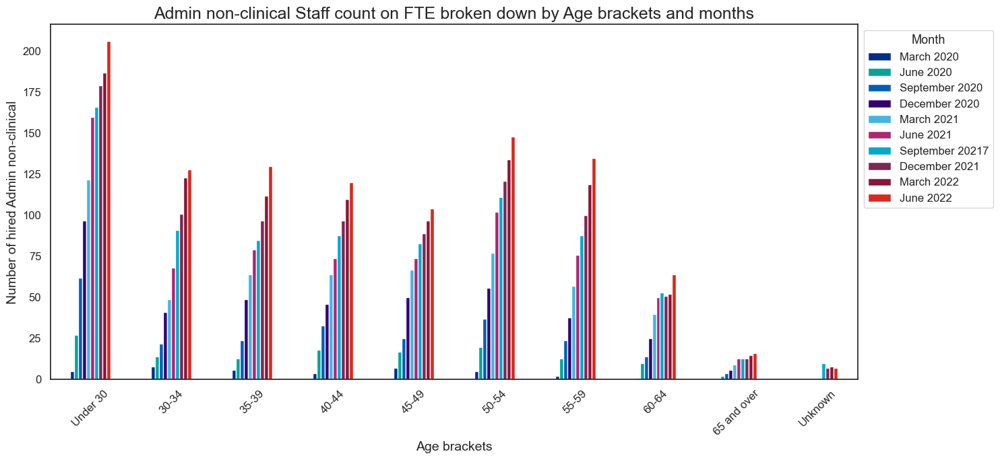

In [398]:
#Plot the data on a bar chart 
ax = admin_nonclinical.plot(kind='bar',figsize = (15,7),color = nhs_colors)

# Apply the user-defined function to standardize all charts
chart_clean(title="Admin non-clinical Staff count on FTE broken down by Age brackets and months",
            xlabel='Age brackets',
            ylabel='Number of hired Admin non-clinical',
            legend='Month')

# Save the generated chart
plt.savefig('FTE_Admin.png',dpi=300,bbox_inches='tight')
plt.show()

# 13. NHS Recommendations

## Appointment Utilization

To get an estimate of the current utilization of the network a utilization calculation was included. 
- The logic behind it is to divide the number of monthly appointments by 30 to get a daily utilization. 
- To get the monthly utilization, the actual number of days in a month was used. 
- The daily and monthly utilization can then be compared to the estimate provided of 1200000 daily appointments, to see where the network currently stands.

**Insight**
Currently, the network is within the limit of permissible utilization as shown on the following graphs. 

In [402]:
# Create an aggregated data set to review the different features.
ar_agg_str = filtered_ar_nc.groupby(['appointment_month_str','appointment_month','hcp_type','appointment_status',
                                     'appointment_mode','time_between_book_and_appointment'])[['count_of_appointments']].\
                                     sum().sort_values(by='appointment_month',ascending=True).reset_index()
# View the DataFrame.
ar_agg_str

,appointment_month_str,appointment_month,hcp_type,appointment_status,appointment_mode,time_between_book_and_appointment,count_of_appointments
0,August 2021,2021-08-01,Unknown,Unknown,Video/Online,1 Day,1
1,August 2021,2021-08-01,GP,Unknown,Unknown,Same Day,2018
2,August 2021,2021-08-01,GP,Unknown,Unknown,Unknown / Data Quality,3
3,August 2021,2021-08-01,GP,Unknown,Video/Online,1 Day,171
4,August 2021,2021-08-01,GP,Unknown,Video/Online,15 to 21 Days,87
...,...,...,...,...,...,...,...
3749,June 2022,2022-06-01,GP,Unknown,Video/Online,1 Day,123
3750,June 2022,2022-06-01,GP,Unknown,Unknown,Unknown / Data Quality,2
3751,June 2022,2022-06-01,GP,Unknown,Unknown,Same Day,1572
3752,June 2022,2022-06-01,GP,Unknown,Video/Online,Same Day,499


In [403]:
# Determine the total number of appointments per month.
ar_df = filtered_ar_nc.groupby(['appointment_month','appointment_month_str'])[['count_of_appointments']].\
                                sum().sort_values(by='appointment_month',ascending = True).reset_index()

# Monthly aggregate / 30 to get to a daily value.
ar_df['utilisation'] = ar_df['count_of_appointments']/30

# Show the full number 
pd.set_option('display.float_format', '{:.1f}'.format)

# View the DataFrame.
ar_df

,appointment_month,appointment_month_str,count_of_appointments,utilisation
0,2021-08-01,August 2021,23852171,795072.4
1,2021-09-01,September 2021,28522501,950750.0
2,2021-10-01,October 2021,30303834,1010127.8
3,2021-11-01,November 2021,30405070,1013502.3
4,2021-12-01,December 2021,25140776,838025.9
5,2022-01-01,January 2022,25635474,854515.8
6,2022-02-01,February 2022,25355260,845175.3
7,2022-03-01,March 2022,29595038,986501.3
8,2022-04-01,April 2022,23913060,797102.0
9,2022-05-01,May 2022,27495508,916516.9


In [404]:
# Add a column comparing the current utilisation to the average utilisation defined by the NHS
NHS_avg = 1200000
ar_df['percent_utilisation'] = round(ar_df['utilisation']/NHS_avg*100,1)
ar_df

,appointment_month,appointment_month_str,count_of_appointments,utilisation,percent_utilisation
0,2021-08-01,August 2021,23852171,795072.4,66.3
1,2021-09-01,September 2021,28522501,950750.0,79.2
2,2021-10-01,October 2021,30303834,1010127.8,84.2
3,2021-11-01,November 2021,30405070,1013502.3,84.5
4,2021-12-01,December 2021,25140776,838025.9,69.8
5,2022-01-01,January 2022,25635474,854515.8,71.2
6,2022-02-01,February 2022,25355260,845175.3,70.4
7,2022-03-01,March 2022,29595038,986501.3,82.2
8,2022-04-01,April 2022,23913060,797102.0,66.4
9,2022-05-01,May 2022,27495508,916516.9,76.4


In [405]:
# To calculate the monthly capacity utilisation we will first collect the number of days per month
ar_df['days_in_month'] = ar_df['appointment_month'].dt.days_in_month

# Calculate the monthly utilisation 
ar_df['monthly_util'] = ar_df['utilisation'] * ar_df['days_in_month']

#Calculate the monthly max using the NHS average number
ar_df['max_util'] = ar_df['days_in_month']*1200000
ar_df


,appointment_month,appointment_month_str,count_of_appointments,utilisation,percent_utilisation,days_in_month,monthly_util,max_util
0,2021-08-01,August 2021,23852171,795072.4,66.3,31,24647243.4,37200000
1,2021-09-01,September 2021,28522501,950750.0,79.2,30,28522501.0,36000000
2,2021-10-01,October 2021,30303834,1010127.8,84.2,31,31313961.8,37200000
3,2021-11-01,November 2021,30405070,1013502.3,84.5,30,30405070.0,36000000
4,2021-12-01,December 2021,25140776,838025.9,69.8,31,25978801.9,37200000
5,2022-01-01,January 2022,25635474,854515.8,71.2,31,26489989.8,37200000
6,2022-02-01,February 2022,25355260,845175.3,70.4,28,23664909.3,33600000
7,2022-03-01,March 2022,29595038,986501.3,82.2,31,30581539.3,37200000
8,2022-04-01,April 2022,23913060,797102.0,66.4,30,23913060.0,36000000
9,2022-05-01,May 2022,27495508,916516.9,76.4,31,28412024.9,37200000


<Figure size 1500x700 with 0 Axes>

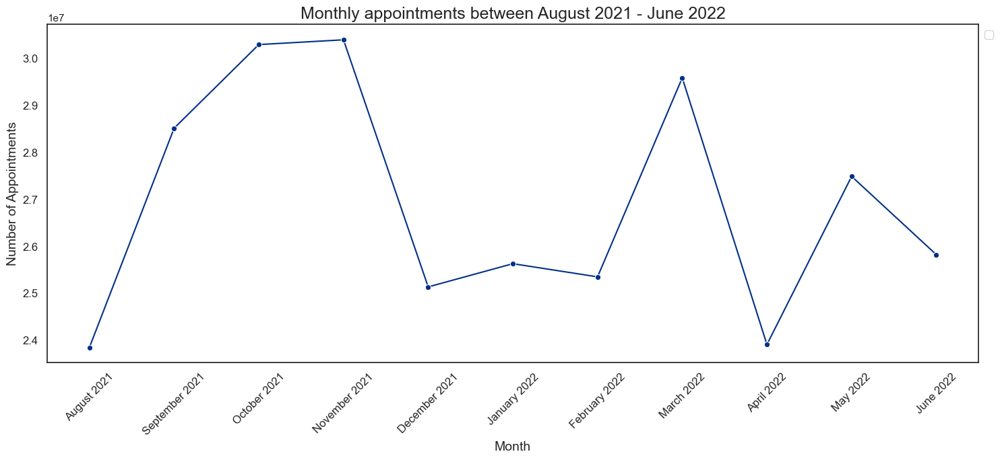

In [406]:
# Plot the monthly number of appointments between August 2021 - June 2022
# Create a lineplot.
plt.figure(figsize=(15,7))
fig,ax = plt.subplots()

sns.lineplot(data = ar_df, x= 'appointment_month_str',y='count_of_appointments', marker = 'o',ax=ax,color = '#003087')
#sns.lineplot(data = ar_df, x= 'appointment_month_str',y='monthly_util', marker = 'x', color = 'orange',linestyle = '--')
#sns.lineplot(data = ar_df, x= 'appointment_month_str',y='max_util', marker = '', color = 'red',linestyle = ':')
# Apply the user-defined function to standardize all charts
chart_clean('Monthly appointments between August 2021 - June 2022',
            'Month',
            'Number of Appointments',
            '')

# Save the generated chart
#plt.savefig('breakdown_book.png',dpi=300,bbox_inches='tight')
plt.show()


<Figure size 1500x700 with 0 Axes>

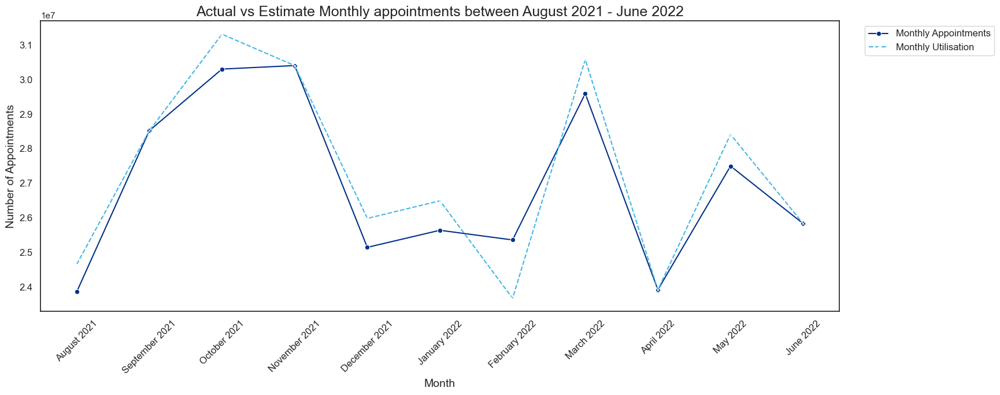

In [407]:
# Plot the monthly number of appointments between August 2021 - June 2022
# Create a lineplot.
plt.figure(figsize=(15,7))
fig,ax = plt.subplots()

plot1 = sns.lineplot(data = ar_df, x= 'appointment_month_str',y='count_of_appointments', marker = 'o',ax=ax,color='#003087')
plot2 = sns.lineplot(data = ar_df, x= 'appointment_month_str',y='monthly_util', marker = 'x', color = '#41B6E6',linestyle = '--',ax=ax)
#sns.lineplot(data = ar_df, x= 'appointment_month_str',y='max_util', marker = '', color = 'red',linestyle = ':')
# Apply the user-defined function to standardize all charts
chart_clean('Actual vs Estimate Monthly appointments between August 2021 - June 2022',
            'Month',
            'Number of Appointments',
            '')

# Add legend
ax.legend(
    handles = [plot1.lines[0],plot2.lines[1]],
    labels=['Monthly Appointments', 'Monthly Utilisation'],
    loc='upper right', 
    bbox_to_anchor=(1.2, 1),
    fontsize='medium'
)

plt.show()



<Figure size 1500x700 with 0 Axes>

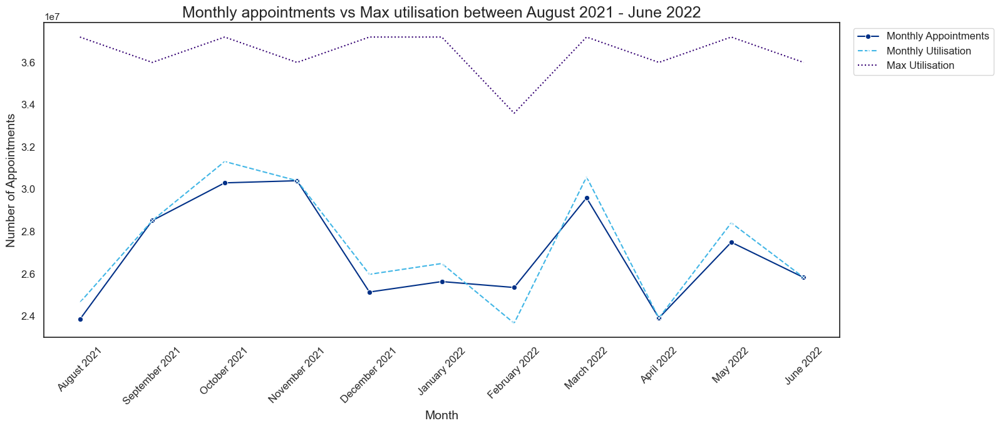

In [408]:
# Plot the monthly number of appointments between August 2021 - June 2022
# Create a lineplot.
plt.figure(figsize=(15,7))
fig,ax = plt.subplots()

plot1 = sns.lineplot(data = ar_df, x= 'appointment_month_str',y='count_of_appointments', marker = 'o',ax=ax,color='#003087')
plot2 = sns.lineplot(data = ar_df, x= 'appointment_month_str',y='monthly_util', marker = 'x', color = '#41B6E6',linestyle = '--',ax=ax)
plot3 = sns.lineplot(data = ar_df, x= 'appointment_month_str',y='max_util', marker = '', color = '#330072',linestyle = ':',ax=ax)



# Apply the user-defined function to standardize all charts
chart_clean('Monthly appointments vs Max utilisation between August 2021 - June 2022',
            'Month',
            'Number of Appointments',
            'Appointments')

# Add legend
ax.legend(
    handles = [plot1.lines[0],plot2.lines[1],plot3.lines[2]],
    labels=['Monthly Appointments', 'Monthly Utilisation', 'Max Utilisation'],
    loc='upper right', 
    bbox_to_anchor=(1.2, 1),
    fontsize='medium'
)

# Save the generated chart
plt.savefig('monthly_maxutilization.png',dpi=300,bbox_inches='tight')
plt.show()


### Identifying outliers in the count of appointments between August 2021 and June 2022

<Axes: >

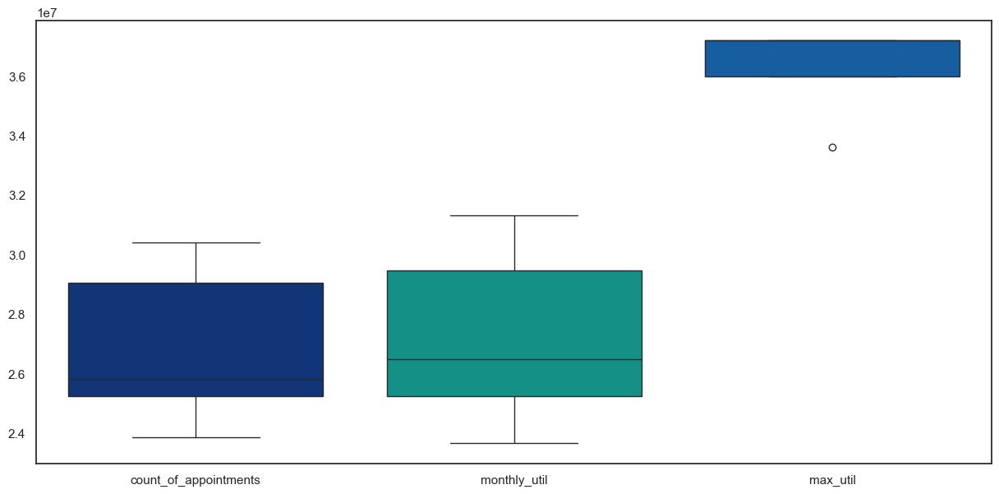

In [410]:
# Define plot size
plt.figure(figsize=(15,7))

# Filter the ar_df DataFrame to only include the columns for count_of_appointments, monthly util, max util
box_plot_ar_df = ar_df[['count_of_appointments','monthly_util','max_util']]

# Box plot of the count of appointments to identify outliers
sns.boxplot(box_plot_ar_df,palette=nhs_colors)

In [411]:
from sklearn.metrics import r2_score, median_absolute_error, mean_absolute_error
from sklearn.metrics import median_absolute_error, mean_squared_error, mean_squared_log_error

In [412]:
# This is a function to calculate and plot the simple moving average: 
def plot_moving_average(series, window, plot_intervals=False, scale=1.96):

    rolling_mean = series.rolling(window=window).mean()
    # Set the color palette
    sns.set_palette(nhs_colors)

    plt.figure(figsize=(15,7))
    plt.title("Moving average\n window size = {}".format(window))
    plt.plot(rolling_mean, 'g', label="Simple moving average trend")
    
    # Plot confidence intervals for smoothed values.
    if plot_intervals:
        mae = mean_absolute_error(series[window:], rolling_mean[window:])
        deviation = np.std(series[window:] - rolling_mean[window:])
        lower_bound = rolling_mean - (mae + scale * deviation)
        upper_bound = rolling_mean + (mae + scale * deviation)
        plt.plot(upper_bound, 'r--', label="Upper bound / Lower bound")
        plt.plot(lower_bound, 'r--')
            
    plt.plot(series[window:], label="Actual values")
    plt.legend(loc='best')
    plt.grid(False)

In [413]:
# Set the appointment_month column as an index to show on the moving average chart
ar_df = ar_df.set_index('appointment_month_str')

### Moving average trend line of utilization
- Plotting the moving average helps give the general trend of the actual count of appointments. 
- For instance, the sudden peak in March 2022 is smoothed out by the moving average trend line, suggesting it was a one-time occurence and is not likely to repeat in the coming months. 

<Figure size 1500x700 with 0 Axes>

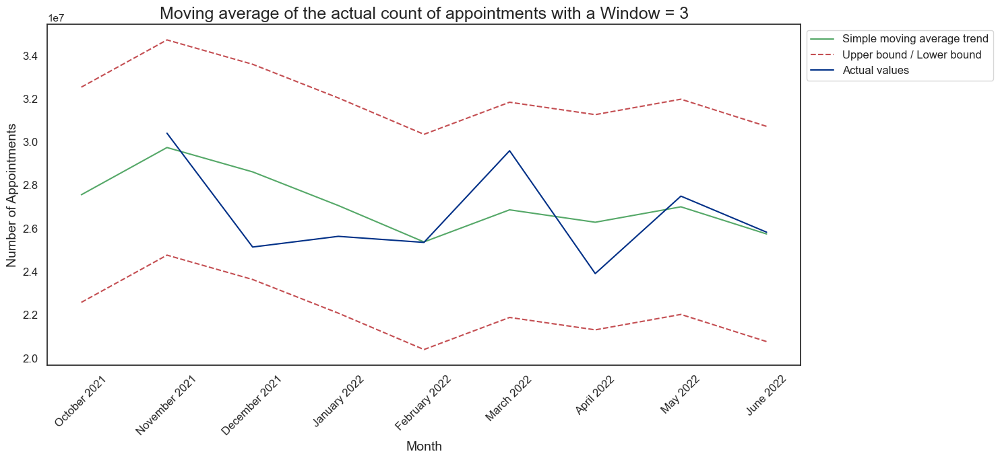

In [415]:
# Define plot size
plt.figure(figsize=(15,7))


# Plot the moving average chart using the user-defined function
plot_moving_average(ar_df.count_of_appointments, 3, plot_intervals=True)

# Apply the user-defined function to standardize all charts
chart_clean('Moving average of the actual count of appointments with a Window = 3',
            'Month',
            'Number of Appointments',
            '')

# Save the generated chart
plt.savefig('MA_appointment_count.png',dpi=300,bbox_inches='tight')

plt.show()

## Patient Contact During Care Home Rounds

As part of the low tier national categories, the trend for the patient contact during care home rounds didn't conform with the other lines under the low-tier national categories. 

That's why it's further investigated in this section, to determine if there's an interesting pattern.  

- The moving average plot shows a positive slope which indicates that this national category is likely to have more appointments in the coming months. 

In [418]:
nc_low_tier_care = nc_low_tier[nc_low_tier['national_category'] == 'Patient contact during Care Home Round']
nc_low_tier_care

,appointment_month,appointment_month_str,national_category,count_of_appointments
8,2021-08-01,August 2021,Patient contact during Care Home Round,31316
26,2021-09-01,September 2021,Patient contact during Care Home Round,34966
43,2021-10-01,October 2021,Patient contact during Care Home Round,40064
61,2021-11-01,November 2021,Patient contact during Care Home Round,62619
72,2021-12-01,December 2021,Patient contact during Care Home Round,70047
98,2022-01-01,January 2022,Patient contact during Care Home Round,74860
116,2022-02-01,February 2022,Patient contact during Care Home Round,77638
134,2022-03-01,March 2022,Patient contact during Care Home Round,98338
152,2022-04-01,April 2022,Patient contact during Care Home Round,87757
169,2022-05-01,May 2022,Patient contact during Care Home Round,113703


<Figure size 1500x700 with 0 Axes>

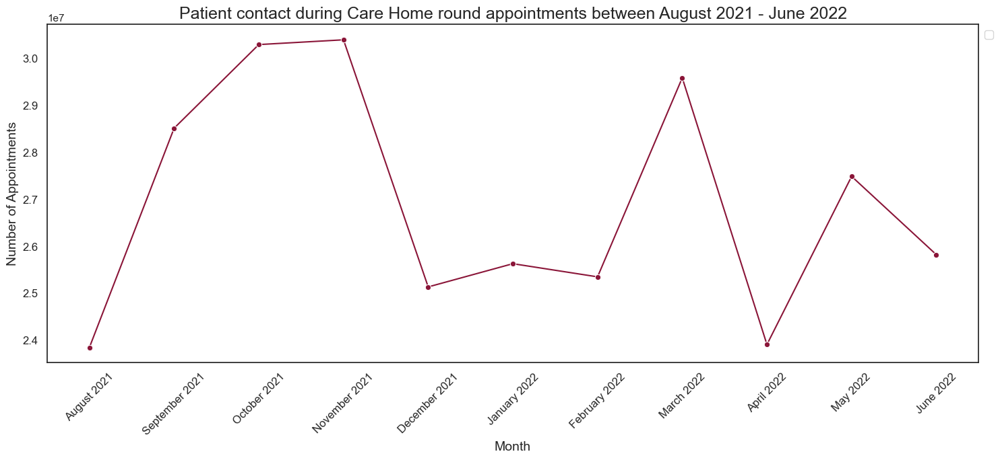

In [419]:
# Plot the monthly number of appointments for Patient contact during Care Home Round between August 2021 - June 2022
# Create a lineplot.
plt.figure(figsize=(15,7))
fig,ax = plt.subplots()

sns.lineplot(data = ar_df, x= 'appointment_month_str',y='count_of_appointments', marker = 'o',ax=ax,color = '#8A1538')
#sns.lineplot(data = ar_df, x= 'appointment_month_str',y='monthly_util', marker = 'x', color = 'orange',linestyle = '--')
#sns.lineplot(data = ar_df, x= 'appointment_month_str',y='max_util', marker = '', color = 'red',linestyle = ':')
# Apply the user-defined function to standardize all charts
chart_clean('Patient contact during Care Home round appointments between August 2021 - June 2022',
            'Month',
            'Number of Appointments',
            '')

# Save the generated chart
#plt.savefig('breakdown_book.png',dpi=300,bbox_inches='tight')
plt.show()



In [420]:
def pivot_boxplot_noregion(df,column):
    ''' 
    The aim of this function is to pivot the DataFrame by appointment month. 
    The pivoting will only be for one column to be able by the count of appointments.
    '''
    df_pivot = df.pivot_table(index = ['appointment_month_str'],
                              columns =[column],
                              values = ['count_of_appointments'],
                              aggfunc ='sum').reset_index()
    
    # Flatten MultiIndex columns
    df_pivot.columns = [
        col if isinstance(col, str) else
        col[1] if col[0] == 'count_of_appointments' else
        '_'.join([str(c) for c in col if c])
        for col in df_pivot.columns.values
    ]
    
    # Set the figure size
    plt.figure(figsize=(15,7))

    # Define the color palette of the boxplot
    nhs_colors = [
    '#003087',  # NHS Dark Blue
    '#005EB8',  # NHS Blue
    '#41B6E6',  # NHS Light Blue
    '#00A9CE',  # NHS Aqua Blue
    '#00A499',  # NHS Aqua Green
    '#330072',  # NHS Purple
    '#7C2855',  # NHS Dark Pink
    '#AE2573',  # NHS Pink
    '#8A1538',  # NHS Dark Red
    '#DA291C',  # NHS Red
    '#ED8B00'   # NHS Orange
    ]
    
    # Plot the boxplot
    sns.boxplot(df_pivot,palette=nhs_colors)
    return df_pivot

### Box plot findings
- The boxplot for the patient contact during care home rounds didn't include any outliers. 
- The moving average can then proceed without additional steps. 

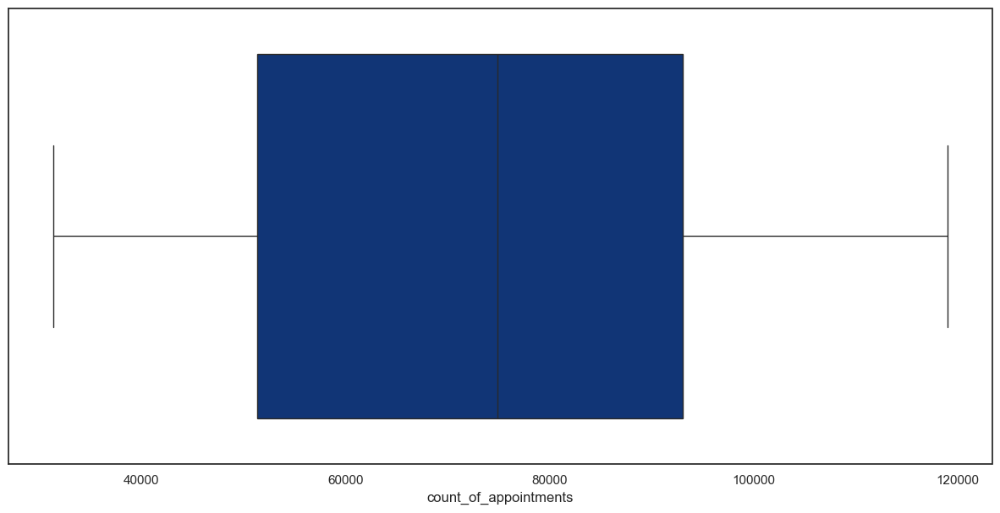

In [422]:
# Boxplot of the filtered nc_low_tier to only include patient care during care home round
ax = sns.boxplot(x=nc_low_tier_care['count_of_appointments'], whis=1.5)

In [423]:
# Set the appointment_month column as an index to show on the moving average chart
nc_low_tier_care = nc_low_tier_care.set_index('appointment_month_str')

### Moving average of patient care during care home round appointments
- Plotting the moving average confirms that there's an expectation for patient contact during care home rounds to increase.
- This is also consistant with the steady increase in the ageing population. 

<Figure size 1500x700 with 0 Axes>

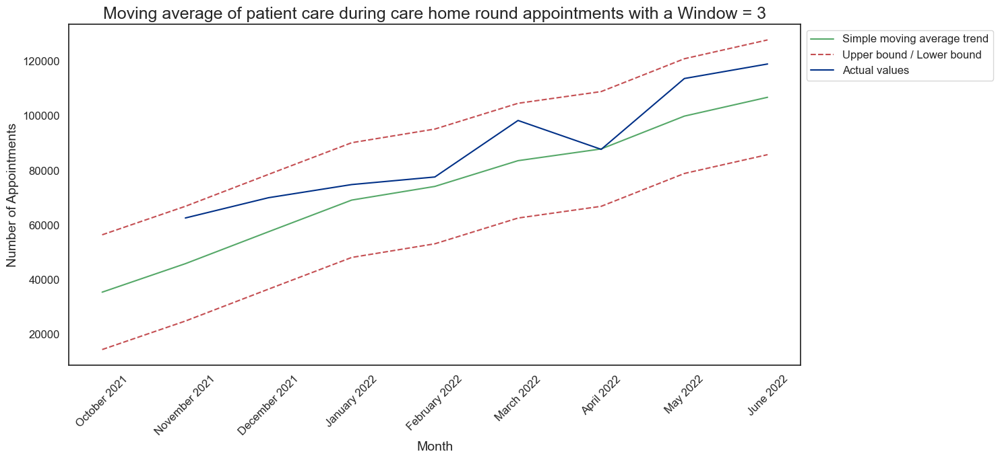

In [425]:
# Define plot size
plt.figure(figsize=(15,7))


# Plot the moving average chart using the user-defined function
plot_moving_average(nc_low_tier_care.count_of_appointments, 3, plot_intervals=True)

# Apply the user-defined function to standardize all charts
chart_clean('Moving average of patient care during care home round appointments with a Window = 3',
            'Month',
            'Number of Appointments',
            '')

# Save the generated chart
plt.savefig('Patient_carehome.png',dpi=300,bbox_inches='tight')
plt.show()


## DNA Appointments

- Looking at the moving average plot, DNA shows a level stabilization especially starting 2022, after their all time high in November 2021. 
- By furhter application of appointment reminder techniques, DNA appointments should show further decreases in coming periods. 

In [428]:
# Filter out the ar_attended DataFram to only include DNA appointments
ar_DNA = ar_attended[ar_attended['appointment_status']=='DNA']

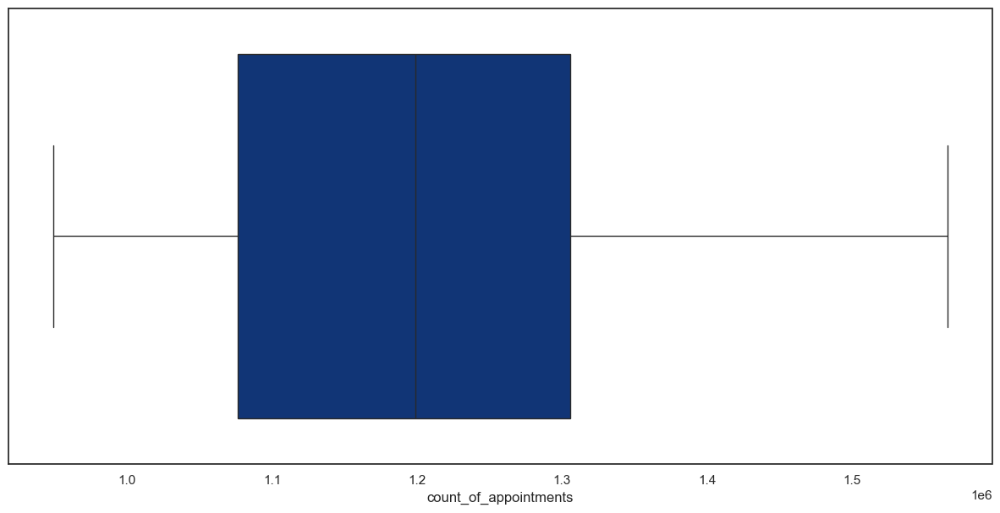

In [429]:
ax = sns.boxplot(x=ar_DNA['count_of_appointments'], whis=1.5)

In [430]:
# Set the appointment_month column as an index to show on the moving average chart
ar_DNA = ar_DNA.set_index('appointment_month_str')

In [431]:
ar_DNA

,appointment_month,appointment_status,count_of_appointments
appointment_month_str,,,
August 2021,2021-08-01,DNA,949137
September 2021,2021-09-01,DNA,1321348
October 2021,2021-10-01,DNA,1565624
November 2021,2021-11-01,DNA,1428087
December 2021,2021-12-01,DNA,1198866
January 2022,2022-01-01,DNA,1076013
February 2022,2022-02-01,DNA,1076658
March 2022,2022-03-01,DNA,1289888
April 2022,2022-04-01,DNA,1045455


<Figure size 1500x700 with 0 Axes>

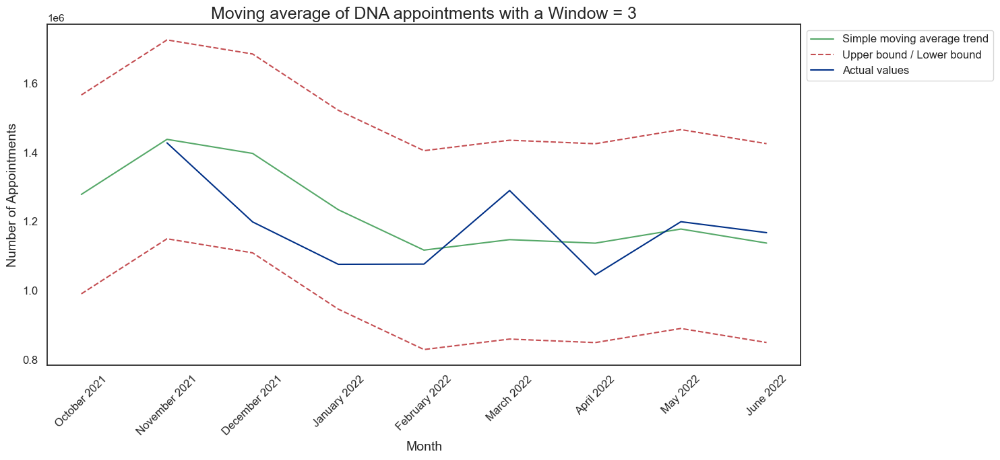

In [432]:
# Define plot size
plt.figure(figsize=(15,7))


# Plot the moving average chart using the user-defined function
plot_moving_average(ar_DNA.count_of_appointments, 3, plot_intervals=True)

# Apply the user-defined function to standardize all charts
chart_clean('Moving average of DNA appointments with a Window = 3',
            'Month',
            'Number of Appointments',
            '')


# Save the generated chart
plt.savefig('DNA.png',dpi=300,bbox_inches='tight')
plt.show()


## Time between booking and consultation

Boxplots for all DataFrames were checked to make sure there were not outliers.

The avgtime DataFrame was subset in all the different waiting times to be able to applyt the moving average method. 

- It was found that appointments with a short waiting time and this includes same day, next day, average wait of 4.5 and 11 days although they currently have the highest share of appointments, have a negative slope. This indicates that these appointments are likely to get fewer appointments in the coming months.

- For appointments with a longer waiting time, the curves show a positive slope which indicates that these appointments are likely to get more appointments in the coming months.

- This finding suggests longer waiting time in the comings months. 

In [435]:
# Set the appointment_month column as an index to show on the moving average chart
avgtime = avgtime.set_index('appointment_month_str')
avgtime

,appointment_month,avg_time_between_book_appointment,count_of_appointments
appointment_month_str,,,
August 2021,2021-08-01,28.0,673225
August 2021,2021-08-01,25.0,828866
August 2021,2021-08-01,18.0,1453209
August 2021,2021-08-01,11.0,2889150
August 2021,2021-08-01,4.5,4924960
...,...,...,...
June 2022,2022-06-01,18.0,1914740
June 2022,2022-06-01,25.0,1217197
June 2022,2022-06-01,28.0,1067420


In [436]:
# Data set for same day appointments
df_0 = avgtime[avgtime['avg_time_between_book_appointment']==0.0]
print(df_0.shape)


# Data set for next day appointments
df_1 = avgtime[avgtime['avg_time_between_book_appointment']==1.0]
#print(df_1.shape)


# Data set for appointments with an average wait time of 4.5 days
df_4 = avgtime[avgtime['avg_time_between_book_appointment']==4.5]
#print(df_4.shape)


# Data set for appointments with an average wait time of 11 days
df_11 = avgtime[avgtime['avg_time_between_book_appointment']==11.0]
#print(df_11.shape)


# Data set for appointments with an average wait time of 18 days
df_18 = avgtime[avgtime['avg_time_between_book_appointment']==18.0]
#print(df_18.shape)


# Data set for appointments with an average wait time of 25 days
df_25= avgtime[avgtime['avg_time_between_book_appointment']==25.0]
#print(df_25.shape)


# Data set for appointments with an average wait time of 28 days
df_28 = avgtime[avgtime['avg_time_between_book_appointment']==28.0]
#print(df_28.shape)

(11, 3)


In [437]:
# Create boxplot
# ax = sns.boxplot(x=df_0['count_of_appointments'], whis=1.5)

In [438]:
# Create boxplot
# ax = sns.boxplot(x=df_1['count_of_appointments'], whis=1.5)

In [439]:
# Create boxplot
# ax = sns.boxplot(x=df_4['count_of_appointments'], whis=1.5)

In [440]:
# Create boxplot
# ax = sns.boxplot(x=df_11['count_of_appointments'], whis=1.5)

In [441]:
# Create boxplot
# ax = sns.boxplot(x=df_18['count_of_appointments'], whis=1.5)

In [442]:
# Create boxplot
# ax = sns.boxplot(x=df_25['count_of_appointments'], whis=1.5)

In [443]:
# Create boxplot
# ax = sns.boxplot(x=df_28['count_of_appointments'], whis=1.5)

<Figure size 1500x700 with 0 Axes>

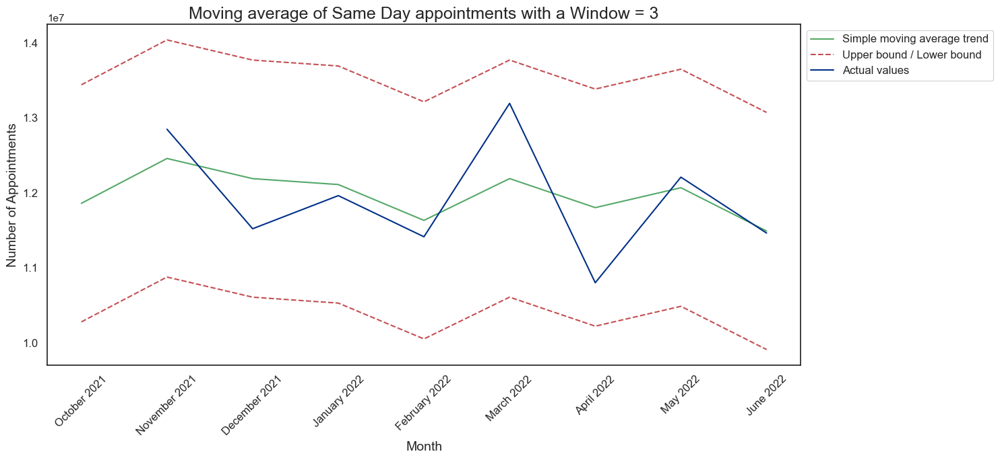

In [444]:
# Define plot size
plt.figure(figsize=(15,7))


# Plot the moving average chart using the user-defined function
plot_moving_average(df_0.count_of_appointments, 3, plot_intervals=True)

# Apply the user-defined function to standardize all charts
chart_clean('Moving average of Same Day appointments with a Window = 3',
            'Month',
            'Number of Appointments',
            '')


# Save the generated chart
plt.savefig('same_day.png',dpi=300,bbox_inches='tight')
plt.show()


<Figure size 1500x700 with 0 Axes>

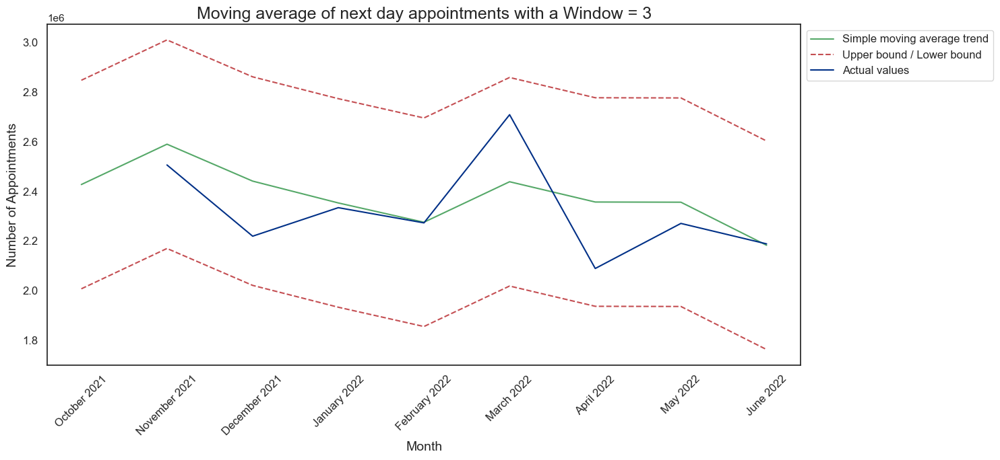

In [445]:
# Define plot size
plt.figure(figsize=(15,7))


# Plot the moving average chart using the user-defined function
plot_moving_average(df_1.count_of_appointments, 3, plot_intervals=True)

# Apply the user-defined function to standardize all charts
chart_clean('Moving average of next day appointments with a Window = 3',
            'Month',
            'Number of Appointments',
            '')



plt.show()

<Figure size 1500x700 with 0 Axes>

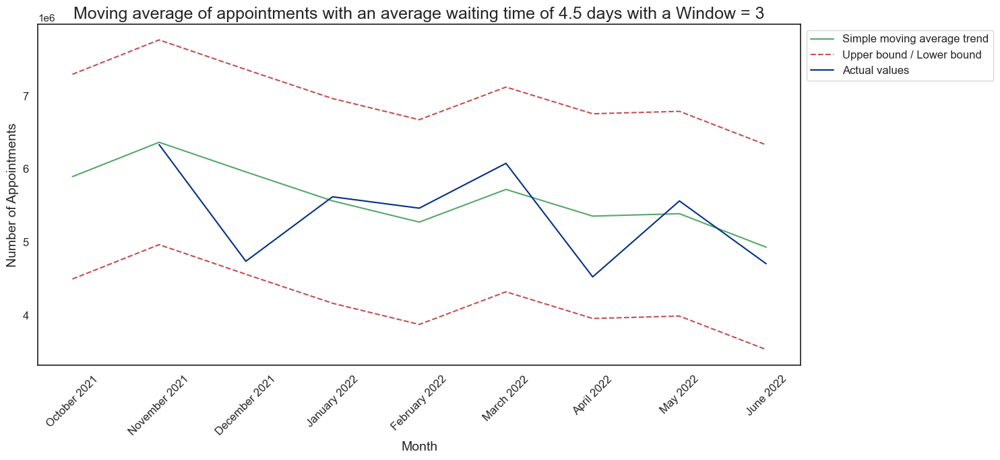

In [446]:
# Define plot size
plt.figure(figsize=(15,7))


# Plot the moving average chart using the user-defined function
plot_moving_average(df_4.count_of_appointments, 3, plot_intervals=True)

# Apply the user-defined function to standardize all charts
chart_clean('Moving average of appointments with an average waiting time of 4.5 days with a Window = 3',
            'Month',
            'Number of Appointments',
            '')



plt.show()

<Figure size 1500x700 with 0 Axes>

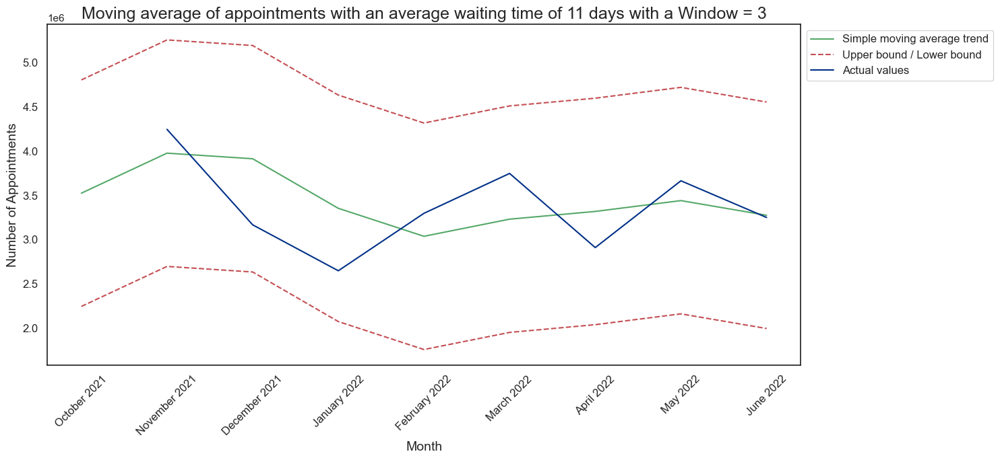

In [447]:
# Define plot size
plt.figure(figsize=(15,7))


# Plot the moving average chart using the user-defined function
plot_moving_average(df_11.count_of_appointments, 3, plot_intervals=True)

# Apply the user-defined function to standardize all charts
chart_clean('Moving average of appointments with an average waiting time of 11 days with a Window = 3',
            'Month',
            'Number of Appointments',
            '')



plt.show()

<Figure size 1500x700 with 0 Axes>

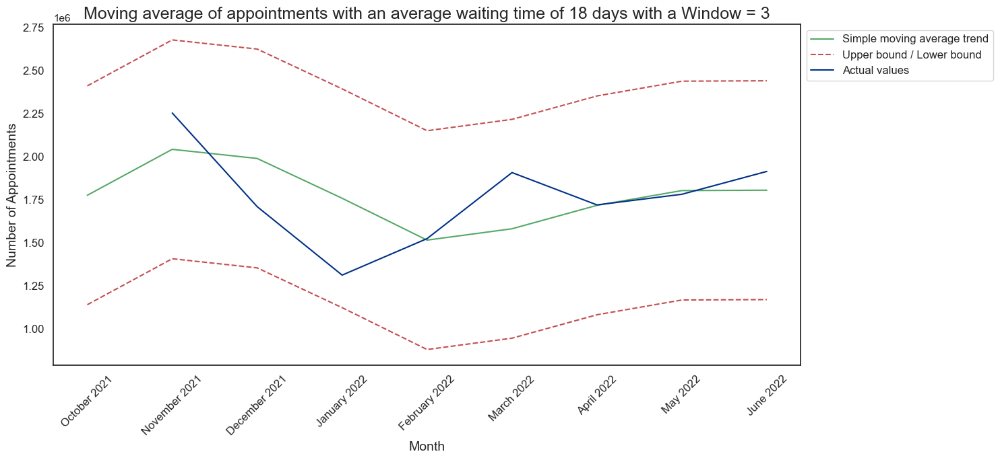

In [448]:
# Define plot size
plt.figure(figsize=(15,7))


# Plot the moving average chart using the user-defined function
plot_moving_average(df_18.count_of_appointments, 3, plot_intervals=True)

# Apply the user-defined function to standardize all charts
chart_clean('Moving average of appointments with an average waiting time of 18 days with a Window = 3',
            'Month',
            'Number of Appointments',
            '')


# Save the generated chart
plt.savefig('18 days.png',dpi=300,bbox_inches='tight')
plt.show()


<Figure size 1500x700 with 0 Axes>

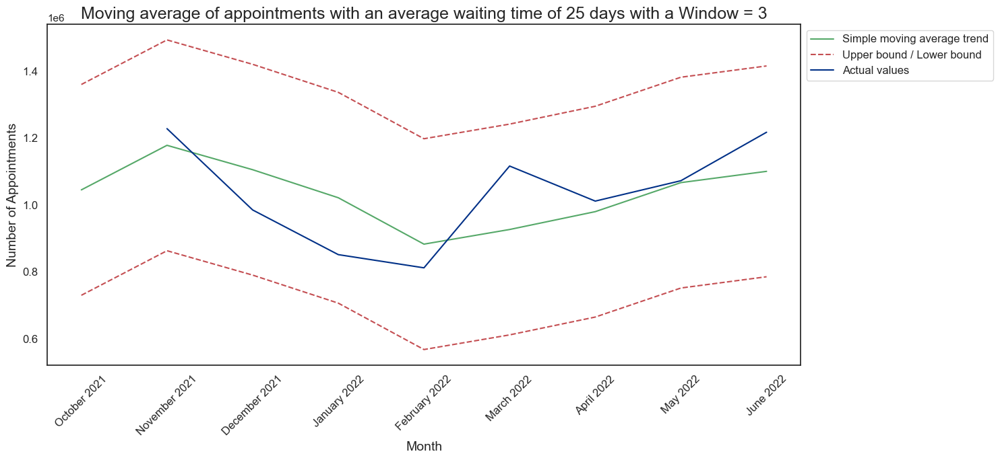

In [449]:
# Define plot size
plt.figure(figsize=(15,7))


# Plot the moving average chart using the user-defined function
plot_moving_average(df_25.count_of_appointments, 3, plot_intervals=True)

# Apply the user-defined function to standardize all charts
chart_clean('Moving average of appointments with an average waiting time of 25 days with a Window = 3',
            'Month',
            'Number of Appointments',
            '')



plt.show()

<Figure size 1500x700 with 0 Axes>

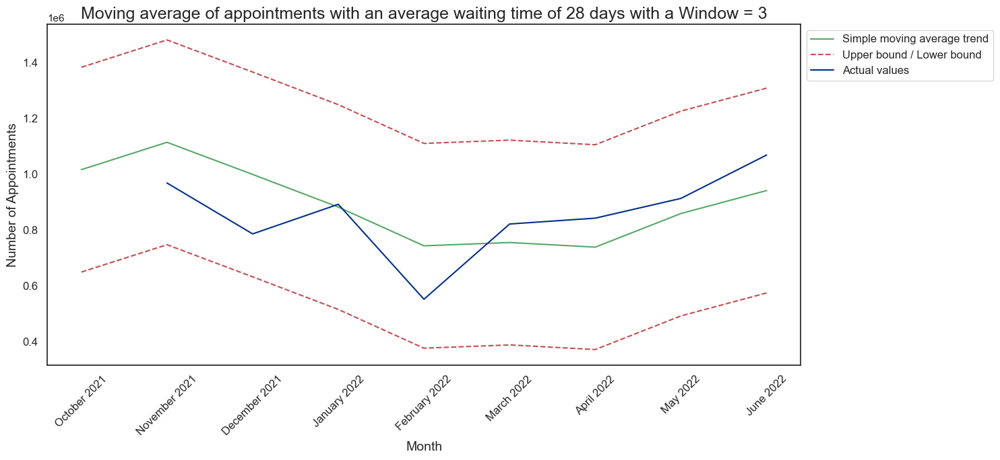

In [450]:
# Define plot size
plt.figure(figsize=(15,7))


# Plot the moving average chart using the user-defined function
plot_moving_average(df_28.count_of_appointments, 3, plot_intervals=True)

# Apply the user-defined function to standardize all charts
chart_clean('Moving average of appointments with an average waiting time of 28 days with a Window = 3',
            'Month',
            'Number of Appointments',
            '')



plt.show()

## Service Setting

Looking at apointments broken down by their service settings shows the following:
- General practice appointment stabilized after the sudden increase in November 2021. 
- Extended Access Provision and Primary care appointments have a positive slope suggesting an increase over the coming months.
This is confirmed to be part of the NHS's plan to flexibly cater to the local needs by offering appointments outside of the regular working hours.

source: https://www.england.nhs.uk/gp/investment/gp-contract/network-contract-directed-enhanced-service-des/enhanced-access-faqs/

- Other appointments follow the same pattern as for the General Practice.
- Primary care appointments have a positive slope suggesting an increase over the coming months.
- Unmapped show a negative slope which is consistent with other finding and it suggests an improve in data quality.

In [453]:
# Set the appointment_month column as an index to show on the moving average chart
nc_ss = nc_ss.set_index('appointment_month_str')
#nc_ss


In [454]:
# Data set for General Practice appointments
df_gp = nc_ss[nc_ss['service_setting']=='General Practice']
print(df_gp.shape)


# Data set for Extended Access Provision appointments
df_ea = nc_ss[nc_ss['service_setting']=='Extended Access Provision']
#print(df_ea.shape)


# Data set for Other appointments
df_oa = nc_ss[nc_ss['service_setting']=='Other']
#print(df_oa.shape)


# Data set for Primary Care Network appointments
df_pc = nc_ss[nc_ss['service_setting']=='Primary Care Network']
#print(df_pc.shape)


# Data set for Unmapped appointments
df_un = nc_ss[nc_ss['service_setting']=='Unmapped']
#print(df_un.shape)

(11, 3)


No outliers were identified for all service setting appointments

In [456]:
# Create boxplot
#ax = sns.boxplot(x=df_gp['count_of_appointments'], whis=1.5)

In [457]:
# Create boxplot
#ax = sns.boxplot(x=df_ea['count_of_appointments'], whis=1.5)

In [458]:
# Create boxplot
#ax = sns.boxplot(x=df_oa['count_of_appointments'], whis=1.5)

In [459]:
# Create boxplot
#ax = sns.boxplot(x=df_pc['count_of_appointments'], whis=1.5)

In [460]:
# Create boxplot
#ax = sns.boxplot(x=df_un['count_of_appointments'], whis=1.5)

<Figure size 1500x700 with 0 Axes>

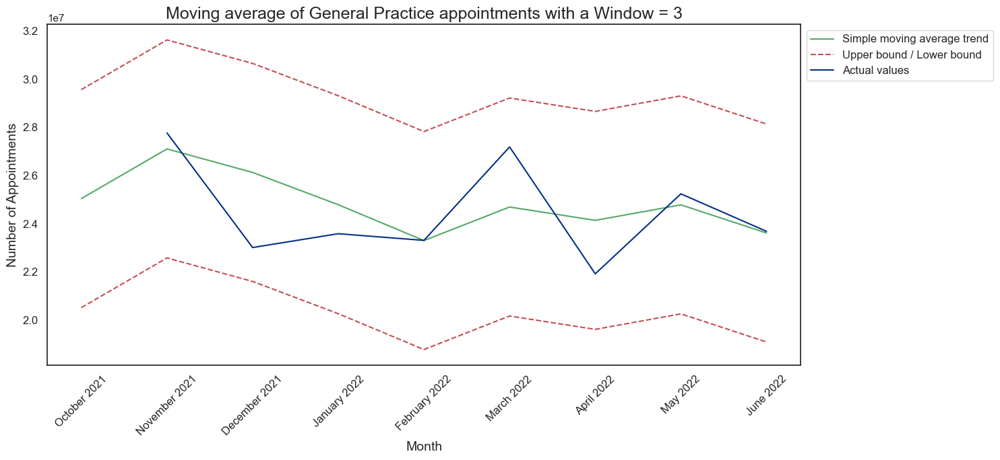

In [461]:
# Define plot size
plt.figure(figsize=(15,7))


# Plot the moving average chart using the user-defined function
plot_moving_average(df_gp.count_of_appointments, 3, plot_intervals=True)

# Apply the user-defined function to standardize all charts
chart_clean('Moving average of General Practice appointments with a Window = 3',
            'Month',
            'Number of Appointments',
            '')



plt.show()

<Figure size 1500x700 with 0 Axes>

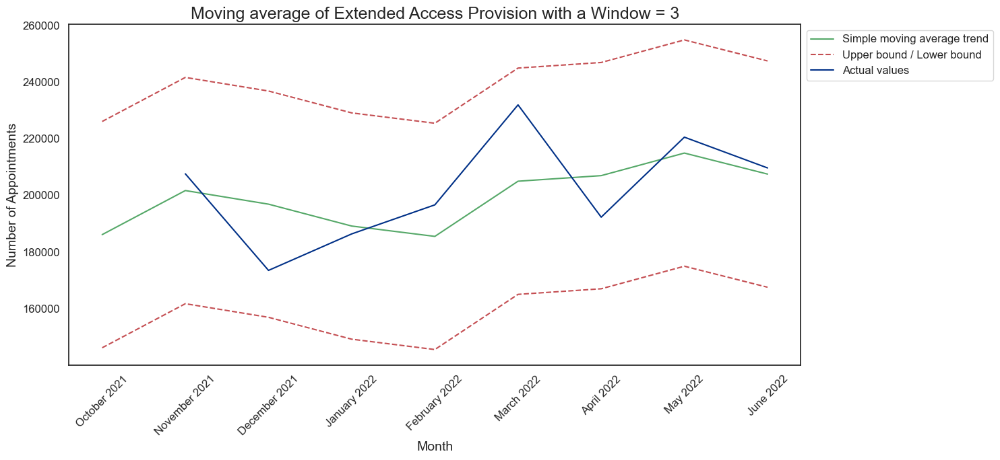

In [462]:
# Define plot size
plt.figure(figsize=(15,7))


# Plot the moving average chart using the user-defined function
plot_moving_average(df_ea.count_of_appointments, 3, plot_intervals=True)

# Apply the user-defined function to standardize all charts
chart_clean('Moving average of Extended Access Provision with a Window = 3',
            'Month',
            'Number of Appointments',
            '')


# Save the generated chart
plt.savefig('extended_access.png',dpi=300,bbox_inches='tight')
plt.show()


<Figure size 1500x700 with 0 Axes>

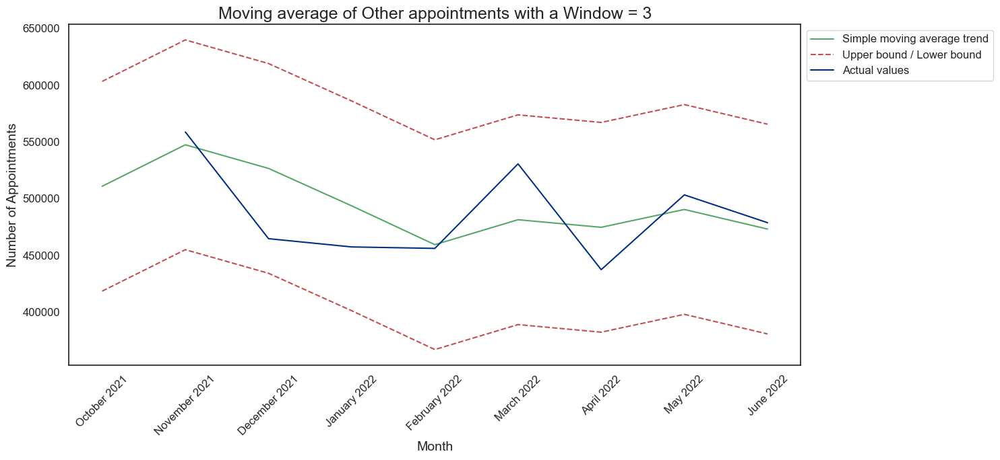

In [463]:
# Define plot size
plt.figure(figsize=(15,7))


# Plot the moving average chart using the user-defined function
plot_moving_average(df_oa.count_of_appointments, 3, plot_intervals=True)

# Apply the user-defined function to standardize all charts
chart_clean('Moving average of Other appointments with a Window = 3',
            'Month',
            'Number of Appointments',
            '')



plt.show()

<Figure size 1500x700 with 0 Axes>

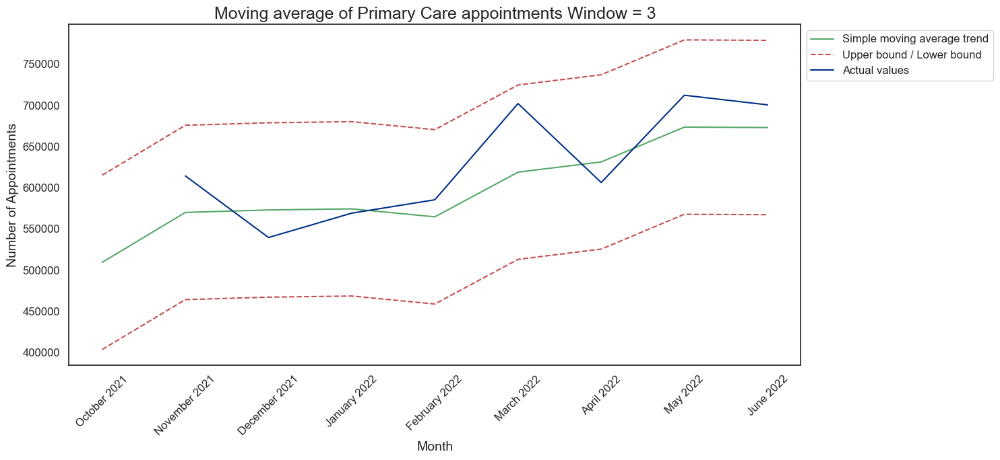

In [464]:
# Define plot size
plt.figure(figsize=(15,7))


# Plot the moving average chart using the user-defined function
plot_moving_average(df_pc.count_of_appointments, 3, plot_intervals=True)

# Apply the user-defined function to standardize all charts
chart_clean('Moving average of Primary Care appointments Window = 3',
            'Month',
            'Number of Appointments',
            '')


# Save the generated chart
plt.savefig('primary_care.png',dpi=300,bbox_inches='tight')
plt.show()


<Figure size 1500x700 with 0 Axes>

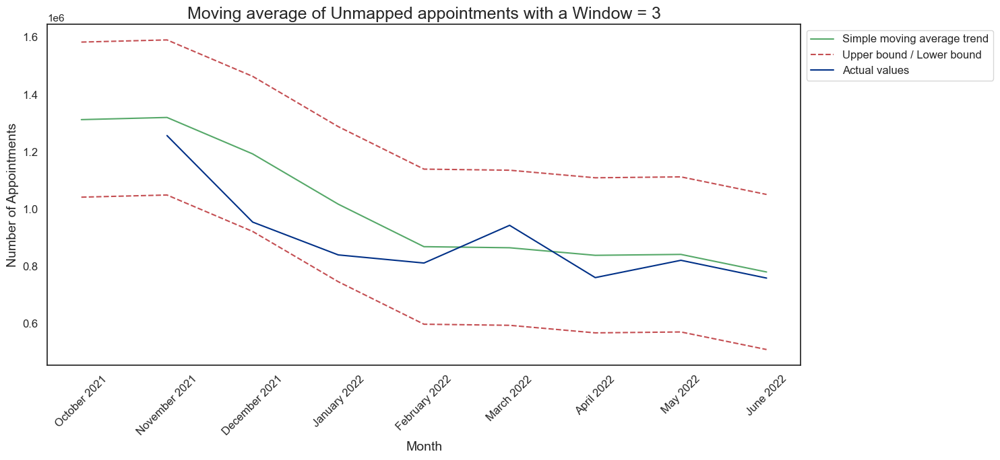

In [465]:
# Define plot size
plt.figure(figsize=(15,7))


# Plot the moving average chart using the user-defined function
plot_moving_average(df_un.count_of_appointments, 3, plot_intervals=True)

# Apply the user-defined function to standardize all charts
chart_clean('Moving average of Unmapped appointments with a Window = 3',
            'Month',
            'Number of Appointments',
            '')



plt.show()

# Summary of Findings

After analyzing all the different aspects of the data and after also including external data to back the analysis up, the following can be concluded:
- The number of appointments sunk drastically during the pandemic and that's expected given the lockdowns and the imposed restrictions
- The number of actual appointments didn't exceed the maximum utilization on any month/region and that's even during the pandemic period
- That being said, the coming months will see an increase in wait time between appointment and consultation. This was confirmed by analyzing the moving average charts of each time bracket
- Appointments with a wait time of less than 11 days are showing a negative slope, while appointments with longer wait times are showing a positive slope.
- A detailed analysis of staff capacity, training/re-training periods, and turn-over would be necessary to analyze the reasons behind the longer wait times. It could also be due to the patients' requests but this is a limitation of the current data. 
- The peak in the number of appointments in November 2021 was mainly due to covid vaccinations and this is a pattern that is not to be expected in the coming months.
- The Moving average chart for the actual number of appointments shows a flattening of the curve in 2022.
- The patient contact care during home rounds appointments are expected to increase over the coming months and that's also confirmed by the increase noticed in the population data in the care home age group.
- The efforts to reduce the number of DNA appointments have shown significant effects on the pattern of the curve. Further implementation of appointment reminders and clear appointment communication would result in further reductions in the DNA appointments.
- Primary care and extended access provision are showing a positive slope, while the General Practice appointments are on a decreasing curve in 2022. This conforms to the NHS plan to flexibly cater to the local population's needs by providing services outside of the network's regular hours. 
- Twitter data is incomplete as it doesn't provide other important engagement and impressions metrics, it also doesn't provide the date of the tweet for relevance. Paired with a tool for sentiment analysis, it could be useful as it would give the NHS a sense of the perception of the quality of the network's services or general guidance on topics of interest. 


# Recommendations

- Focus new hires on primary care and extended access services to cater flexibly to the local needs and reduce wait times.
- This could be focused on the 4 top regions: Midlands, North East and Yorkshire, South East & London
- Staff hiring should also be focused on elderly care services to meet the needs of the aging population.
- Aim to increase the percentage of FTE Staff from 75% to an achievable percentage by 2030
- Do a follow-up analysis in 2 years to check on the progress and status of the network 
